In [6]:
import spyglass.common as sgc
from spyglass_hexmaze.hex_maze_behavior import HexMazeBlock
from hexmaze import plot_hex_maze

import matplotlib.pyplot as plt
import numpy as np
 
PORT_COLORS = {"A": "#1a3a8c", "B": "#3aa65a", "C": "#f5a623"}
HEX_COLORS = {
    "A": (0.102, 0.227, 0.549, 1.0),
    "B": (0.227, 0.651, 0.353, 1.0),
    "C": (0.961, 0.647, 0.137, 1.0),
}
PORT_Y      = {"A": 3, "B": 2, "C": 1}
 
def plot_port_choices(ports, rewards, block_breaks=[]):
    n_trials = len(ports)

    cell = 0.15 # inches per grid cell
    fig, ax = plt.subplots(figsize=(n_trials * cell, 24 * cell))

    # Plot circles for each port visit 
    for i, (port, reward) in enumerate(zip(ports, rewards), start=1):
        color = PORT_COLORS[port]
        y = PORT_Y[port]
        if reward:
            ax.scatter(i, y, color=color, s=80, zorder=2, linewidths=0)
        else:
            ax.scatter(i, y, facecolors="white", edgecolors=color, s=80, linewidths=1.4, zorder=2)

    # Plot lines for block changes
    for b in block_breaks:
        ax.axvline(b + 0.5, color="red", linewidth=1.0, zorder=3)
        ax.scatter(b + 0.5, 3.8, marker="v", color="red", s=60, zorder=4, clip_on=False)
 
    # Grid (minor ticks at cell edges so dots sit centered)
    ax.set_xticks(range(1, n_trials + 1))
    ax.set_yticks([1, 2, 3])
    ax.set_xticklabels(range(1, n_trials + 1), fontsize=9)
    ax.set_yticklabels(["C", "B", "A"], fontsize=9)
    ax.set_xticks(np.arange(0.5, n_trials + 1.5), minor=True)
    ax.set_yticks([0.5, 1.5, 2.5, 3.5], minor=True)
    ax.set_xlim(0.5, n_trials + 0.5)
    ax.set_ylim(0.5, 3.5)
    ax.set_aspect("equal")
    ax.grid(True, which="minor", linestyle="-", linewidth=0.4, color="#cccccc", zorder=0)
    ax.tick_params(which="minor", length=0)
    ax.set_axisbelow(True)
 
    # Show every 10th trial num
    for i, label in enumerate(ax.xaxis.get_ticklabels()):
        label.set_visible((i + 1) % 10 == 0)
    ax.set_xlabel("Trial number", fontsize=10)
    ax.set_ylabel("Port", fontsize=10)
    ax.spines[["top", "right"]].set_visible(False)

    return fig, ax

In [3]:
all_hexmaze_nwbs = list(set(HexMazeBlock().fetch("nwb_file_name")))
print(f"{len(all_hexmaze_nwbs)} hex maze nwbs:")
for nwb_name in sorted(all_hexmaze_nwbs):
    print(nwb_name)

59 hex maze nwbs:
BraveLu20240516_.nwb
BraveLu20240518_.nwb
BraveLu20240519_.nwb
BraveLu20240615_.nwb
BraveLu20240617_.nwb
BraveLu20240619_.nwb
BraveLu20240622_.nwb
IM-1478_20220719_.nwb
IM-1478_20220720_.nwb
IM-1478_20220724_.nwb
IM-1478_20220725_.nwb
IM-1478_20220726_.nwb
IM-1478_20220727_.nwb
IM-1594_20230725_.nwb
IM-1594_20230726_.nwb
IM-1830_pacquiao_20250217_.nwb
IM-1830_pacquiao_20250224_.nwb
IM-1830_pacquiao_20250226_.nwb
IM-1830_pacquiao_20250227_.nwb
IM-1830_pacquiao_20250228_.nwb
IM-1830_pacquiao_20250407_.nwb
IM-1844_elsa_20250408_.nwb
IM-1844_elsa_20250414_.nwb
IM-1844_elsa_20250418_.nwb
IM-1844_elsa_20250423_.nwb
IM-1844_elsa_20250424_.nwb
IM-1844_elsa_20250425_.nwb
IM-1844_elsa_20250426_.nwb
IM-1871_20250801_.nwb
IM-1890_otto_20250614_.nwb
IM-1890_otto_20250616_.nwb
IM-1890_otto_20250619_.nwb
IM-1890_otto_20250620_.nwb
IM-1890_otto_20250622_.nwb
IM-1891_jimmy_20250614_.nwb
IM-1891_jimmy_20250622_.nwb
IM-1941_20260207_.nwb
Lily20251214_.nwb
Lily20251221_.nwb
Luna20250218_

In [15]:
HexMazeBlock()

nwb_file_name name of the NWB file,epoch the session epoch for this task and apparatus(1 based),block the block number within the epoch,config_id maze configuration as a string,interval_list_name descriptive name of this interval list,p_a probability of reward at port A,p_b probability of reward at port B,p_c probability of reward at port C,num_trials number of trials in this block,task_type 'barrier shift' or 'probabilty shift'
BraveLu20240516_.nwb,1,1,"9,10,17,20,27,31,35,43,47",epoch1_block1,90.0,10.0,50.0,69,probability change
BraveLu20240516_.nwb,1,2,"9,10,17,20,27,31,35,43,47",epoch1_block2,50.0,90.0,10.0,69,probability change
BraveLu20240516_.nwb,1,3,"9,10,17,20,27,31,35,43,47",epoch1_block3,50.0,10.0,90.0,67,probability change
BraveLu20240516_.nwb,3,1,"8,13,21,23,24,28,37,44,46",epoch3_block1,50.0,90.0,10.0,70,barrier change
BraveLu20240516_.nwb,3,2,"8,13,21,23,28,30,37,44,46",epoch3_block2,50.0,90.0,10.0,69,barrier change
BraveLu20240516_.nwb,3,3,"8,13,23,24,28,30,37,44,46",epoch3_block3,50.0,90.0,10.0,68,barrier change
BraveLu20240516_.nwb,5,1,"10,12,18,29,31,33,38,40,46",epoch5_block1,10.0,50.0,90.0,66,probability change
BraveLu20240516_.nwb,5,2,"10,12,18,29,31,33,38,40,46",epoch5_block2,90.0,10.0,50.0,66,probability change
BraveLu20240516_.nwb,5,3,"10,12,18,29,31,33,38,40,46",epoch5_block3,50.0,90.0,10.0,66,probability change
BraveLu20240516_.nwb,7,1,"9,10,15,21,24,29,32,36,41",epoch7_block1,10.0,50.0,90.0,85,barrier change


{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


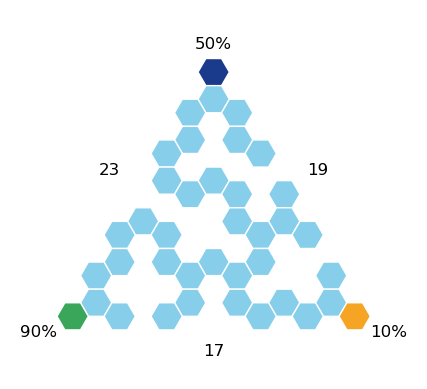

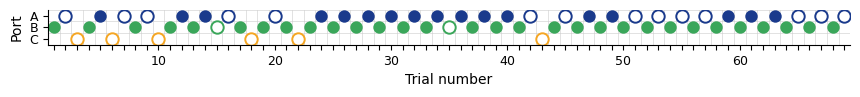

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


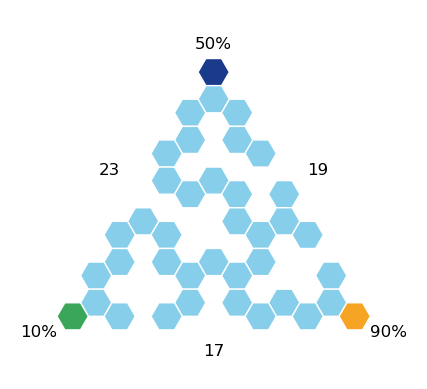

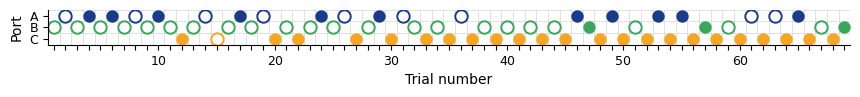

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


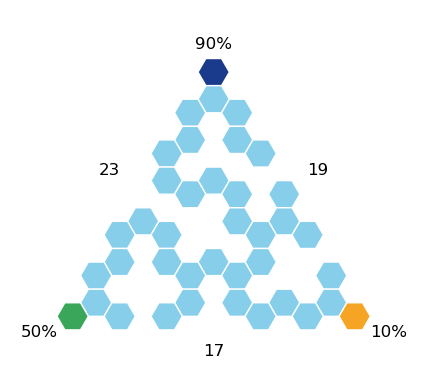

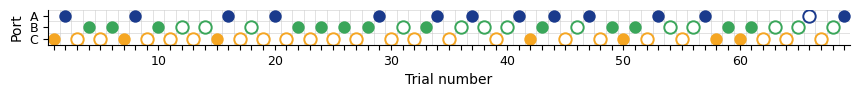

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


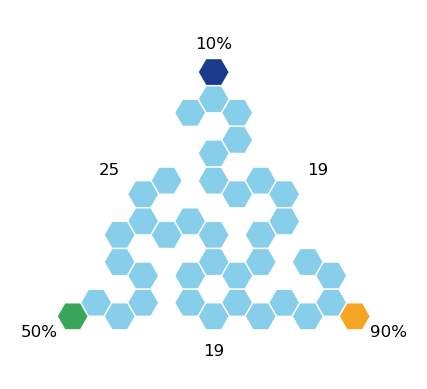

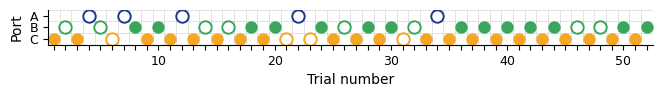

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


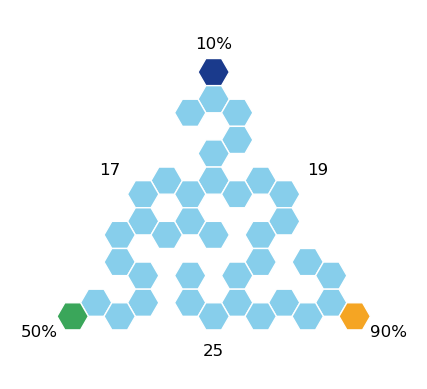

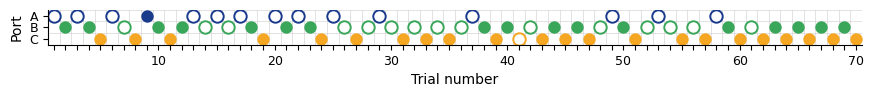

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


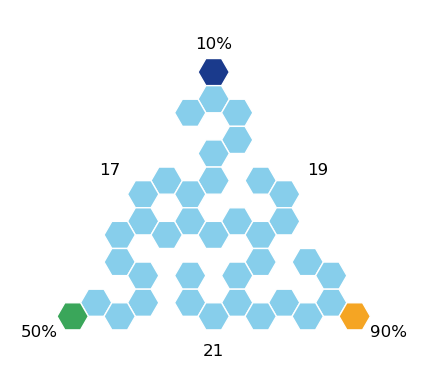

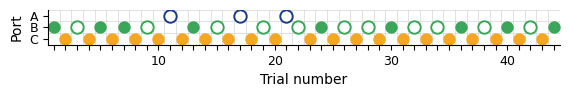

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


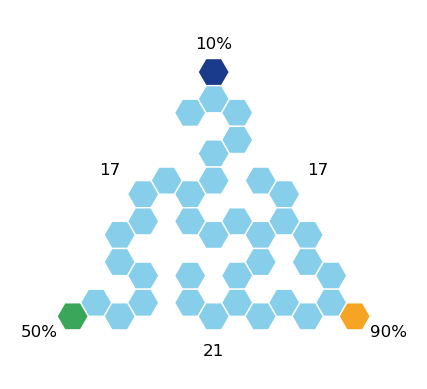

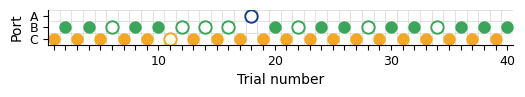

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 5}: HexmazeNoStim


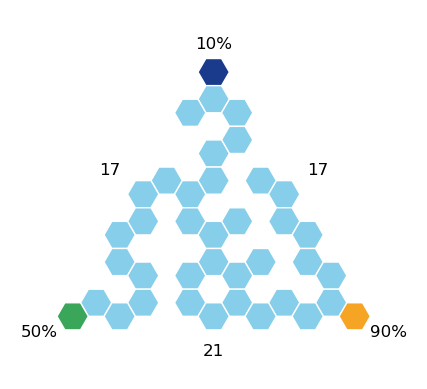

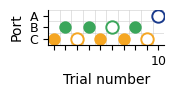

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


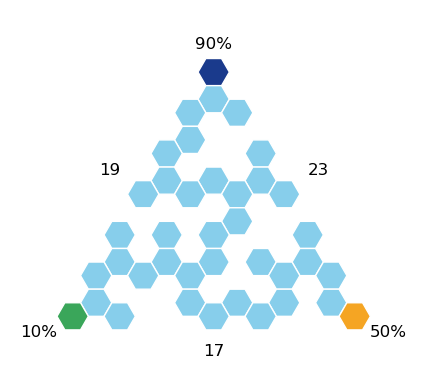

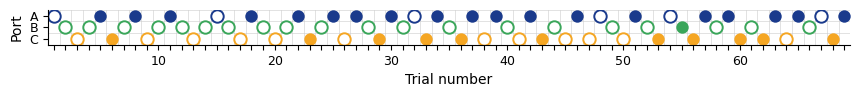

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


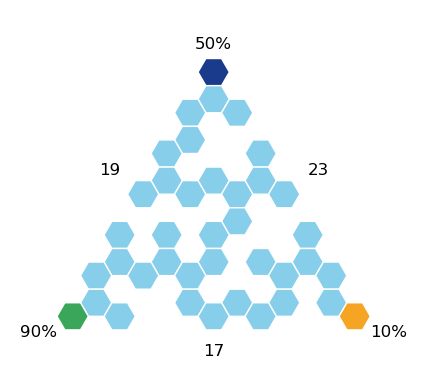

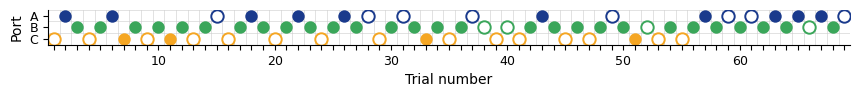

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


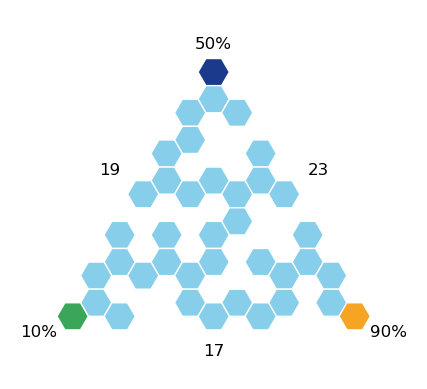

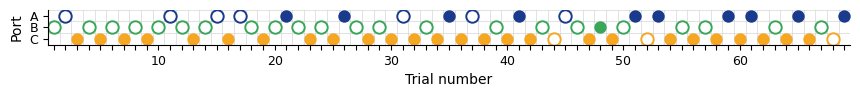

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


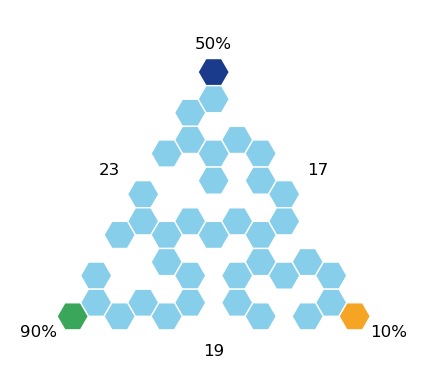

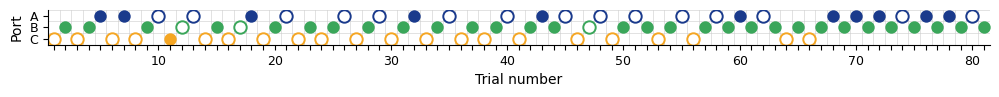

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


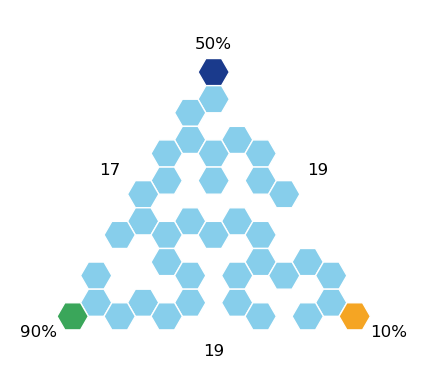

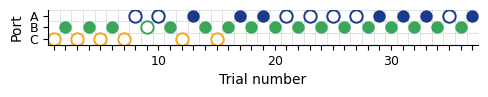

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


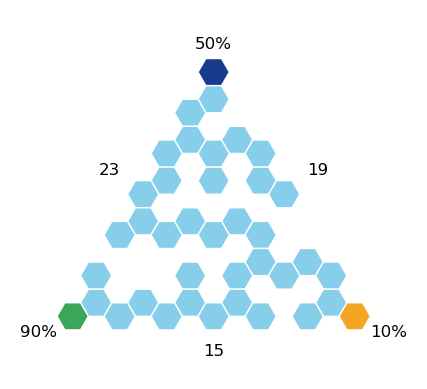

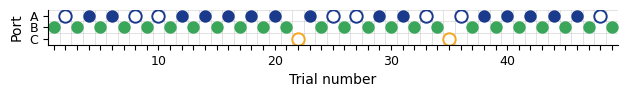

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


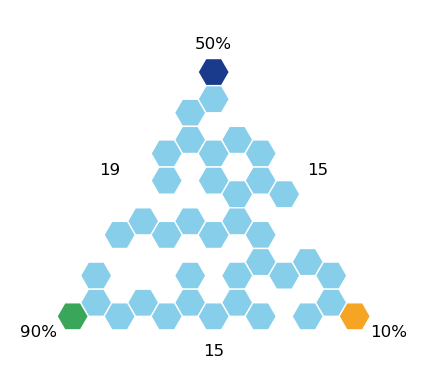

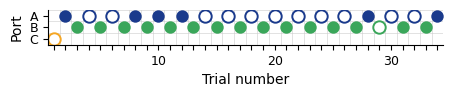

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


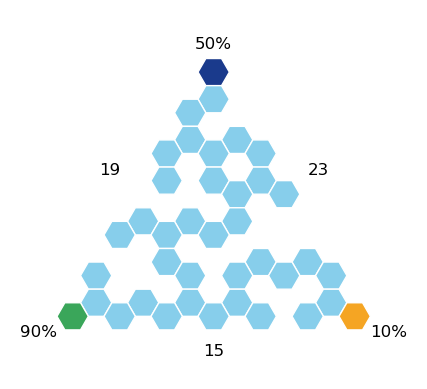

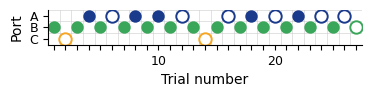

In [8]:
entry = HexMazeBlock() & "nwb_file_name LIKE 'Toby20250316%'"
nwb_file_names = list(set(entry.fetch("nwb_file_name")))

for key in entry.fetch("KEY", order_by="nwb_file_name, epoch, block"):
    # Get block info
    print(f"{key}: {(sgc.Session() & key).fetch('session_description')[0]}")
    block = HexMazeBlock() & key
    trials = HexMazeBlock.Trial() & key
    # Plot maze
    maze = block.fetch("config_id")[0]
    reward_probs = [int(block.fetch("p_a")[0]), int(block.fetch("p_b")[0]), int(block.fetch("p_c")[0])]
    plot_hex_maze(maze, show_barriers=False, show_stats=True, show_hex_labels=False, reward_probabilities=reward_probs,
                  highlight_hexes=[{1}, {2}, {3}], highlight_colors=[HEX_COLORS["A"], HEX_COLORS["B"], HEX_COLORS["C"]])
    # Plot trials
    fig, ax = plot_port_choices(trials.fetch("end_port"), trials.fetch("reward"))
    display(fig)
    plt.close(fig)

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


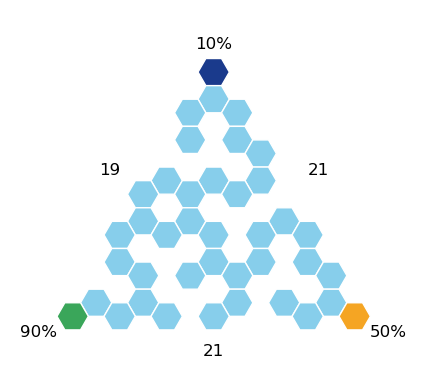

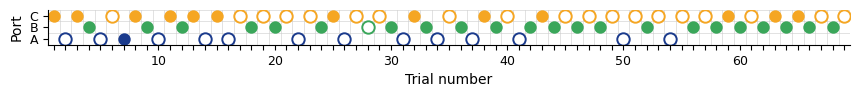

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


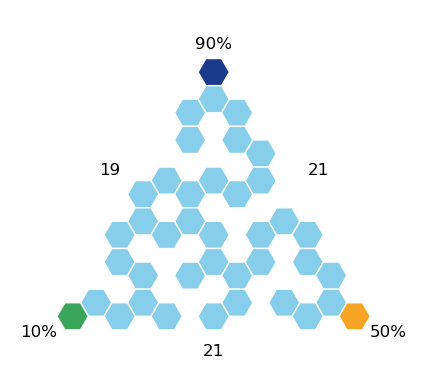

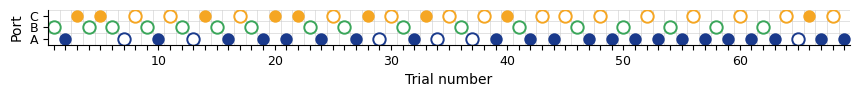

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


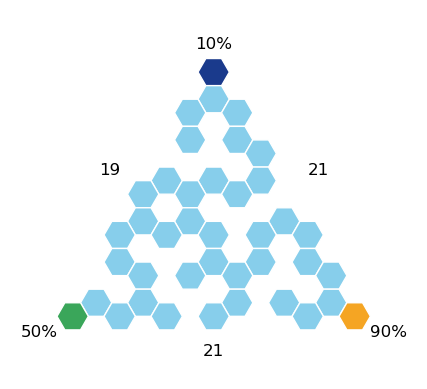

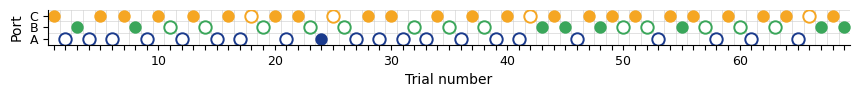

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


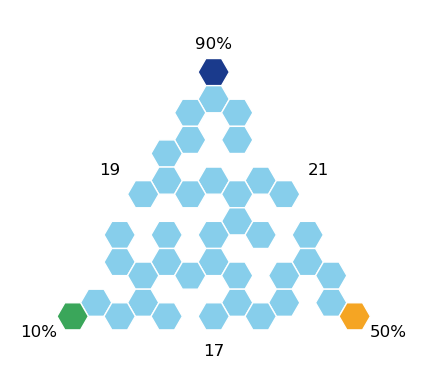

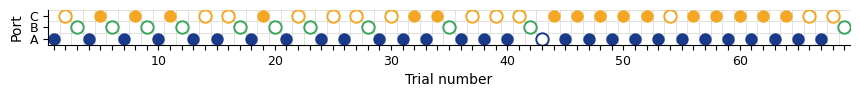

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


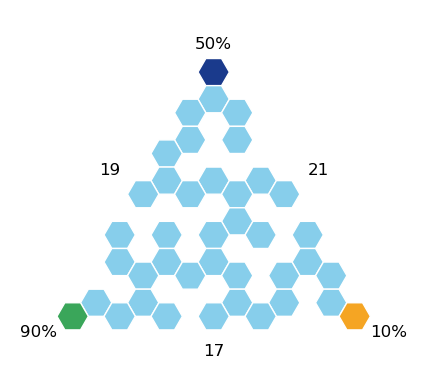

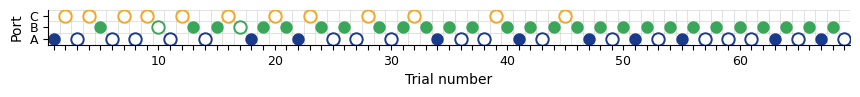

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


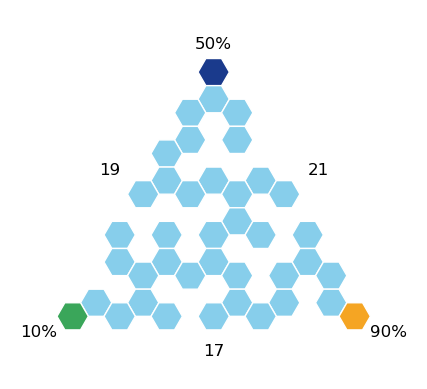

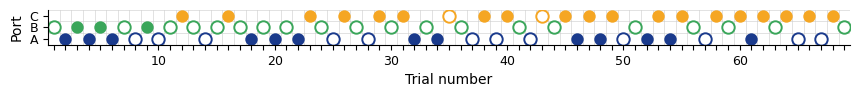

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


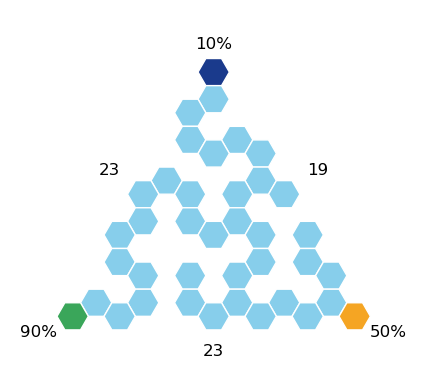

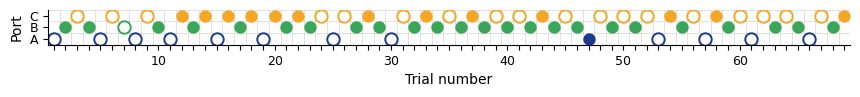

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


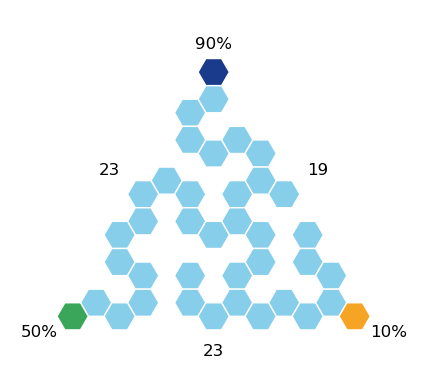

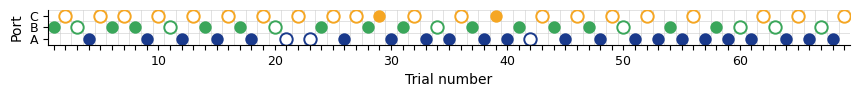

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


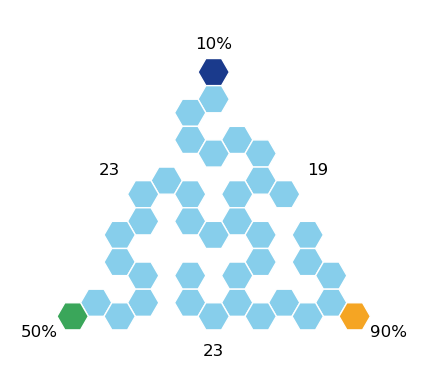

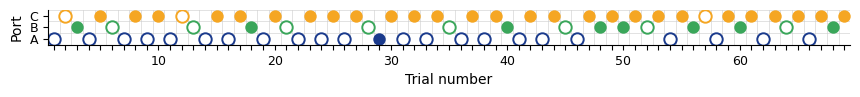

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


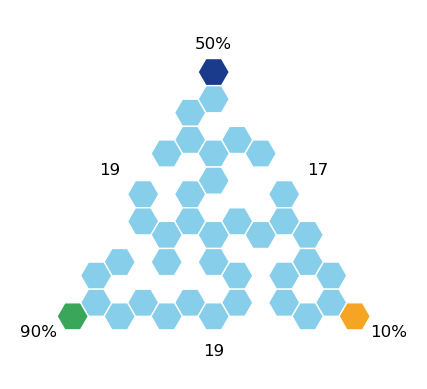

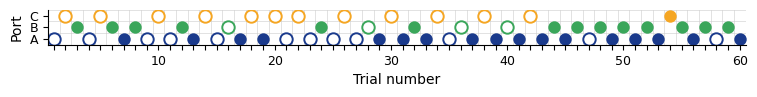

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


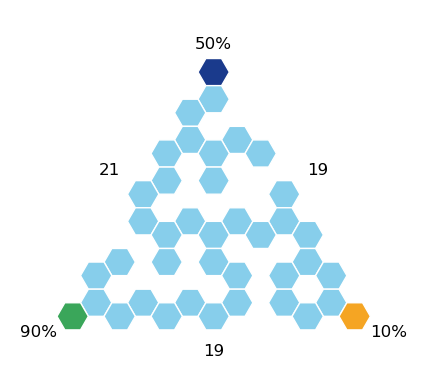

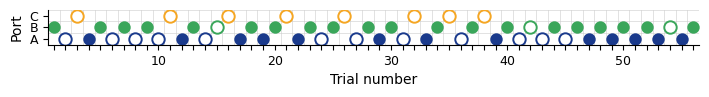

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


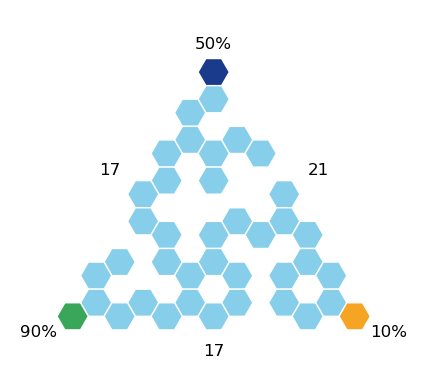

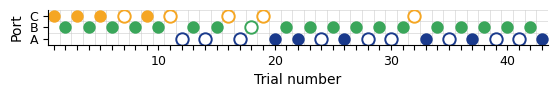

{'nwb_file_name': 'Toby20250310_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


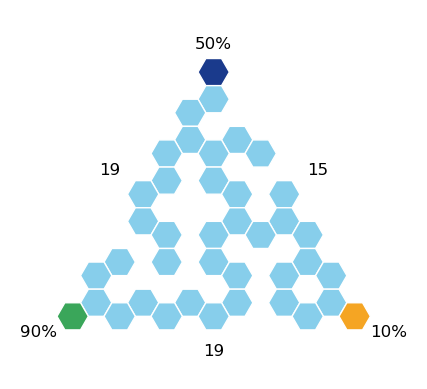

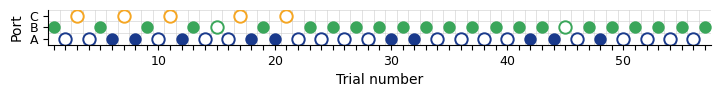

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


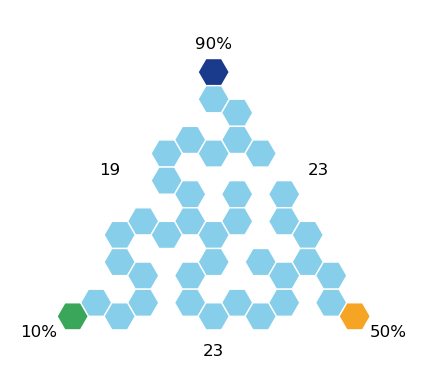

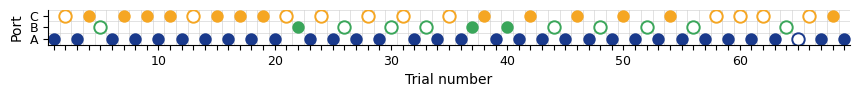

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


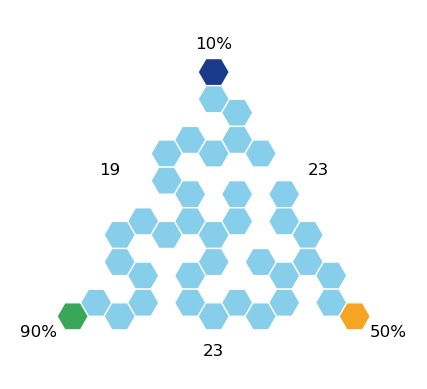

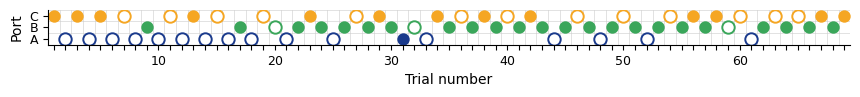

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


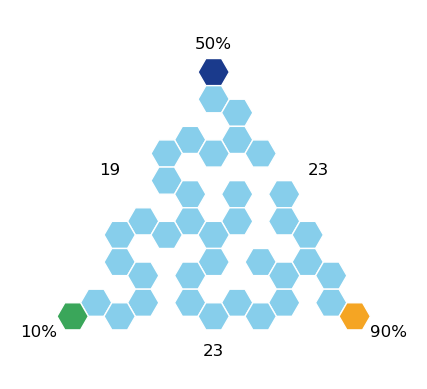

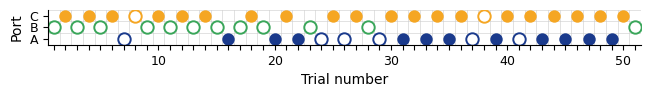

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


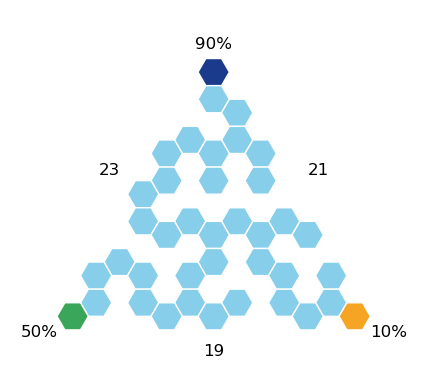

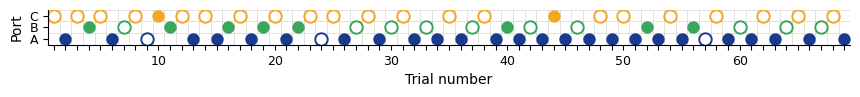

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


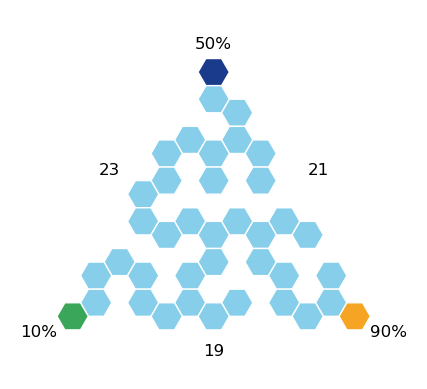

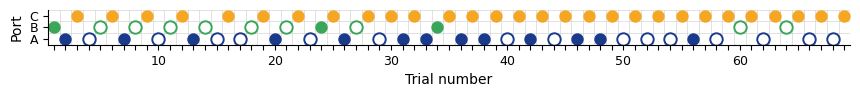

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


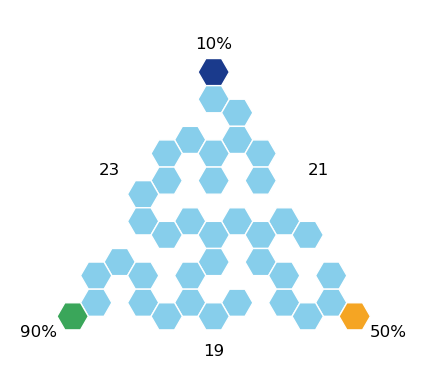

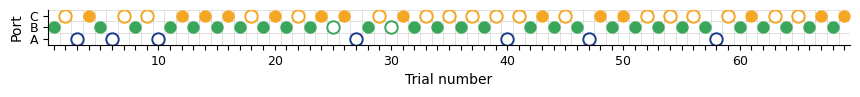

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


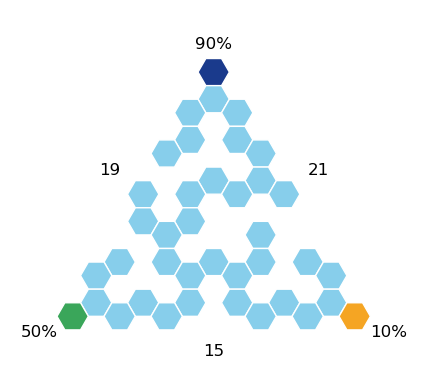

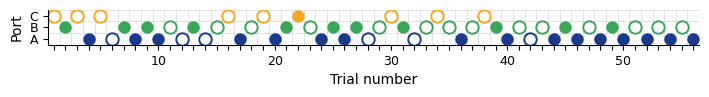

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


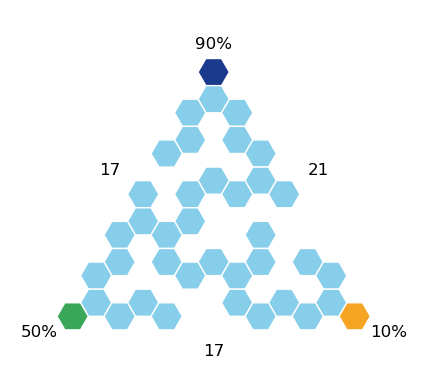

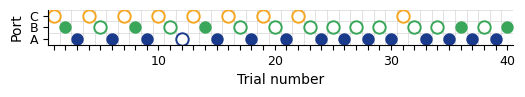

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


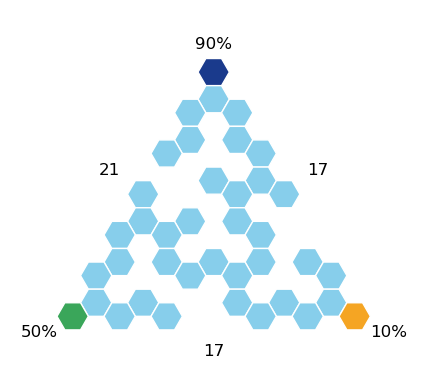

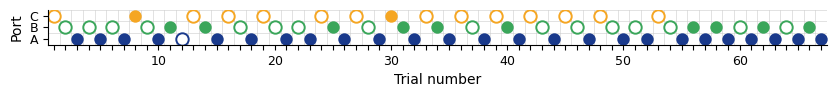

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 5, 'block': 4}: HexmazeNoStim


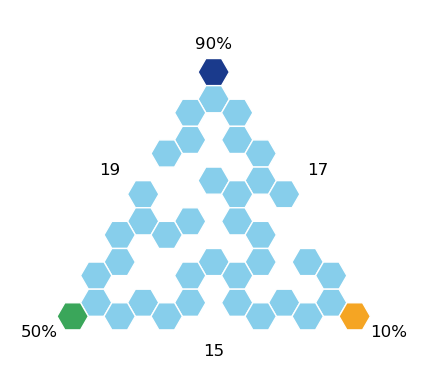

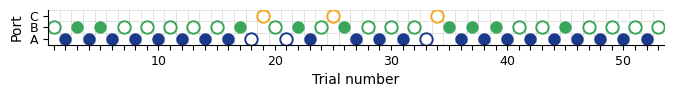

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


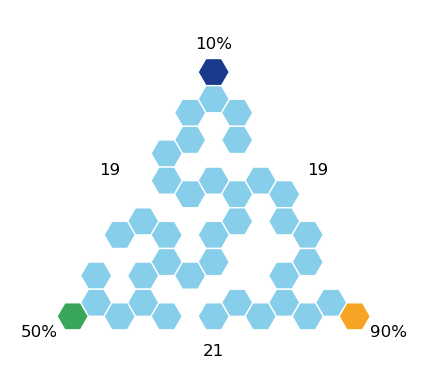

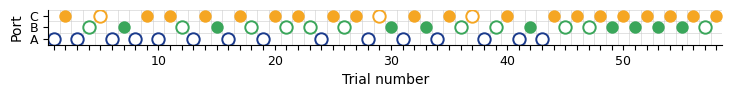

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


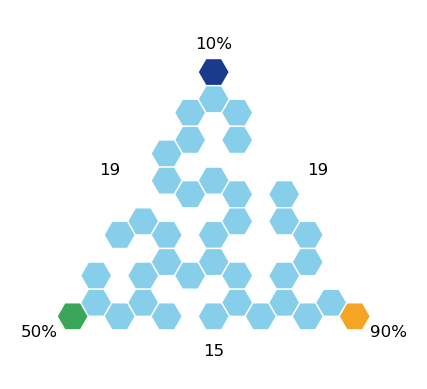

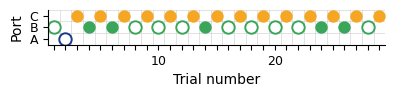

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


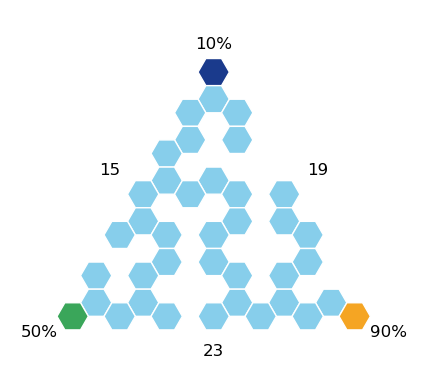

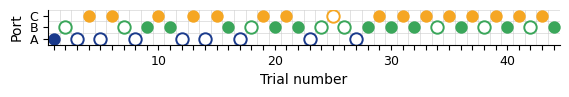

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


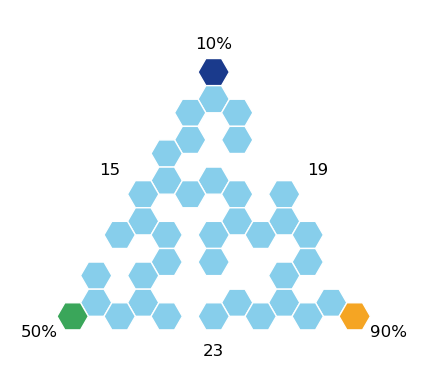

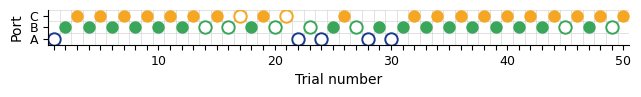

{'nwb_file_name': 'Toby20250311_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


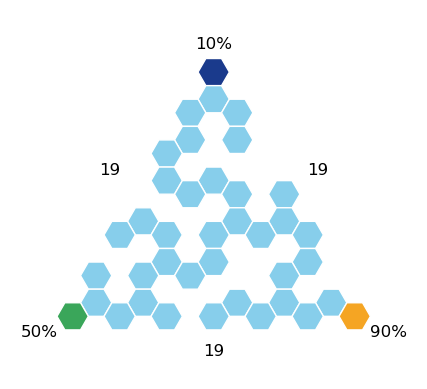

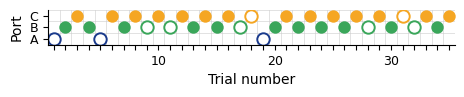

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


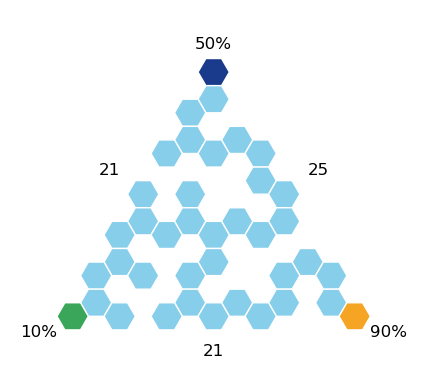

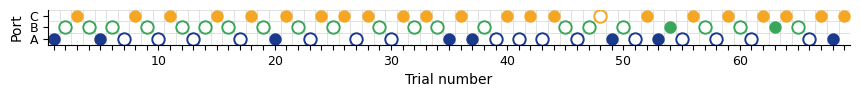

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


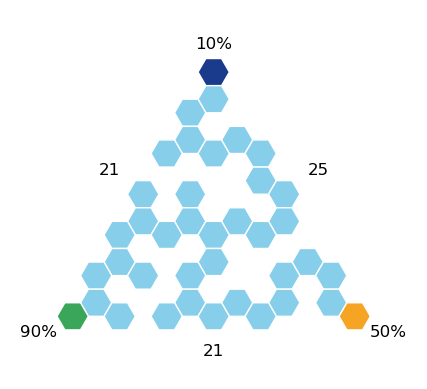

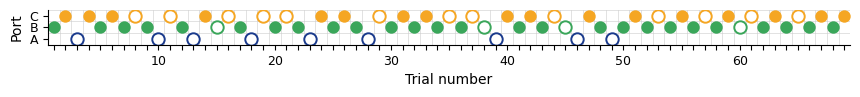

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


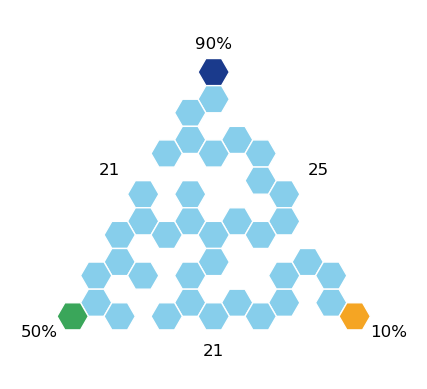

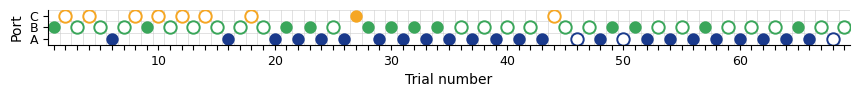

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


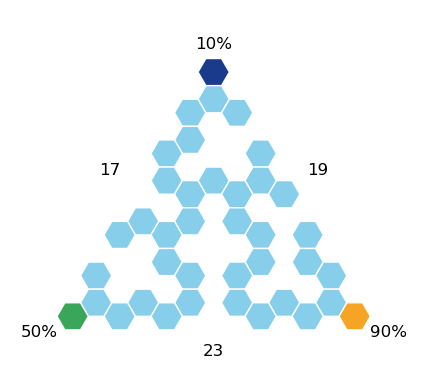

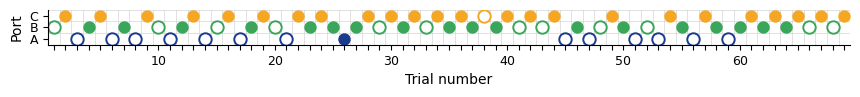

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


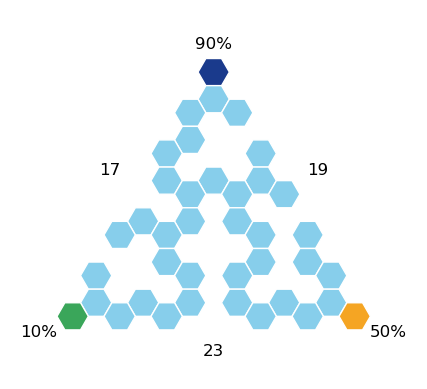

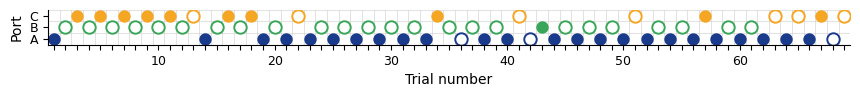

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


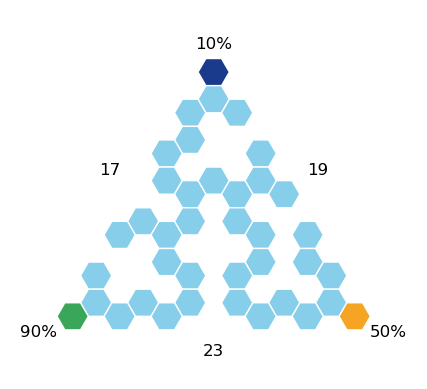

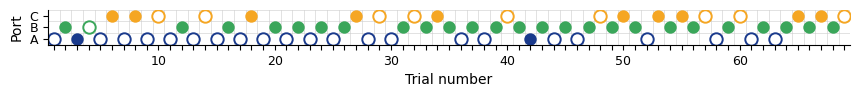

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


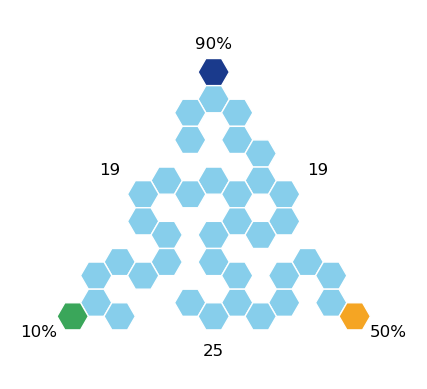

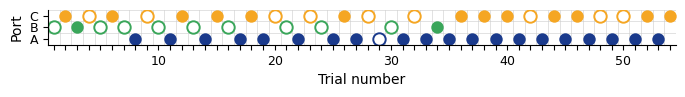

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


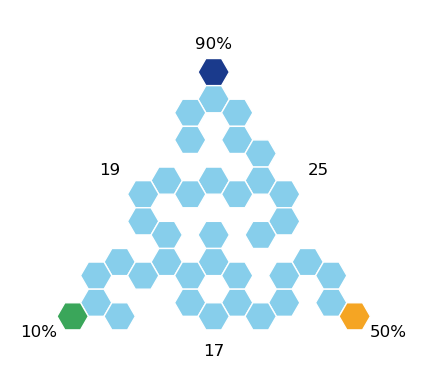

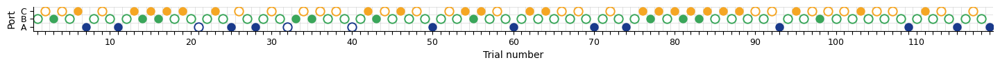

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


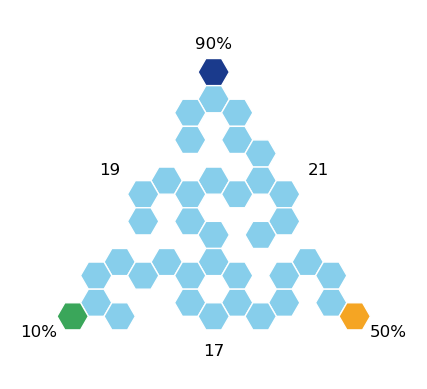

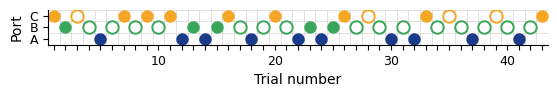

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


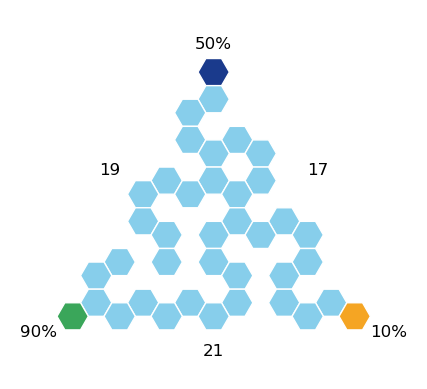

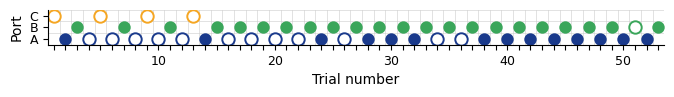

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


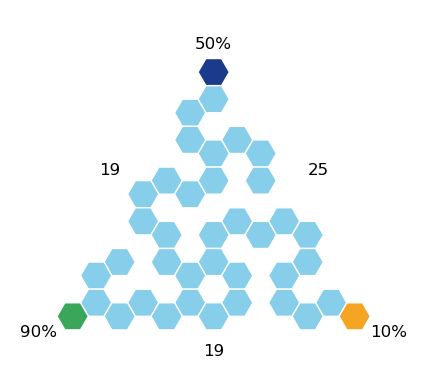

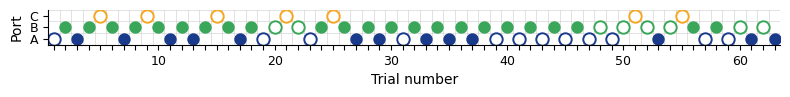

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


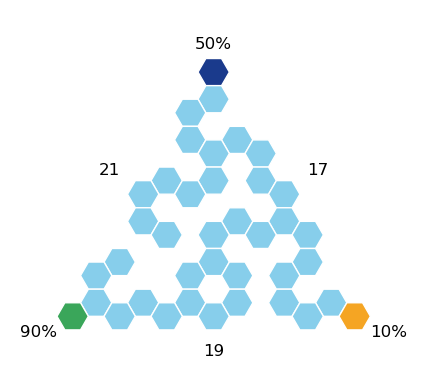

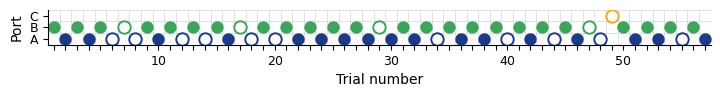

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


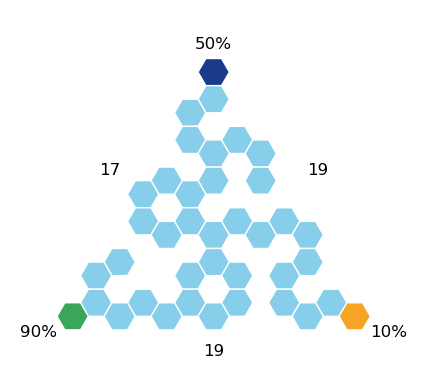

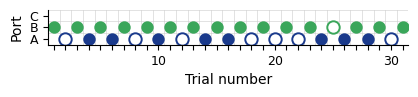

{'nwb_file_name': 'Toby20250312_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


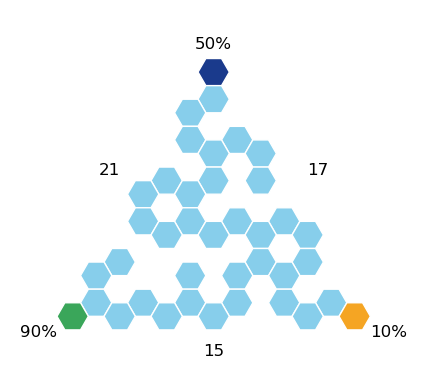

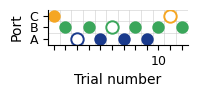

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


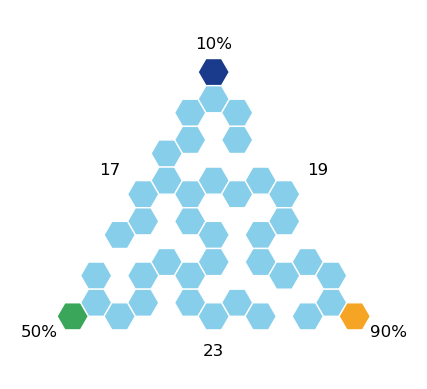

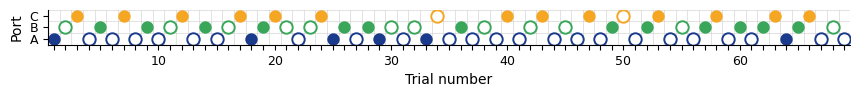

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


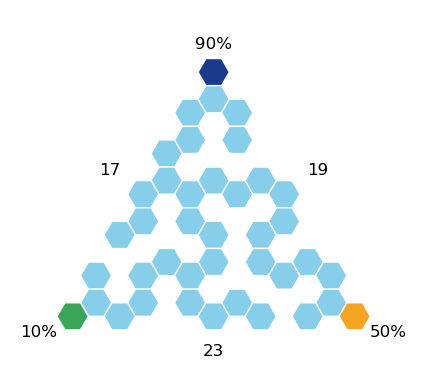

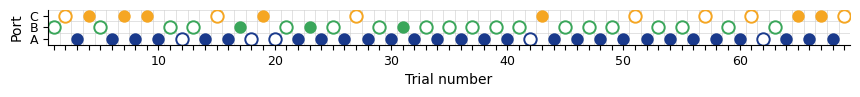

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


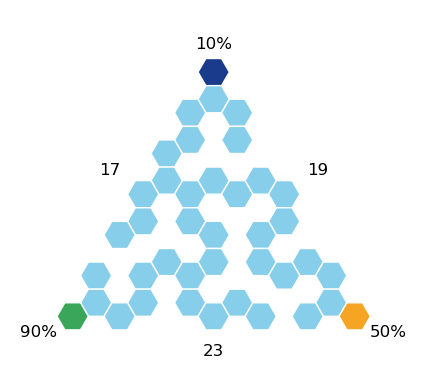

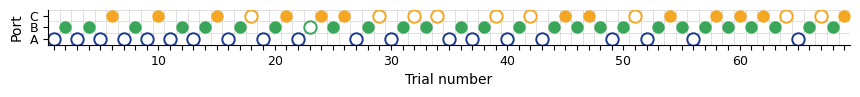

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


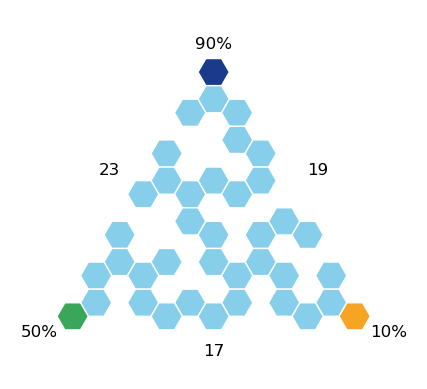

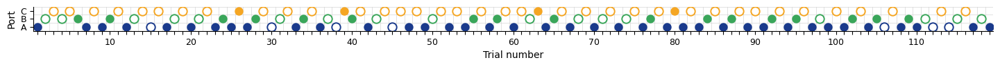

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


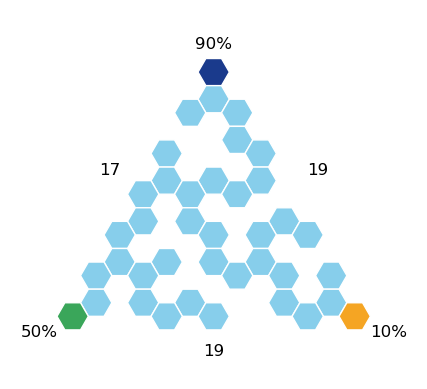

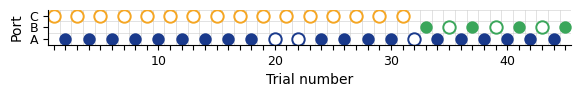

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


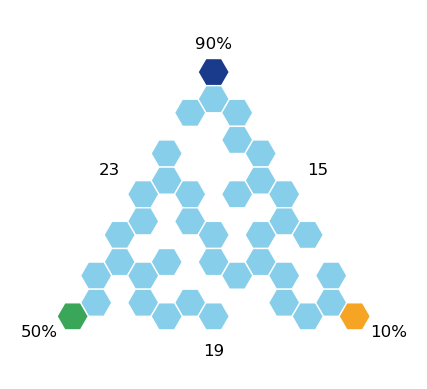

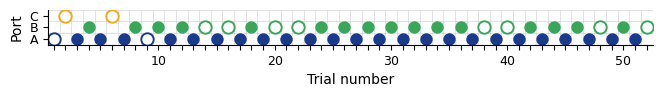

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


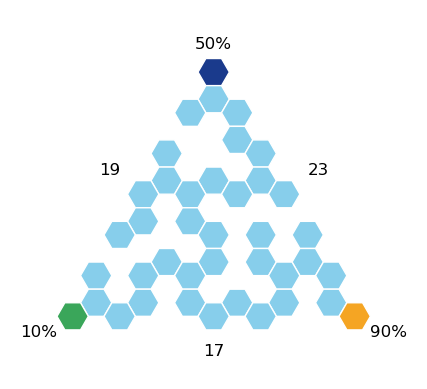

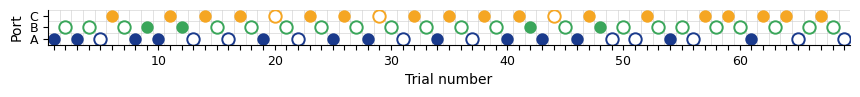

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


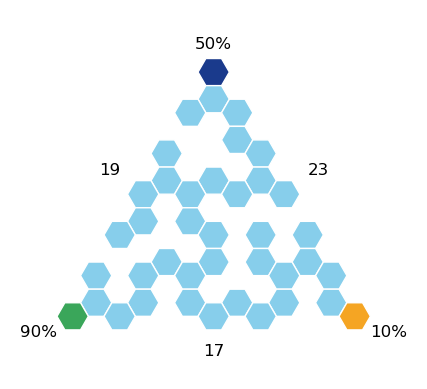

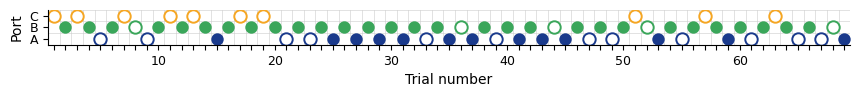

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


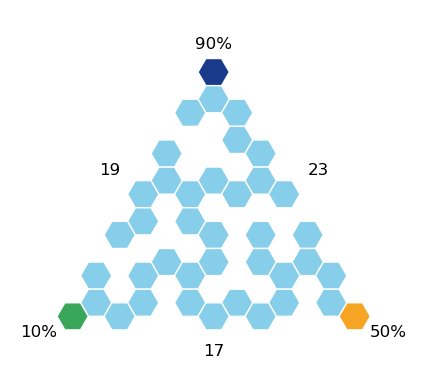

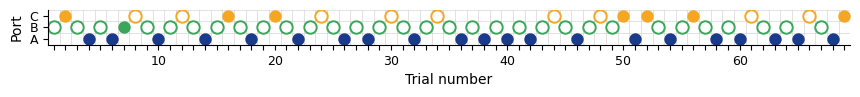

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


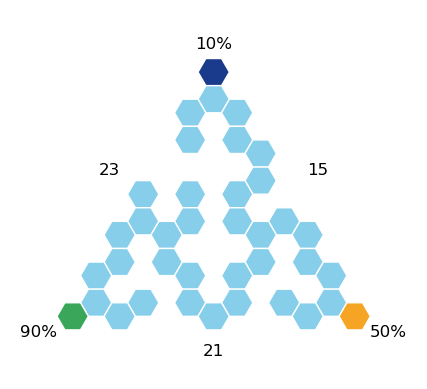

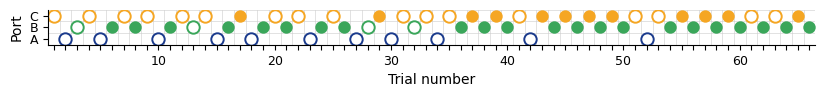

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


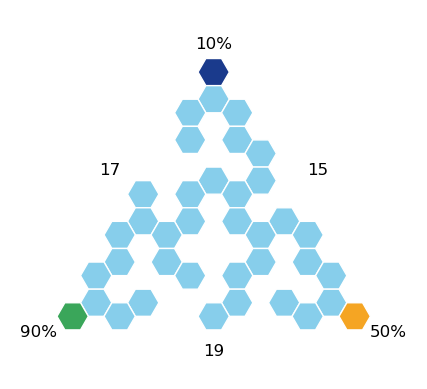

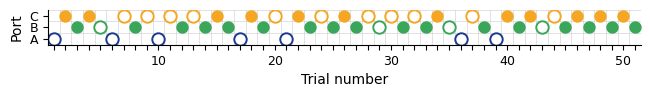

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


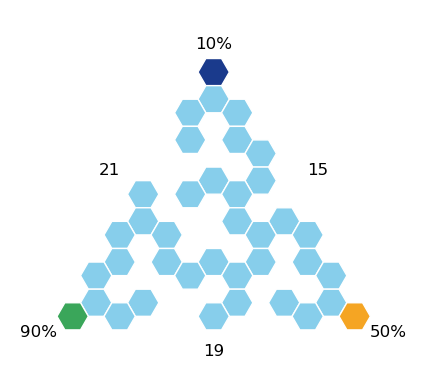

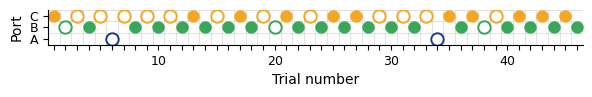

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


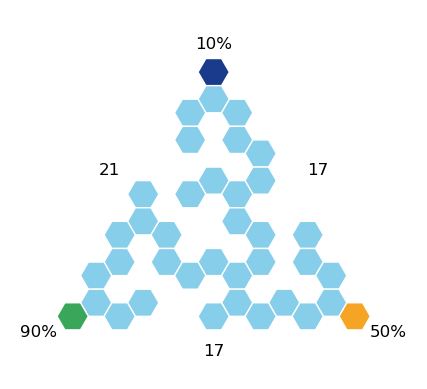

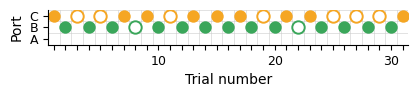

{'nwb_file_name': 'Toby20250313_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


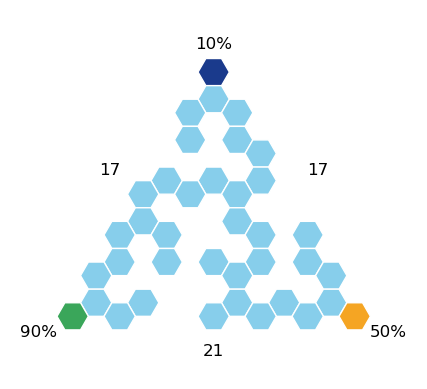

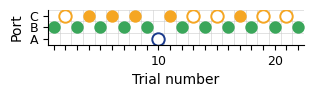

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


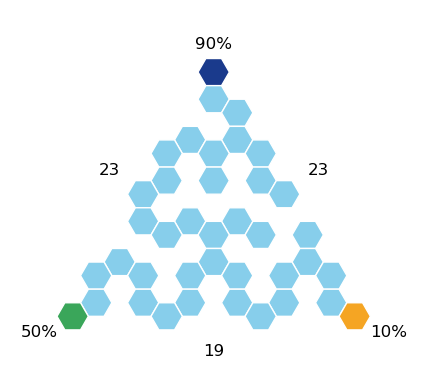

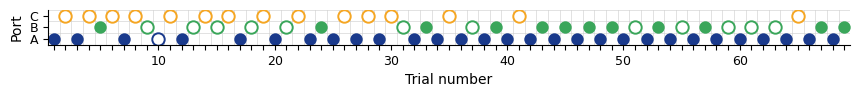

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


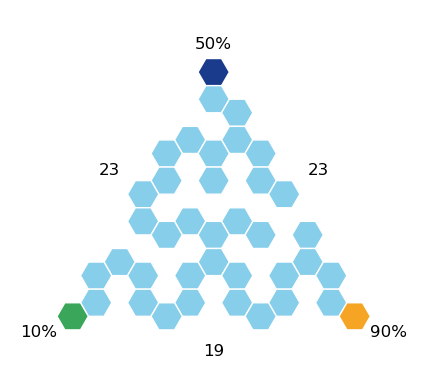

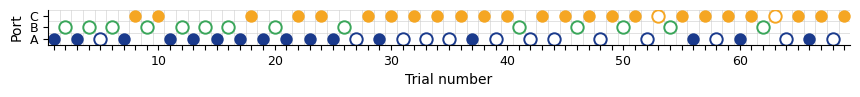

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


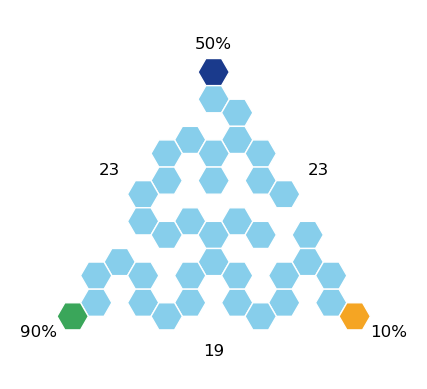

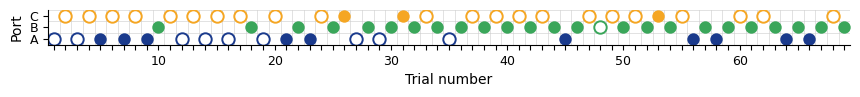

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


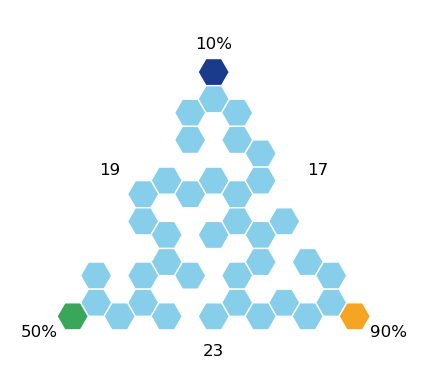

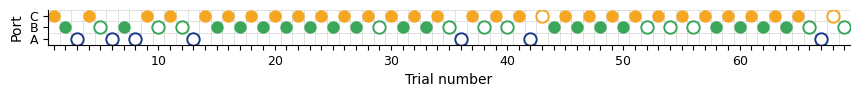

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


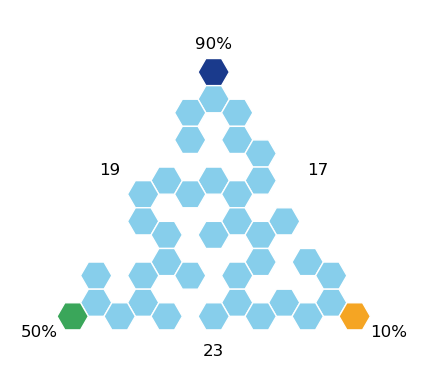

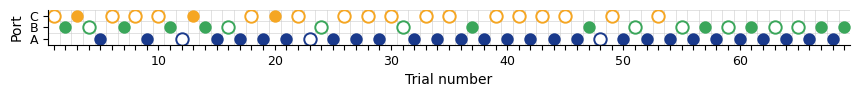

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


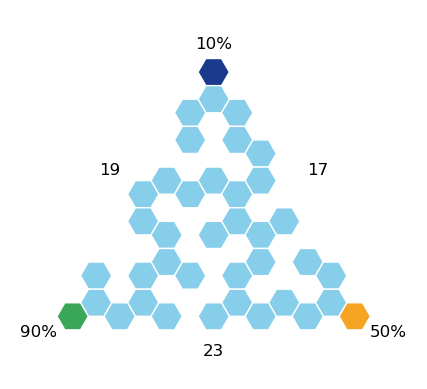

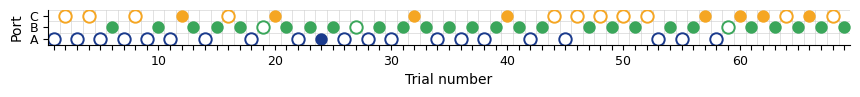

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


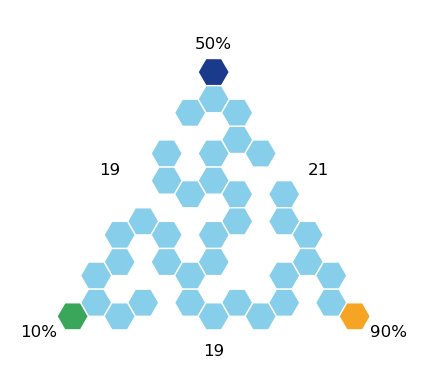

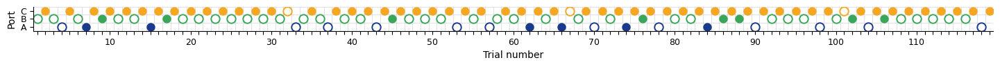

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


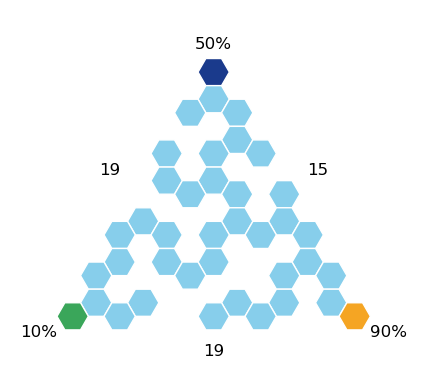

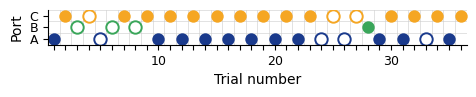

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


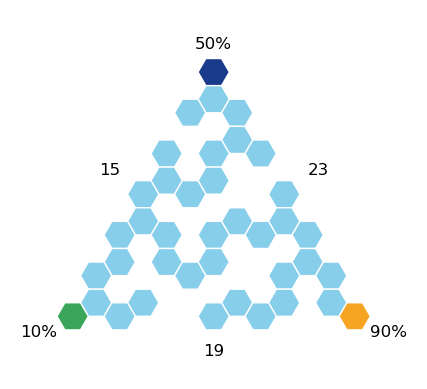

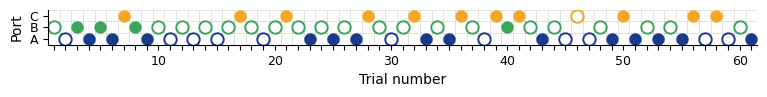

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


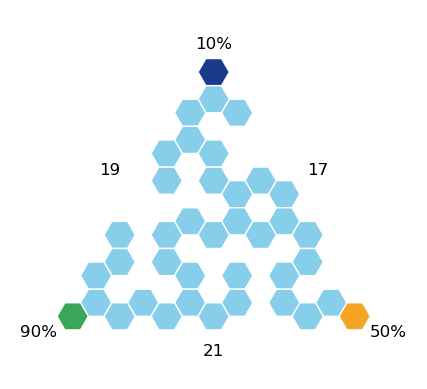

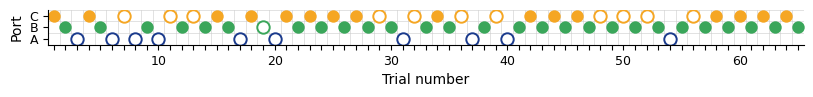

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


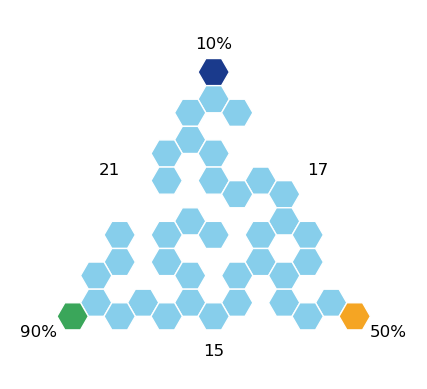

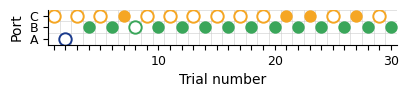

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


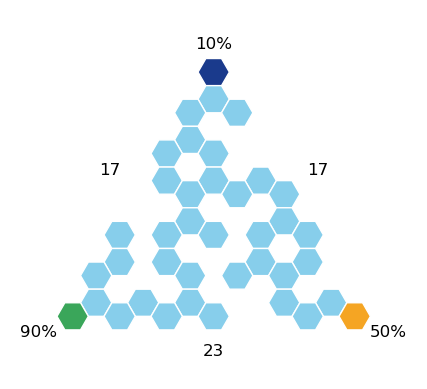

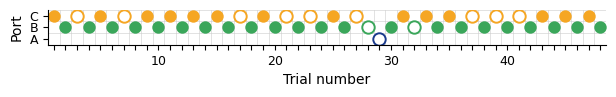

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


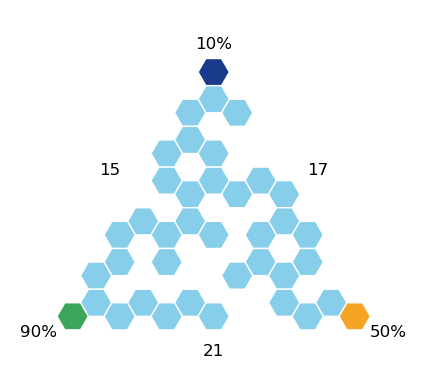

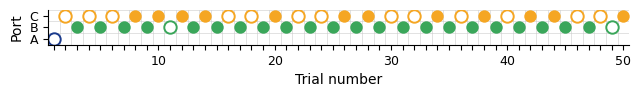

{'nwb_file_name': 'Toby20250314_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


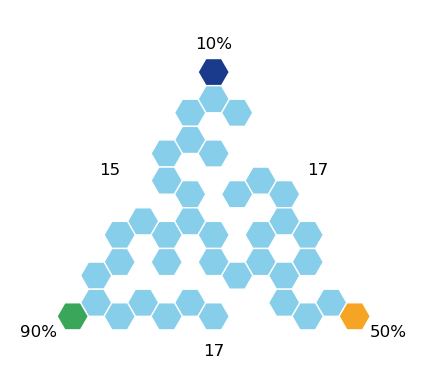

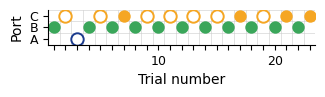

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


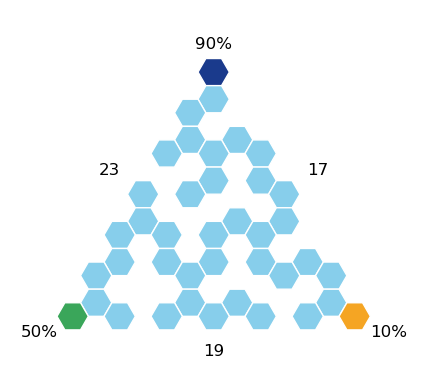

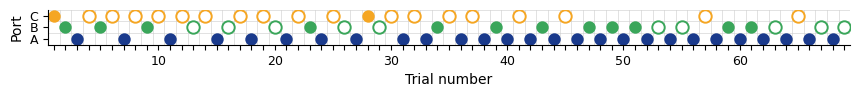

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


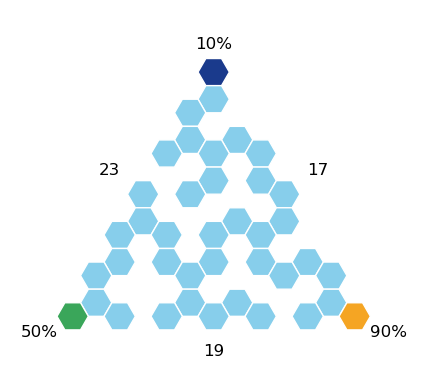

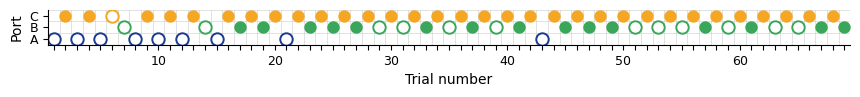

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


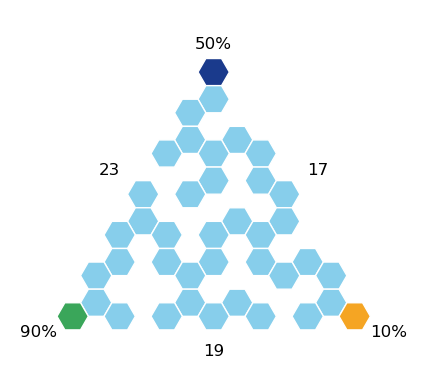

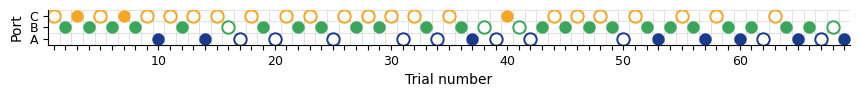

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


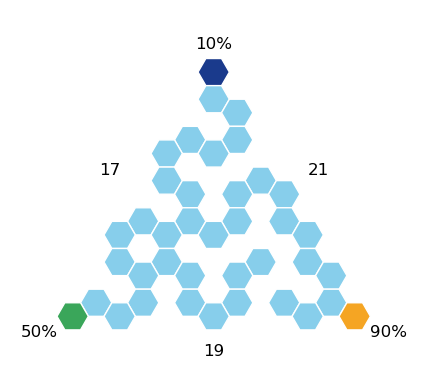

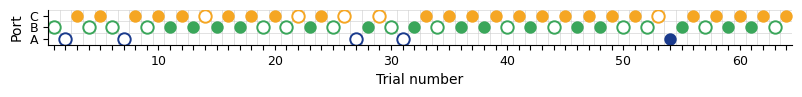

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


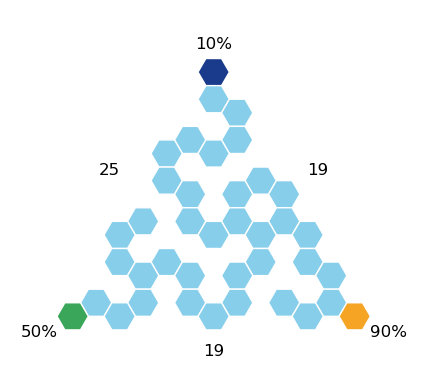

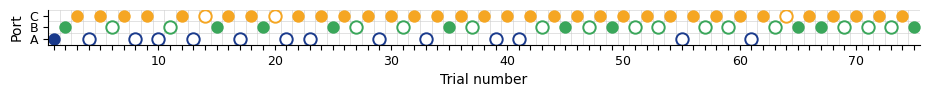

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


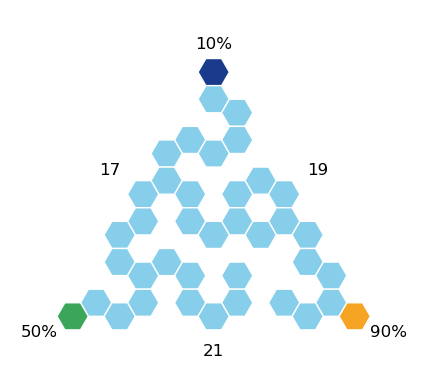

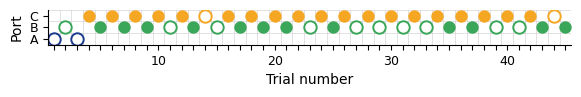

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


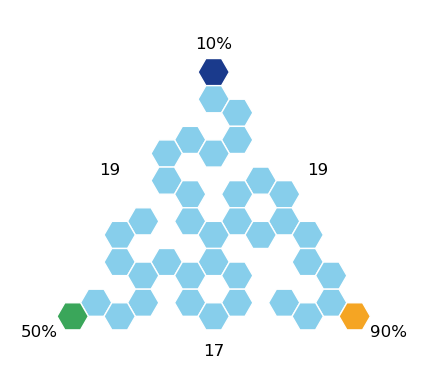

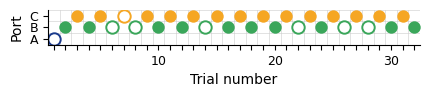

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


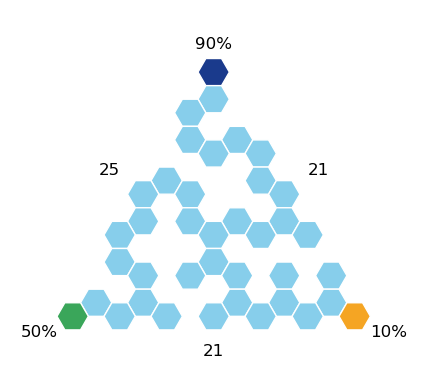

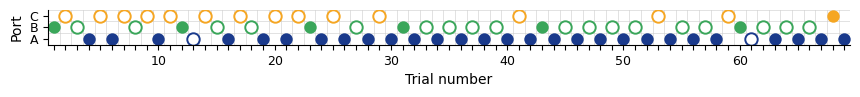

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


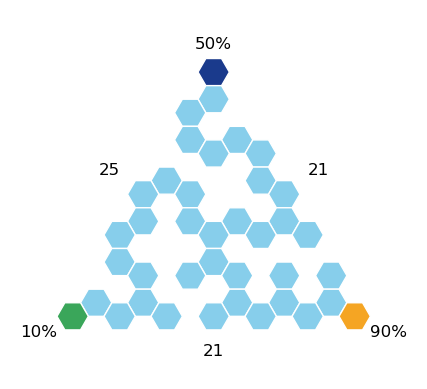

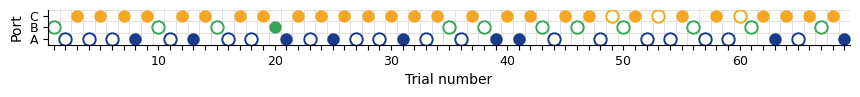

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


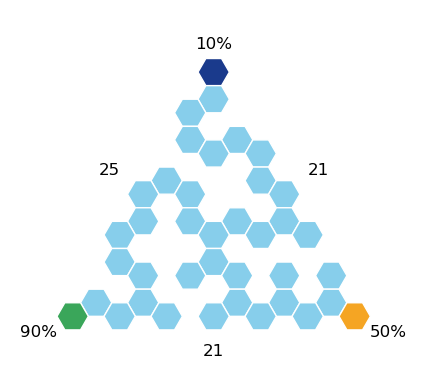

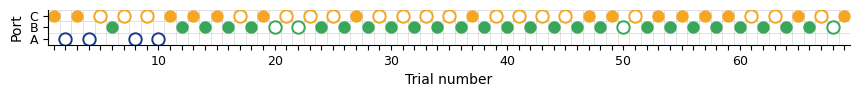

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


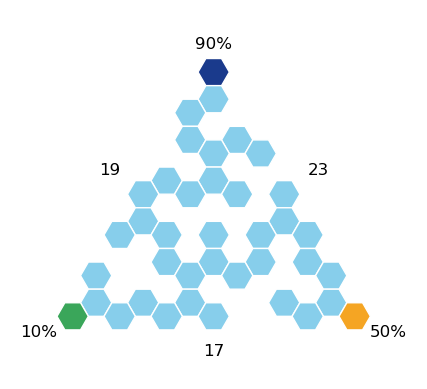

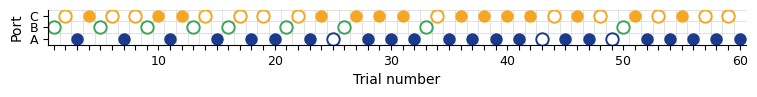

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


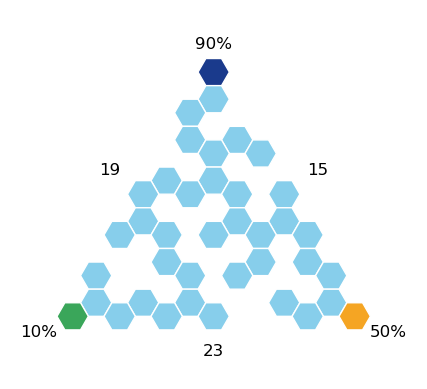

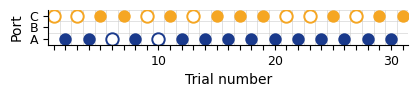

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


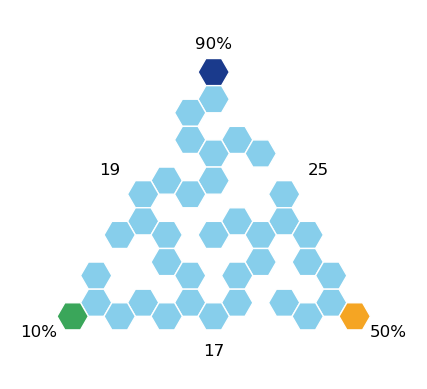

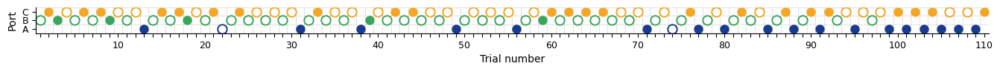

{'nwb_file_name': 'Toby20250315_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


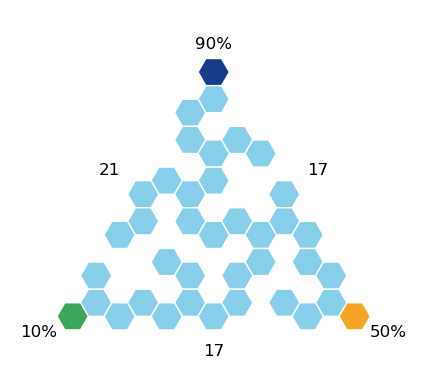

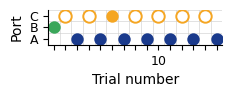

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


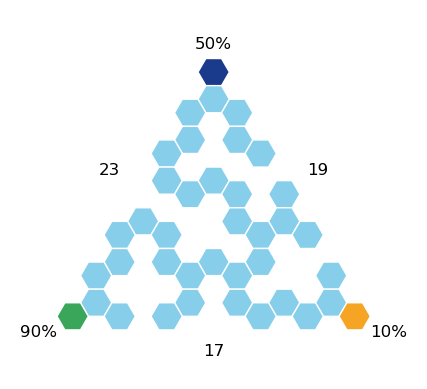

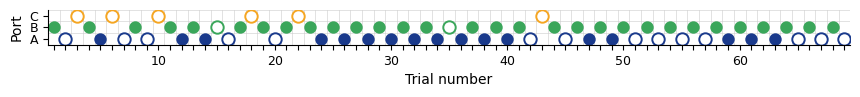

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


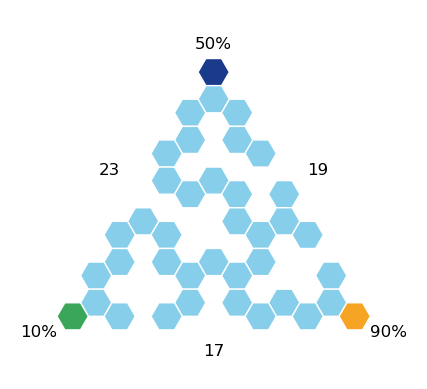

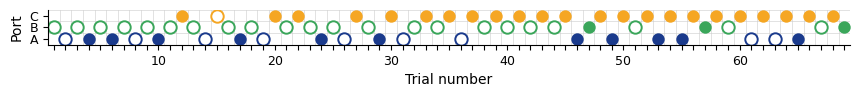

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


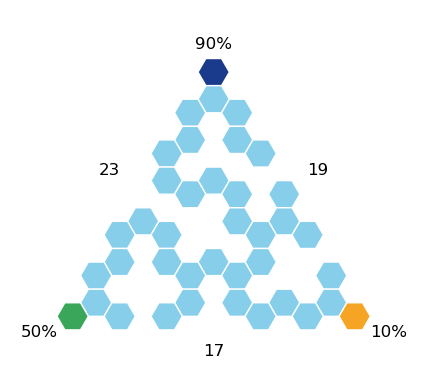

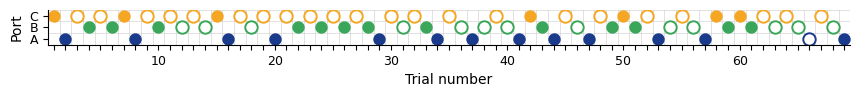

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


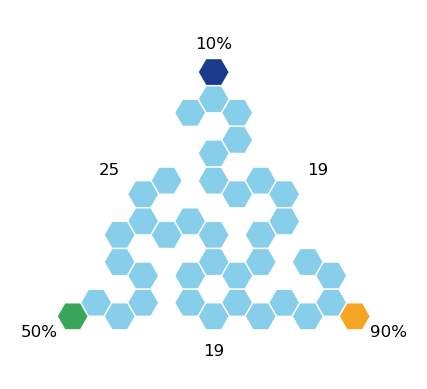

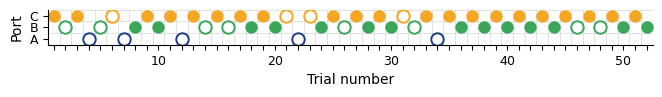

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


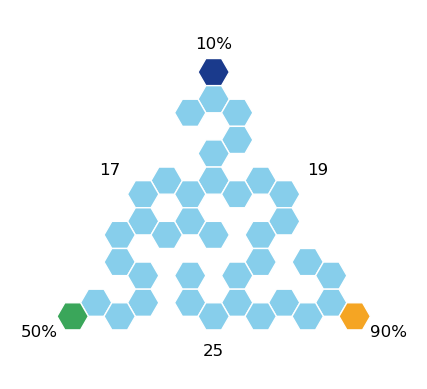

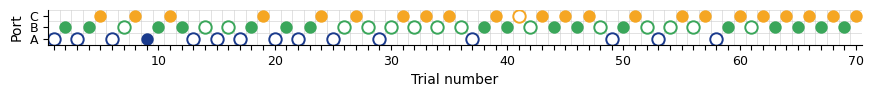

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


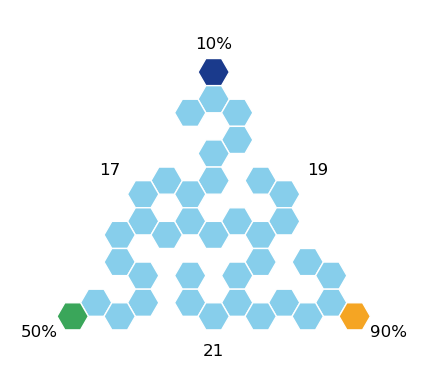

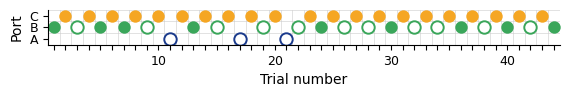

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


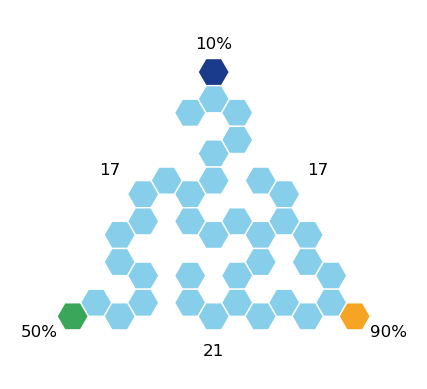

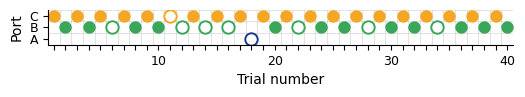

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 3, 'block': 5}: HexmazeNoStim


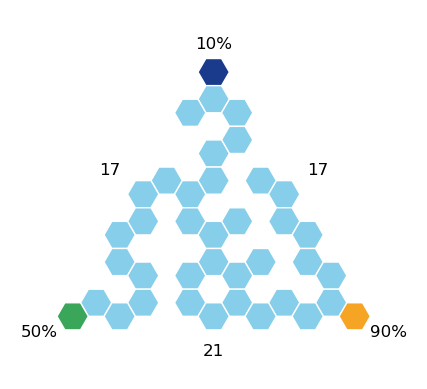

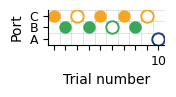

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


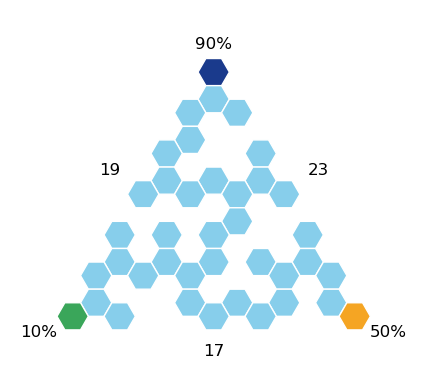

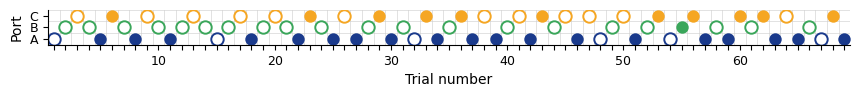

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


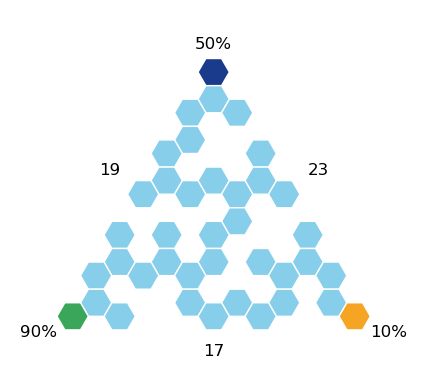

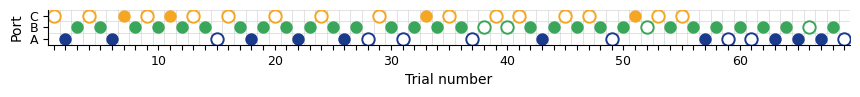

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


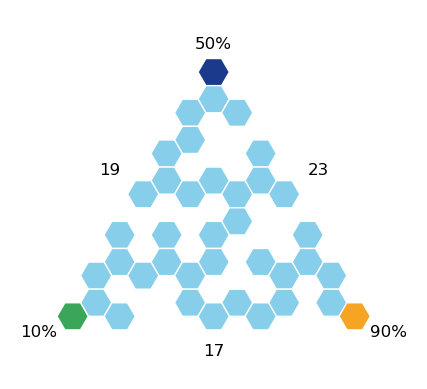

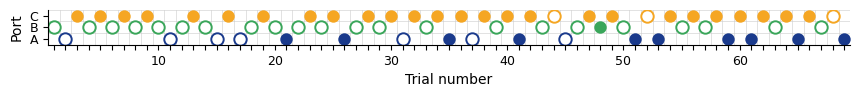

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


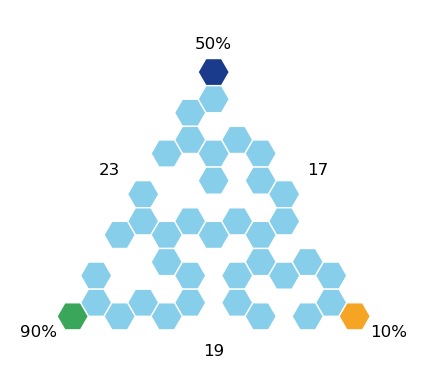

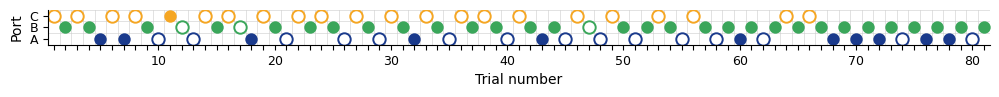

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


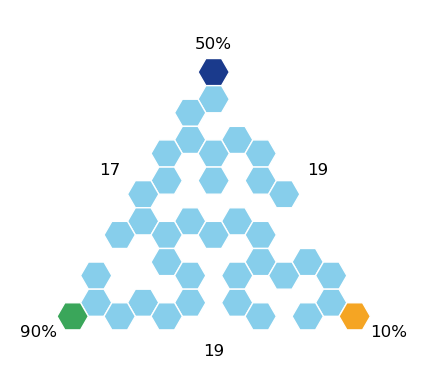

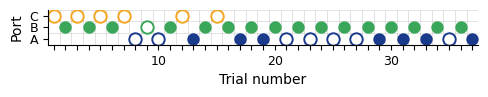

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


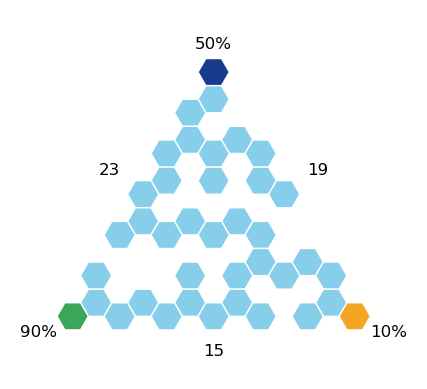

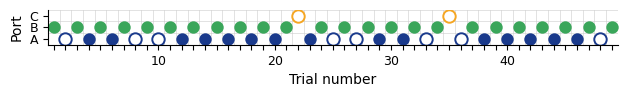

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


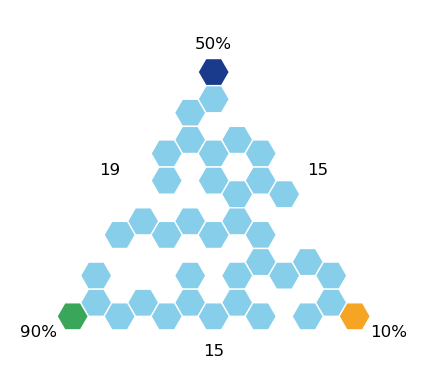

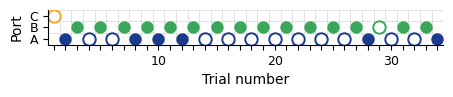

{'nwb_file_name': 'Toby20250316_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


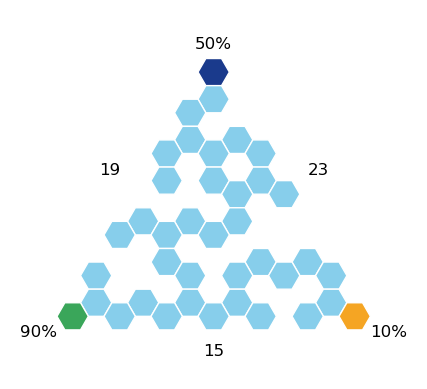

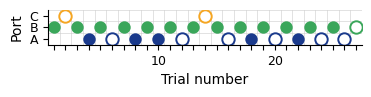

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


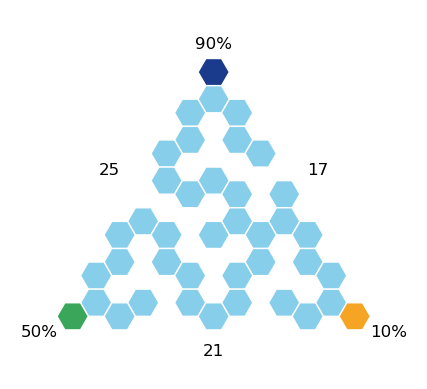

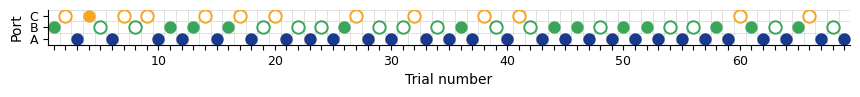

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


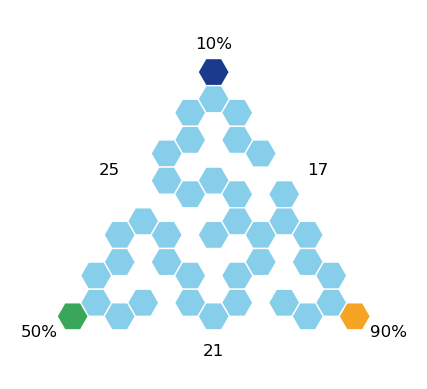

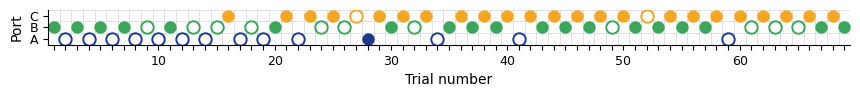

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


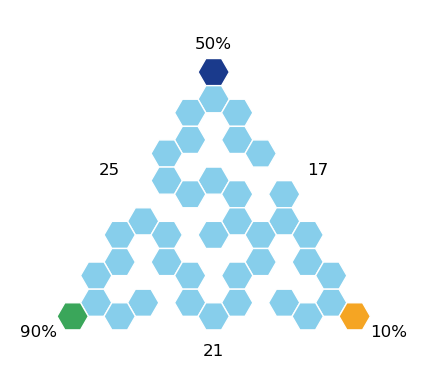

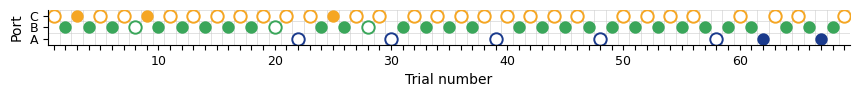

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


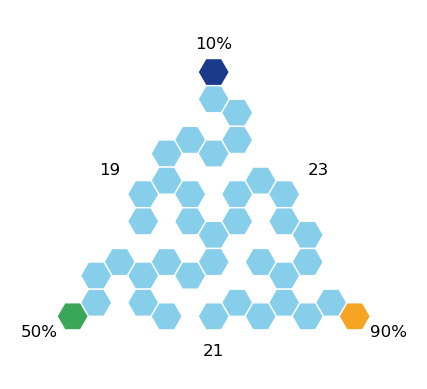

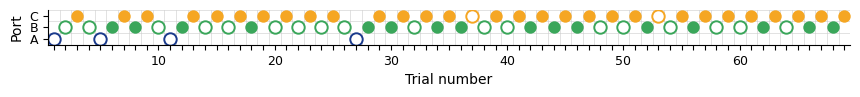

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


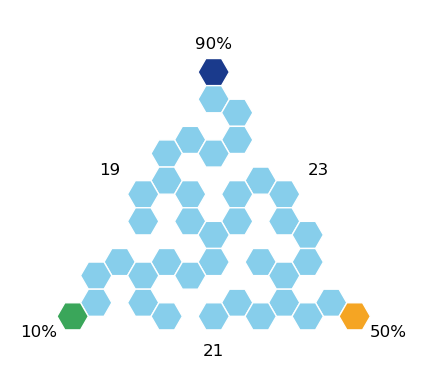

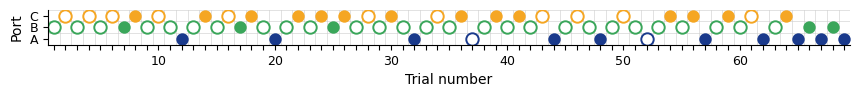

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


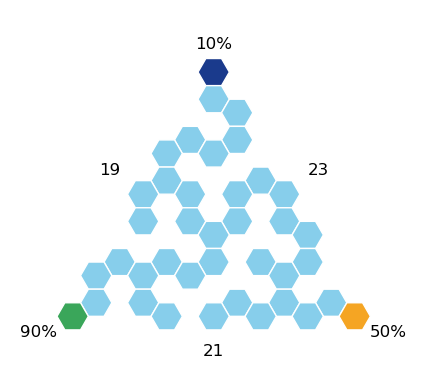

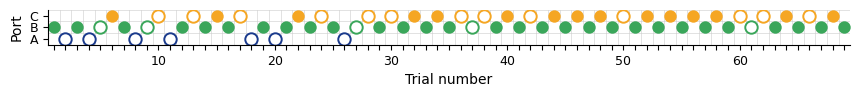

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


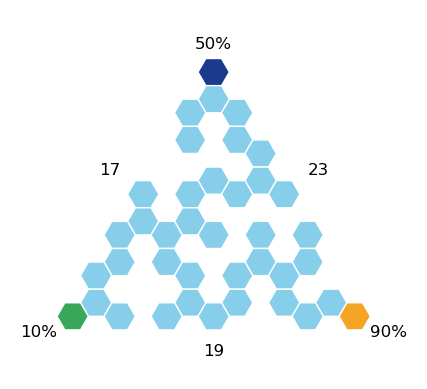

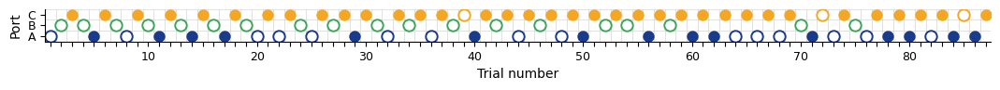

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


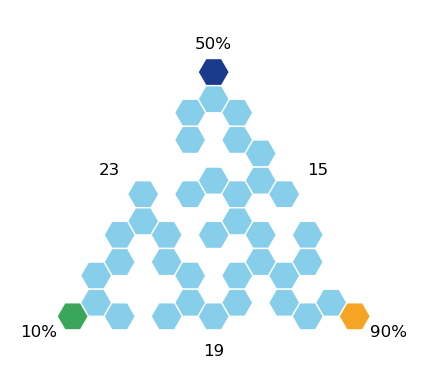

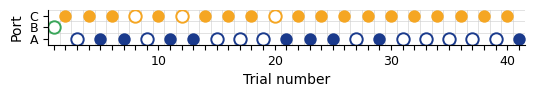

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


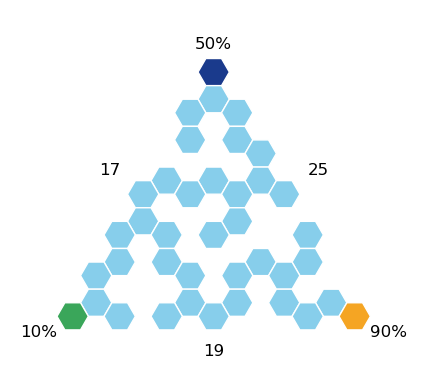

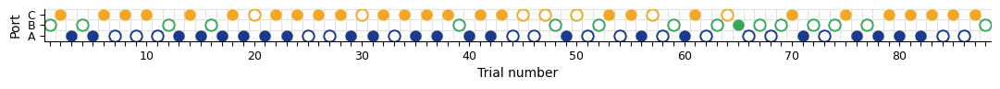

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


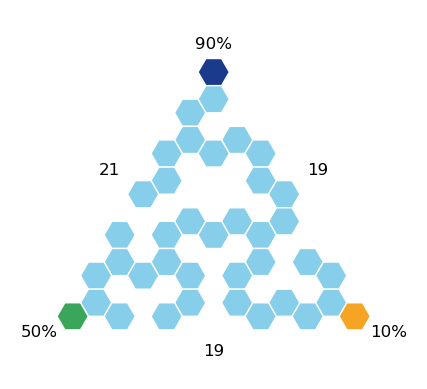

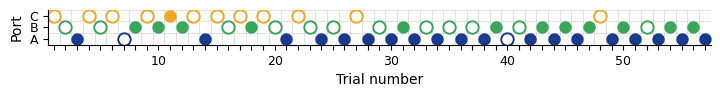

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


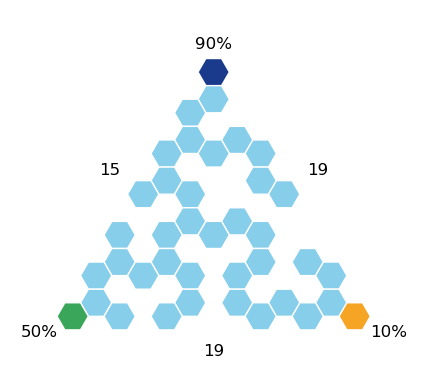

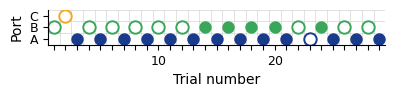

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


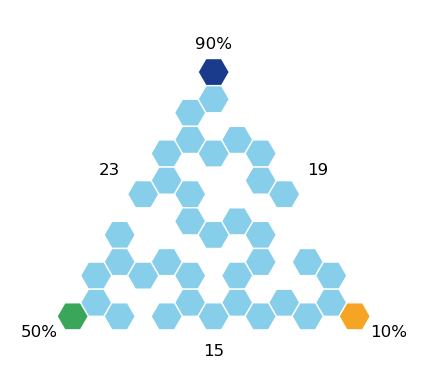

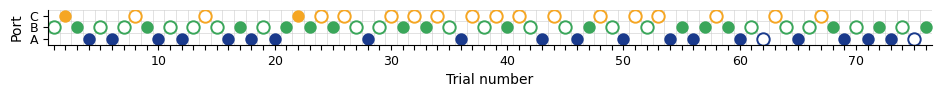

{'nwb_file_name': 'Toby20250317_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


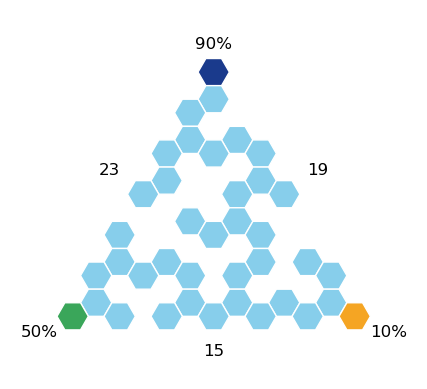

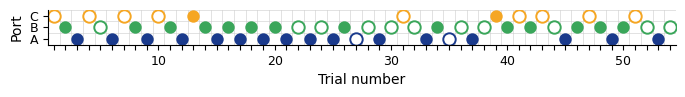

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


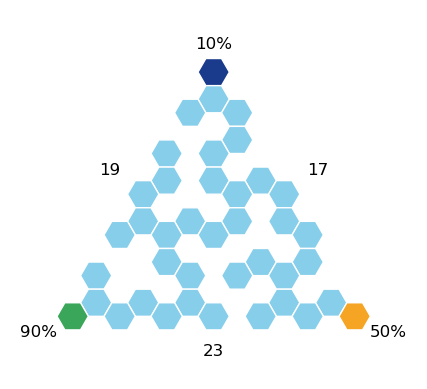

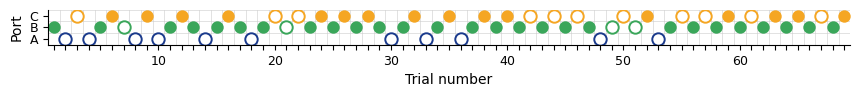

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


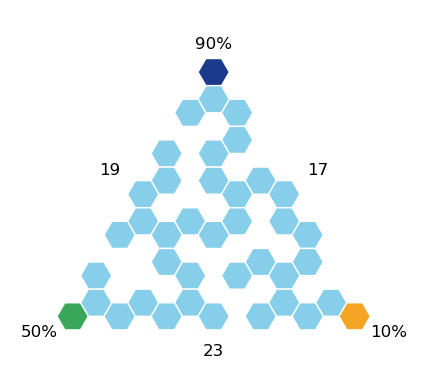

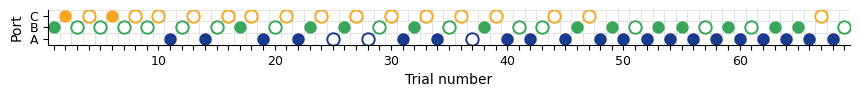

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


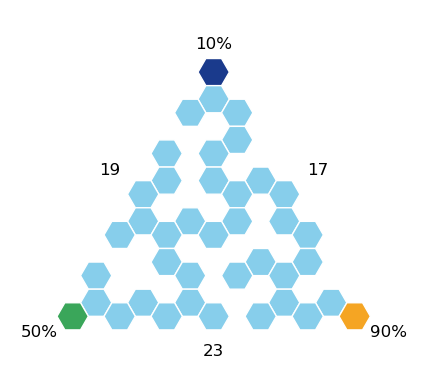

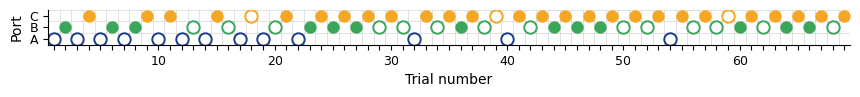

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


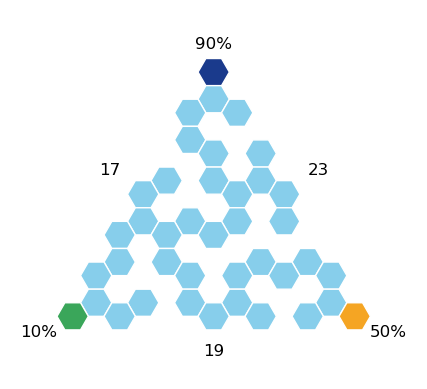

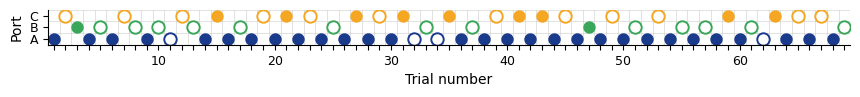

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


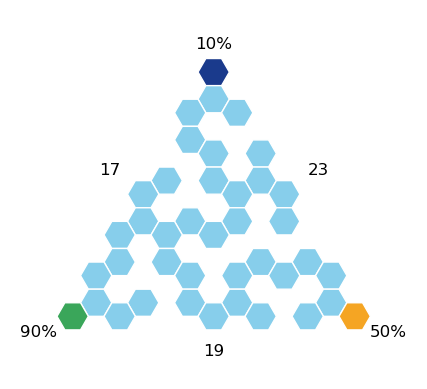

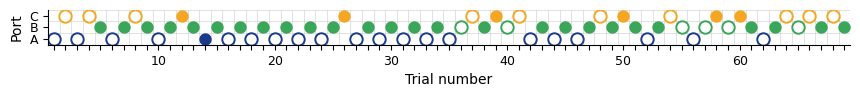

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


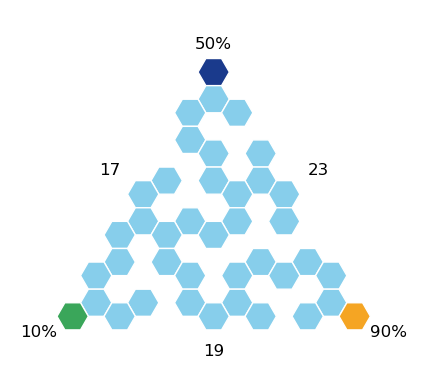

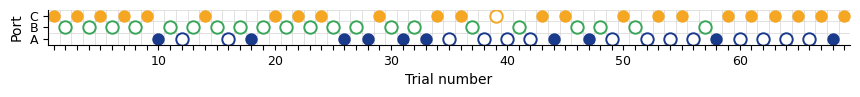

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


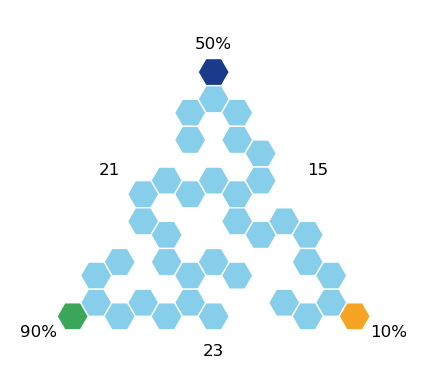

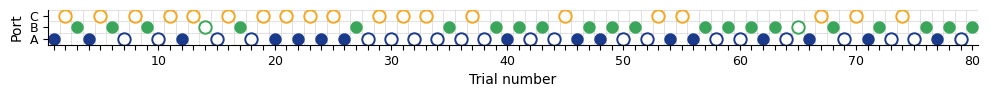

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


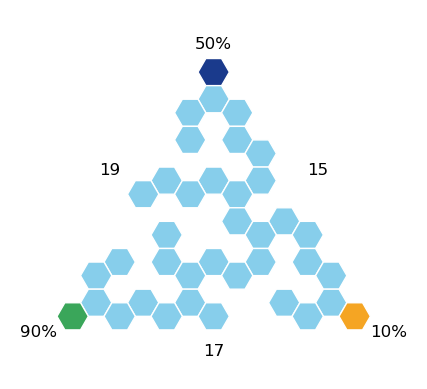

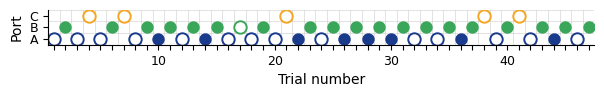

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


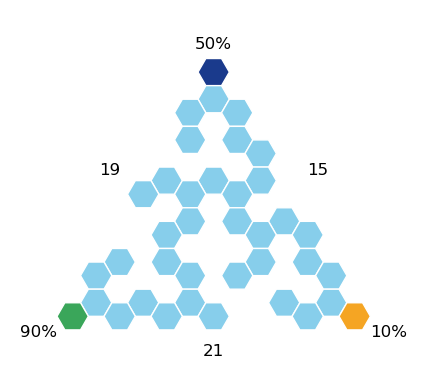

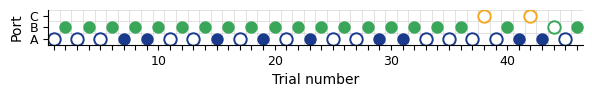

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 5, 'block': 4}: HexmazeNoStim


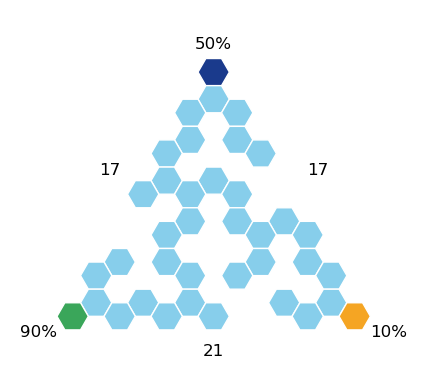

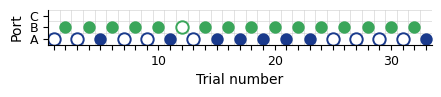

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 5, 'block': 5}: HexmazeNoStim


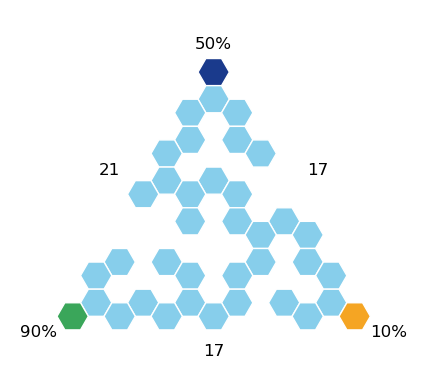

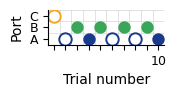

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


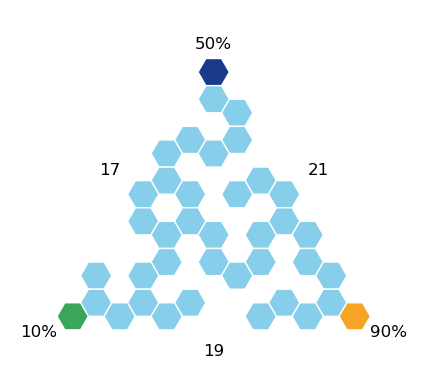

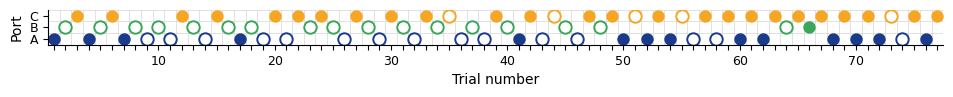

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


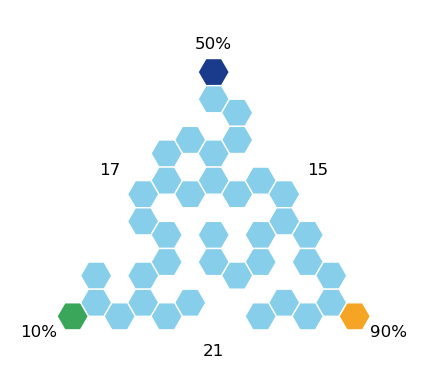

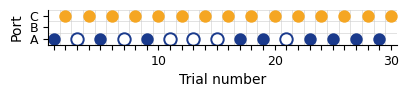

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


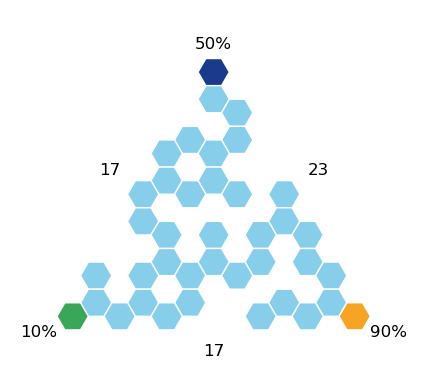

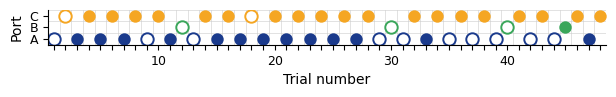

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


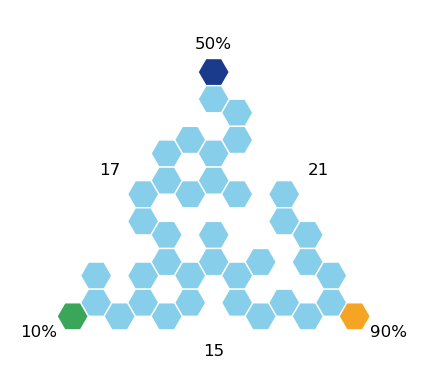

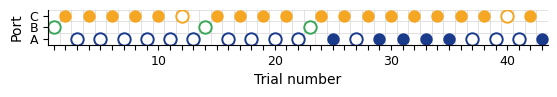

{'nwb_file_name': 'Toby20250318_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


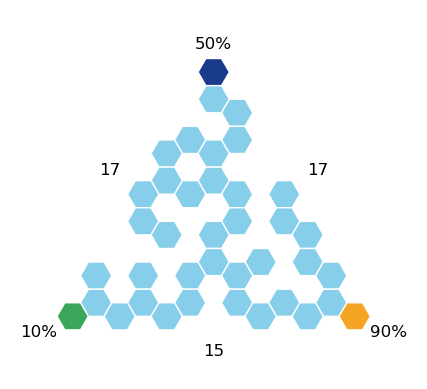

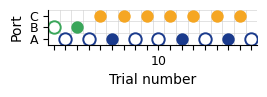

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


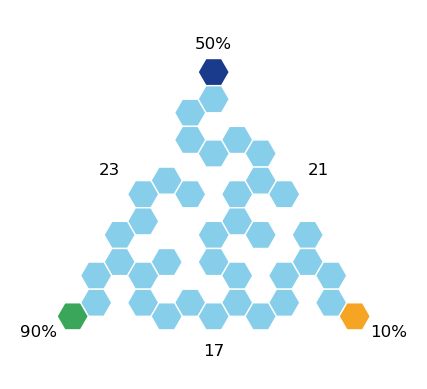

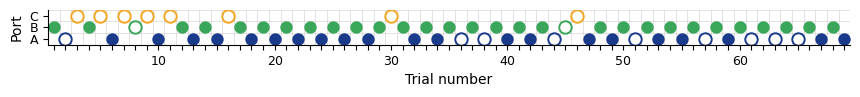

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


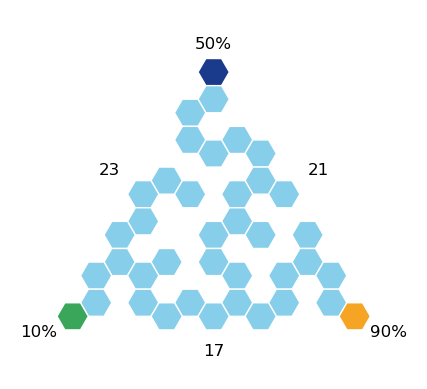

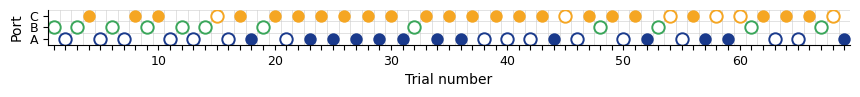

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


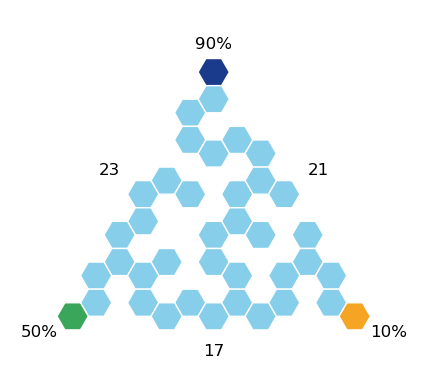

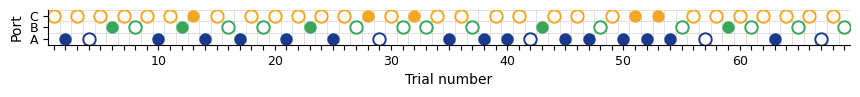

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


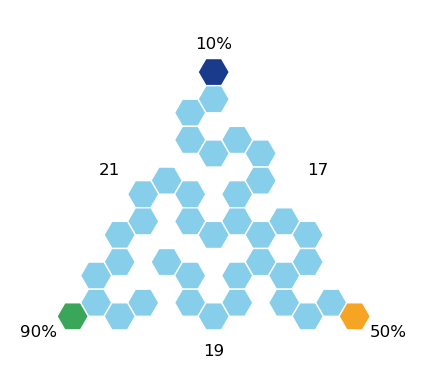

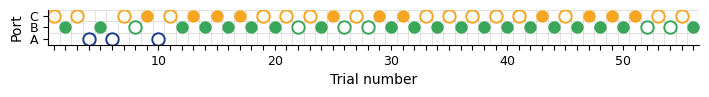

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


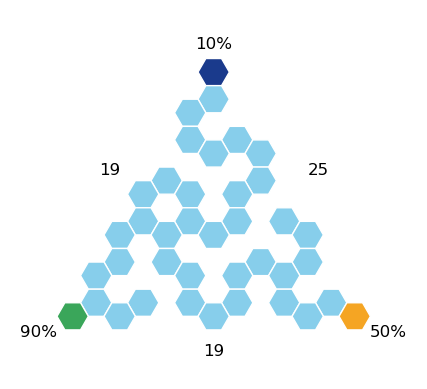

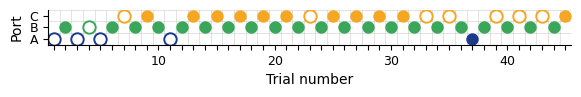

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


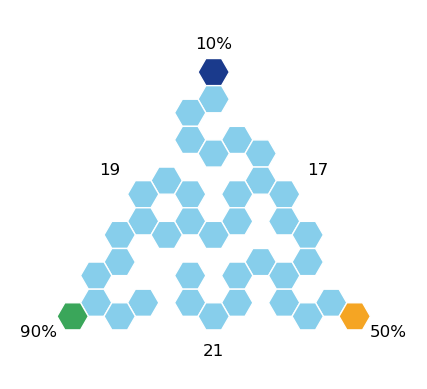

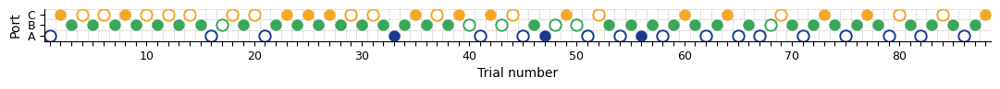

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


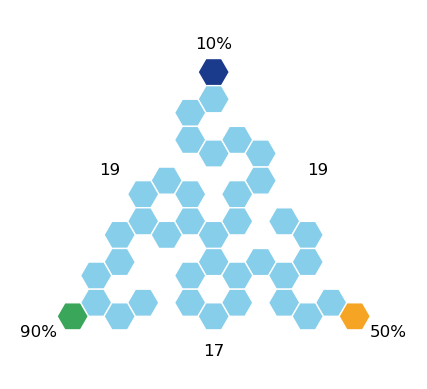

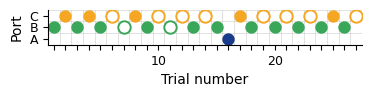

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


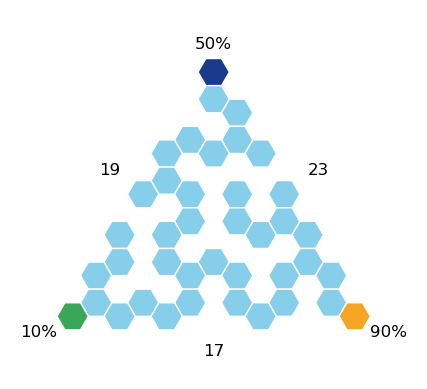

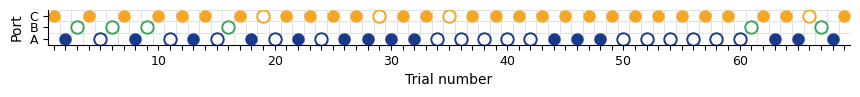

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


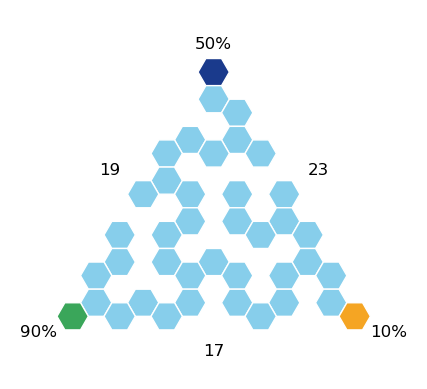

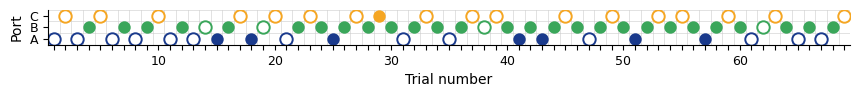

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


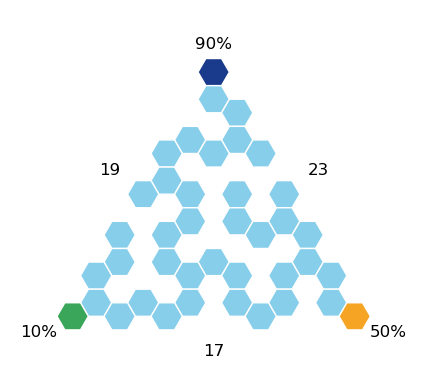

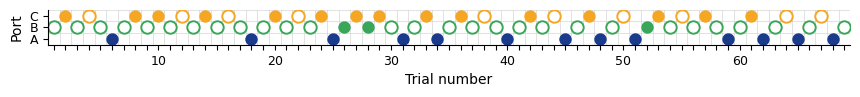

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


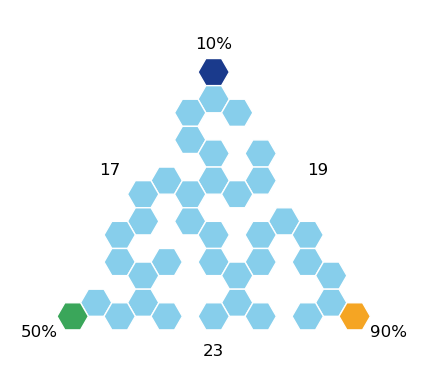

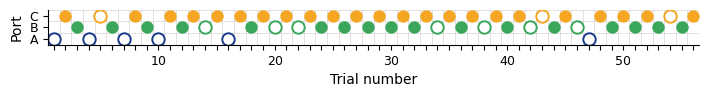

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


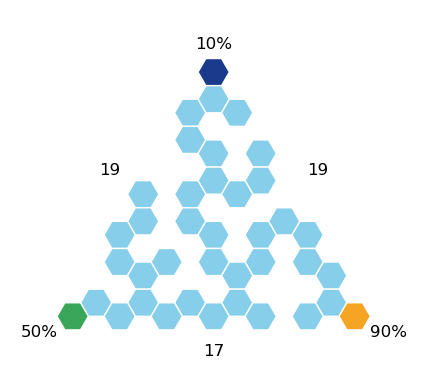

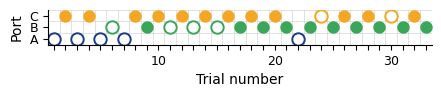

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


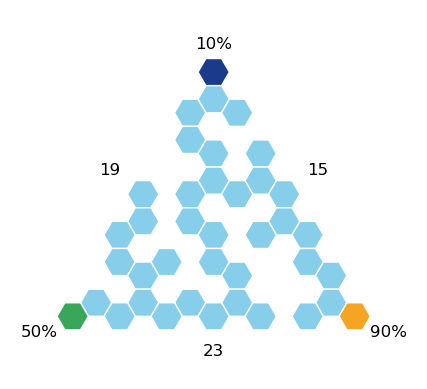

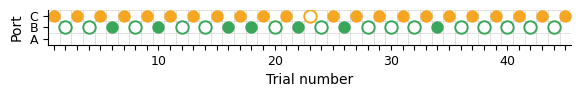

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


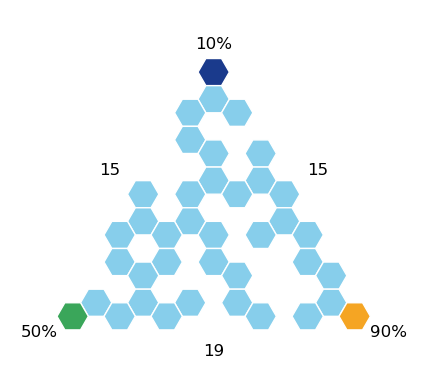

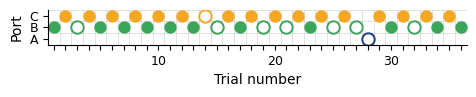

{'nwb_file_name': 'Toby20250319_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


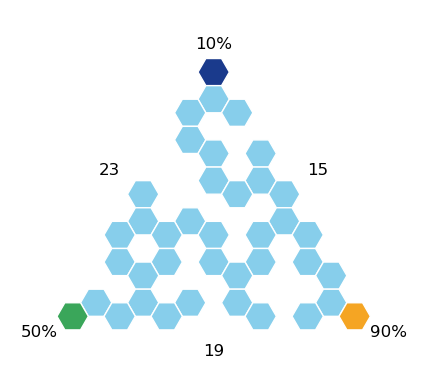

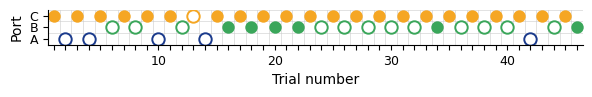

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


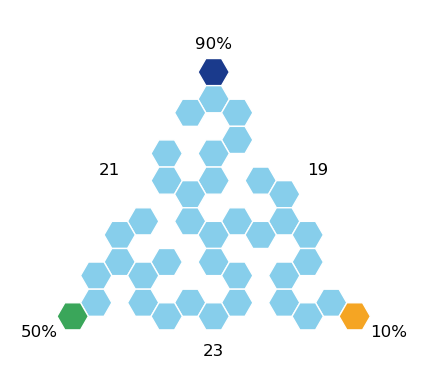

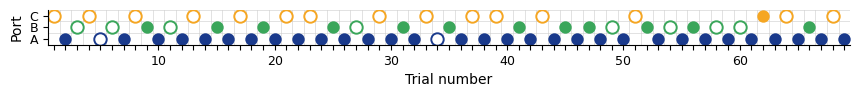

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


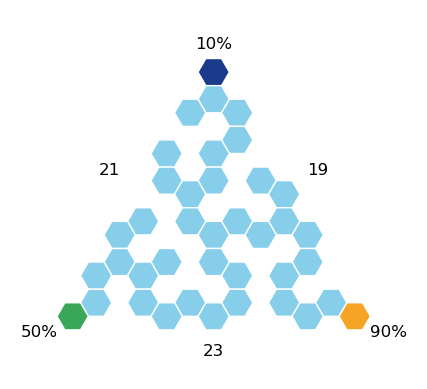

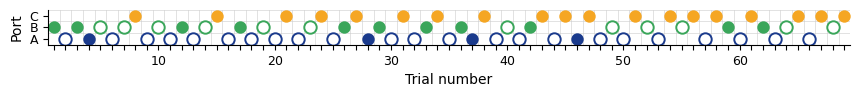

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


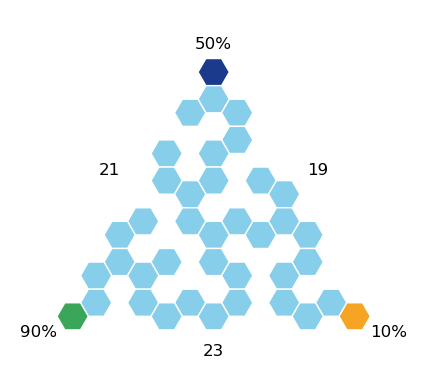

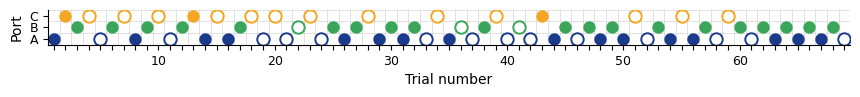

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


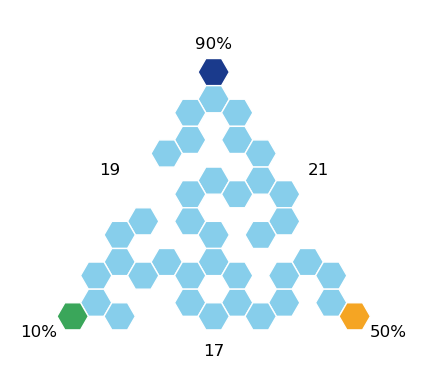

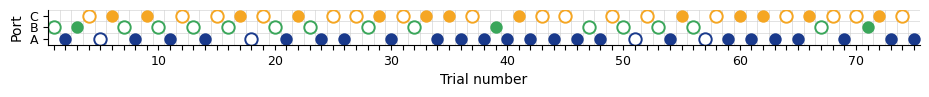

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


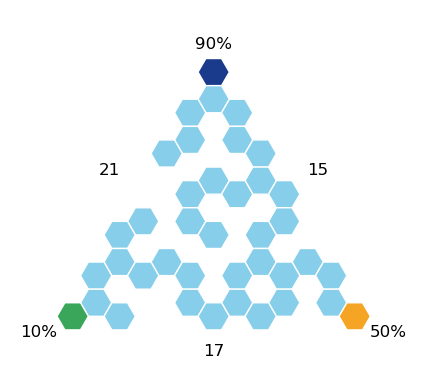

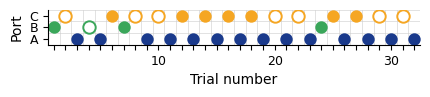

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


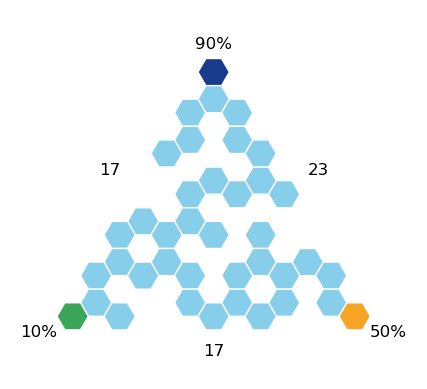

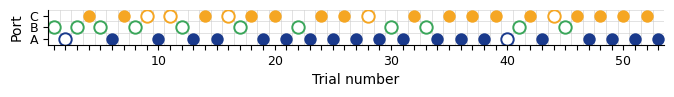

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


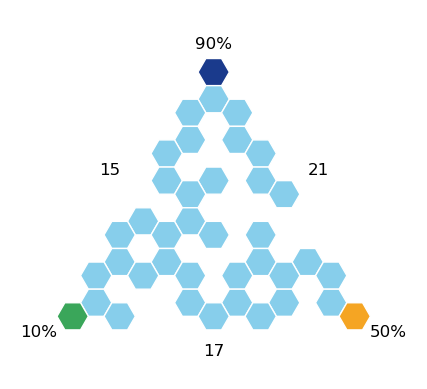

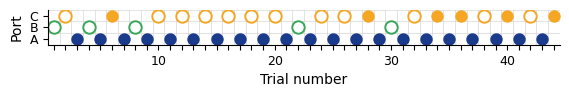

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 3, 'block': 5}: HexmazeNoStim


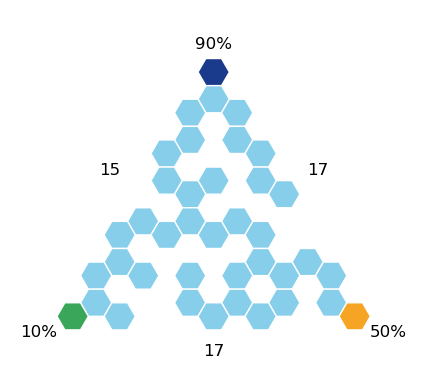

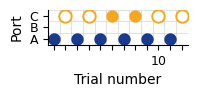

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


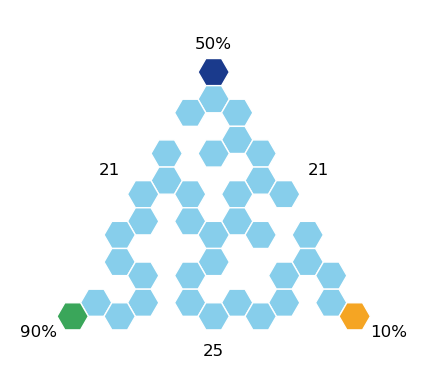

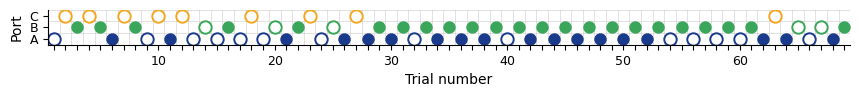

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


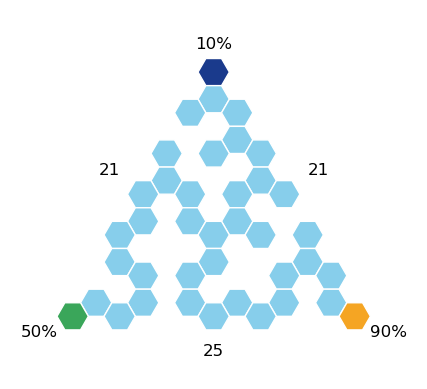

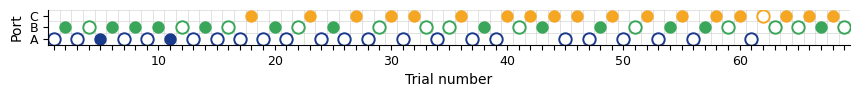

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


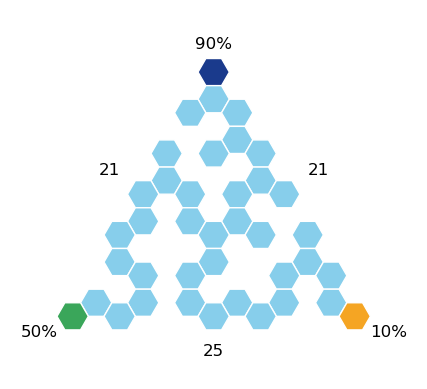

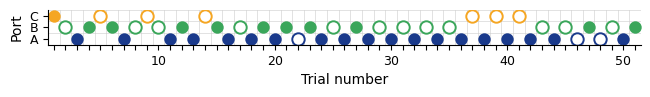

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


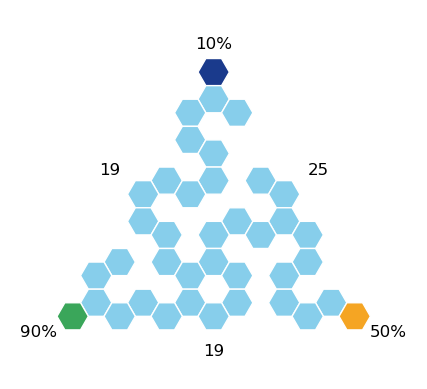

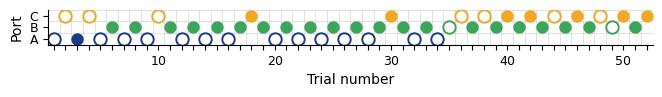

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


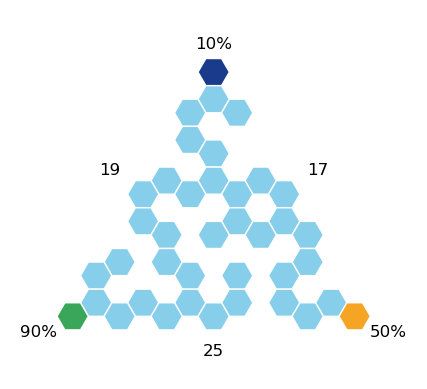

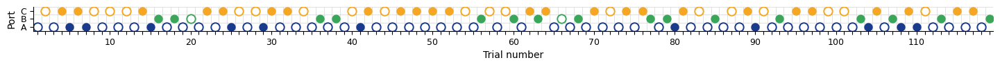

{'nwb_file_name': 'Toby20250321_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


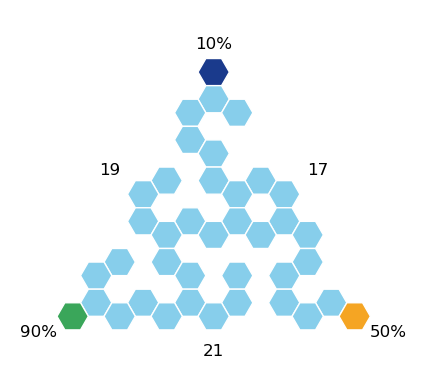

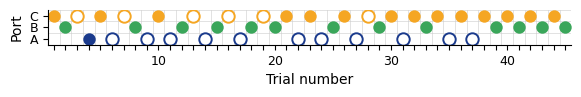

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


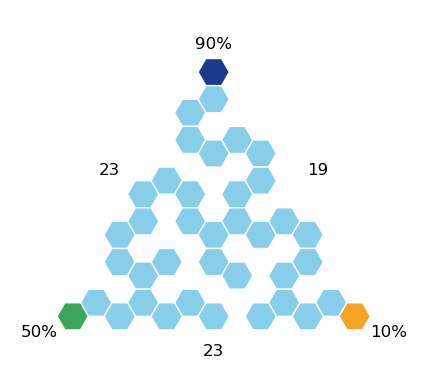

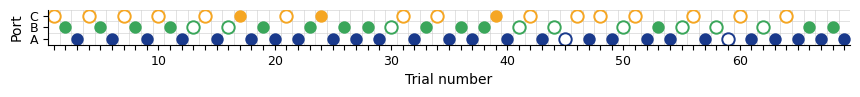

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


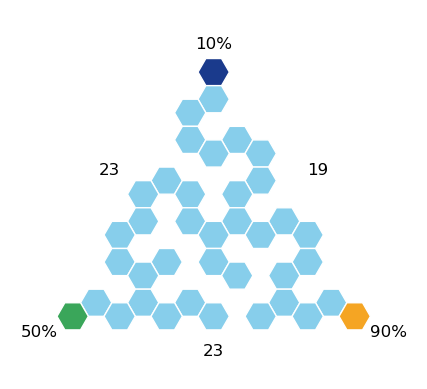

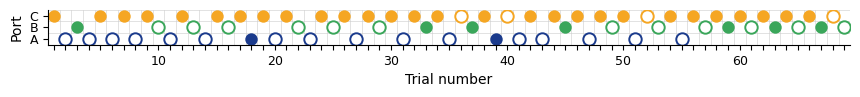

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


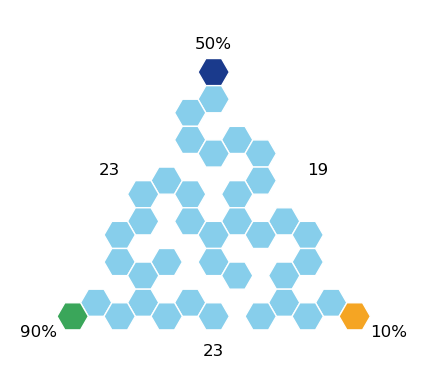

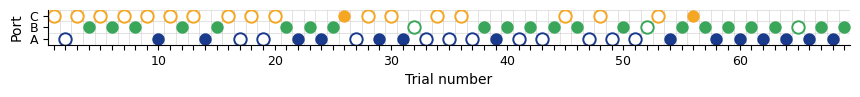

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


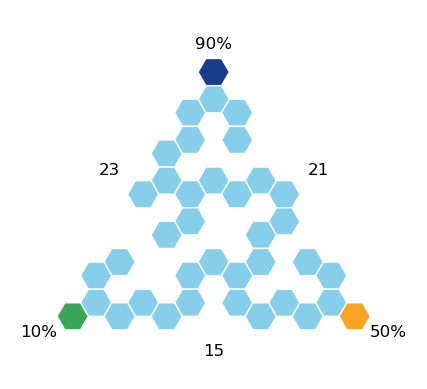

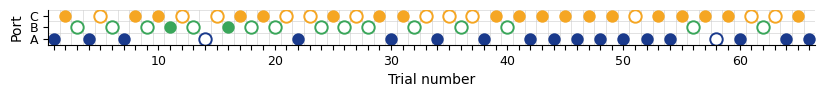

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


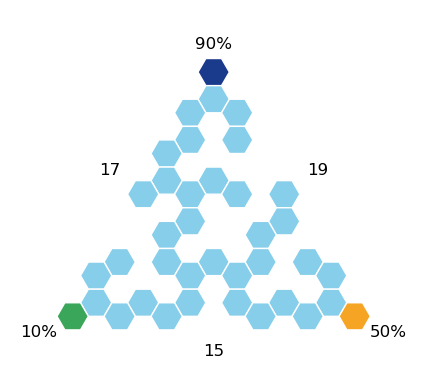

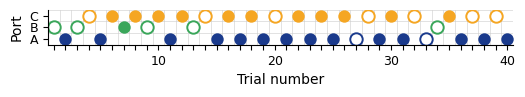

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


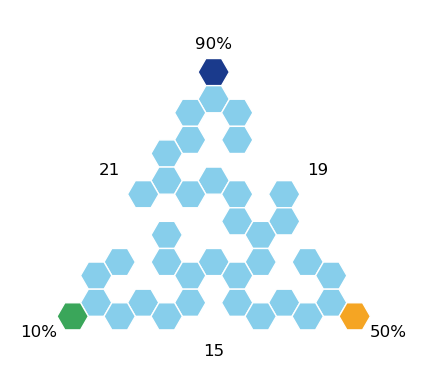

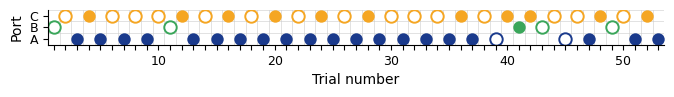

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


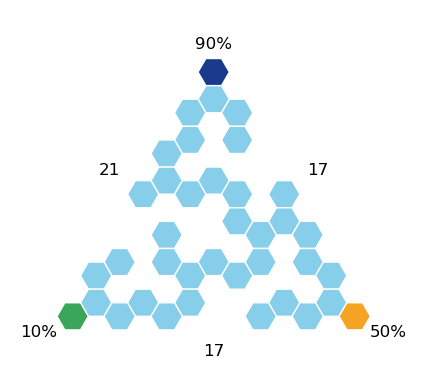

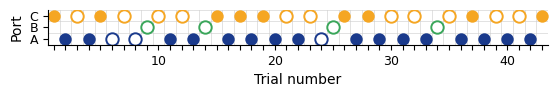

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 3, 'block': 5}: HexmazeNoStim


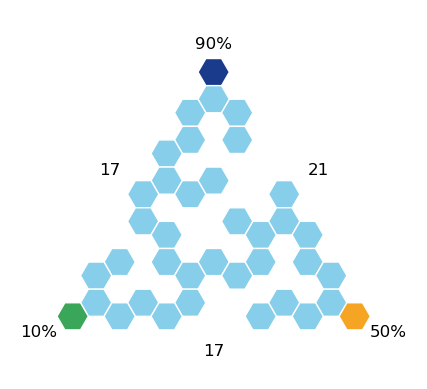

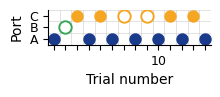

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


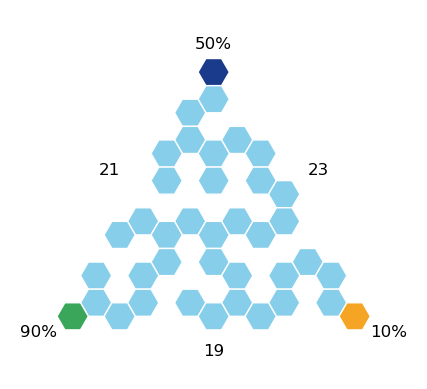

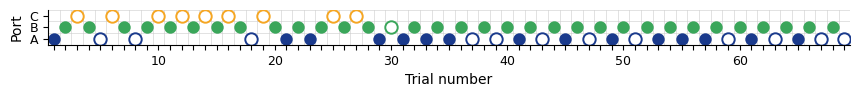

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


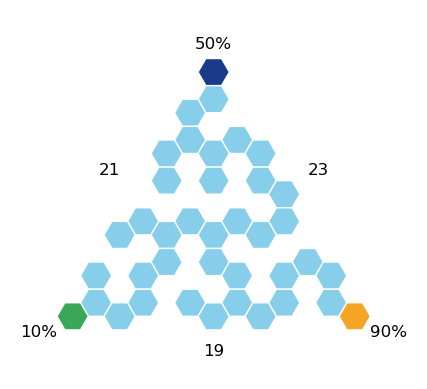

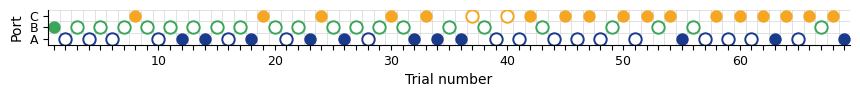

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


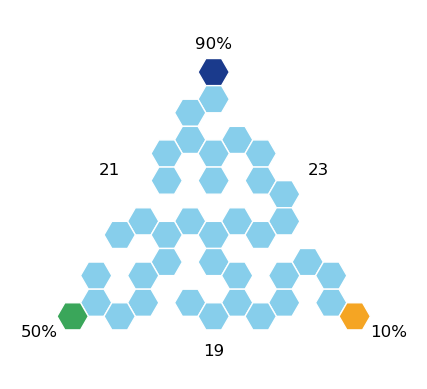

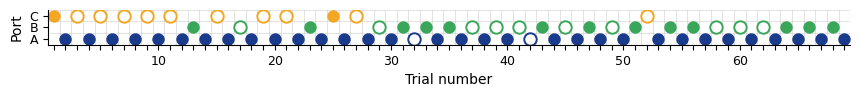

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


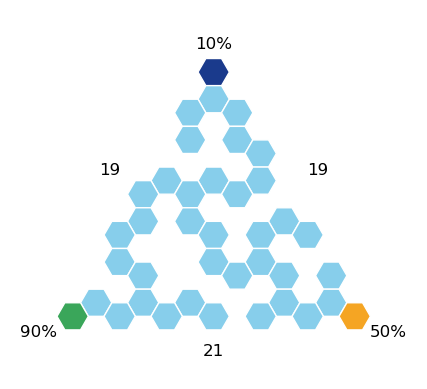

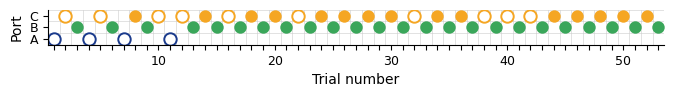

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


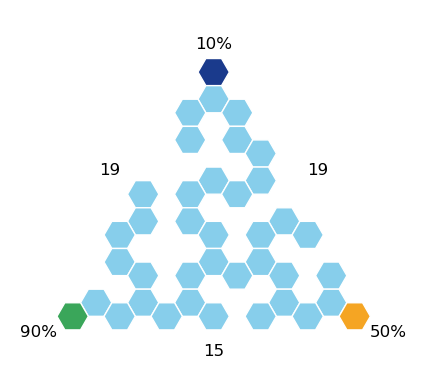

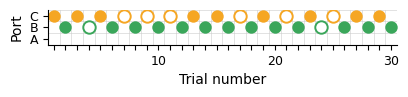

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


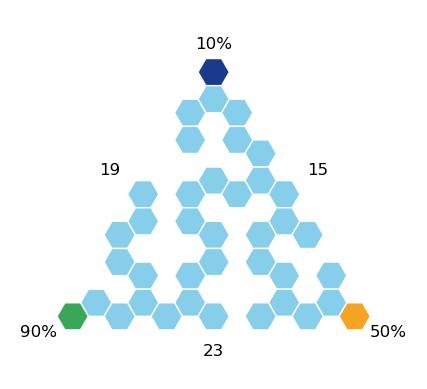

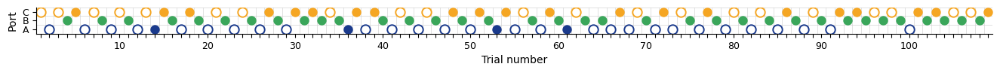

{'nwb_file_name': 'Toby20250322_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


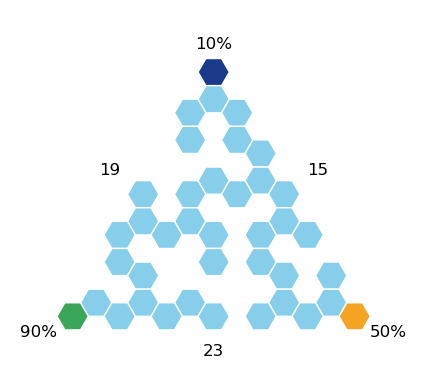

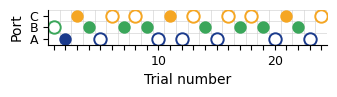

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


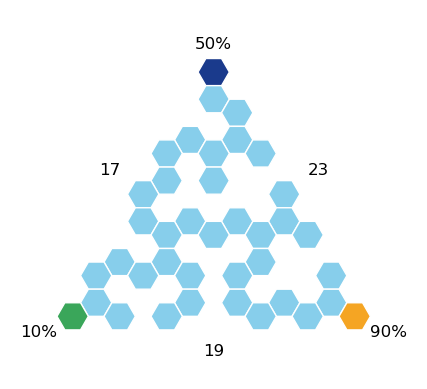

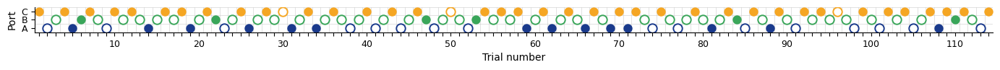

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


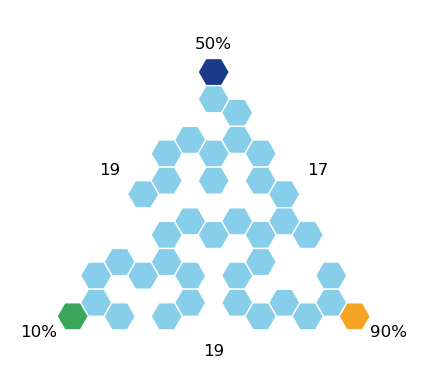

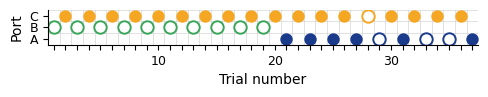

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


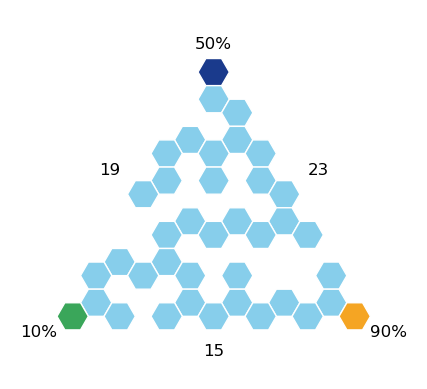

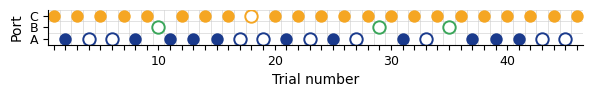

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 1, 'block': 4}: HexmazeNoStim


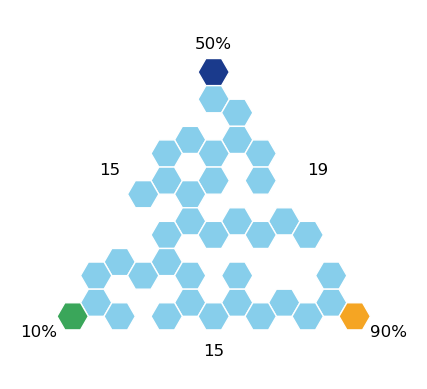

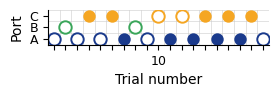

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


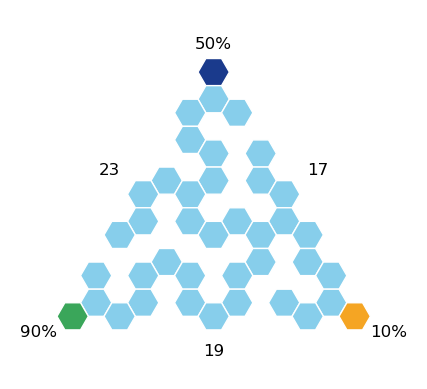

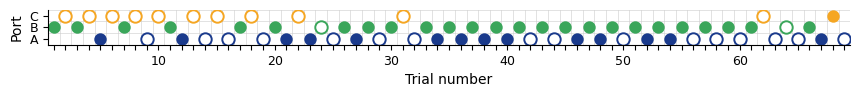

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


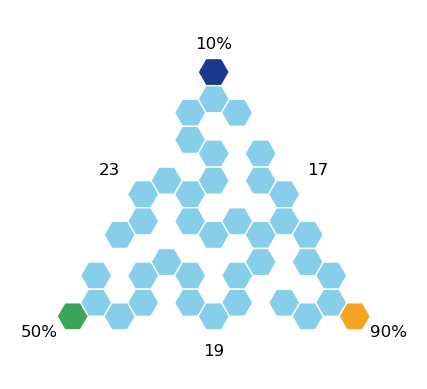

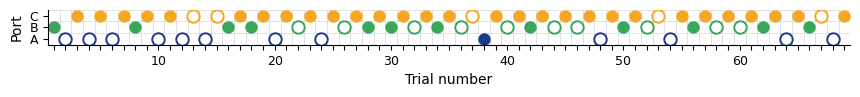

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


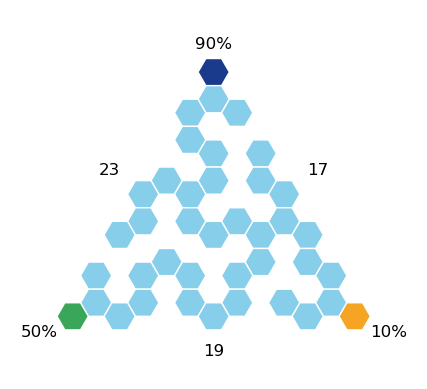

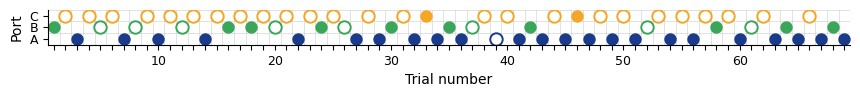

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


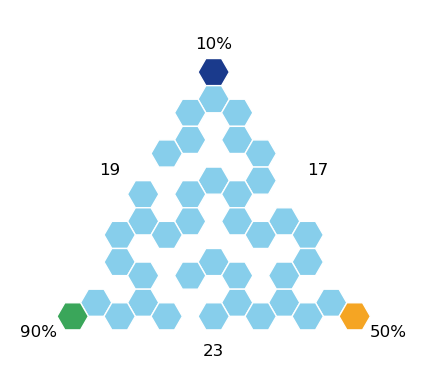

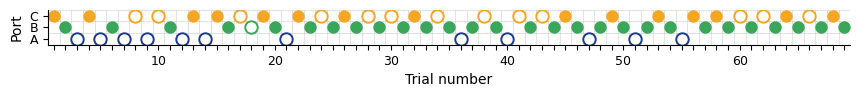

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


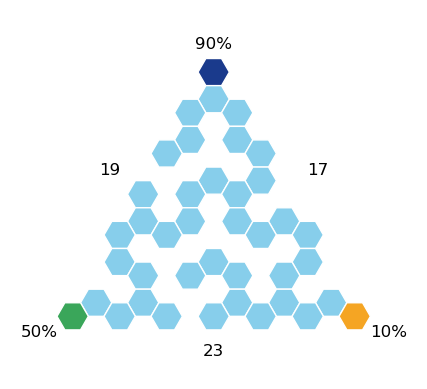

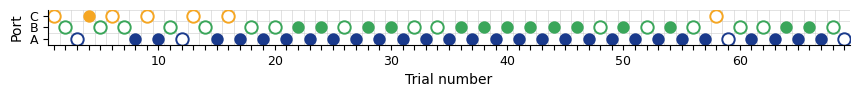

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


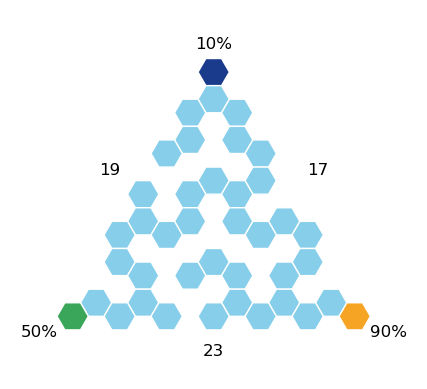

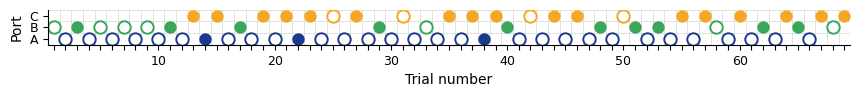

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


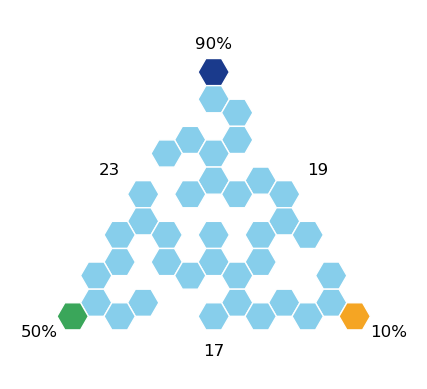

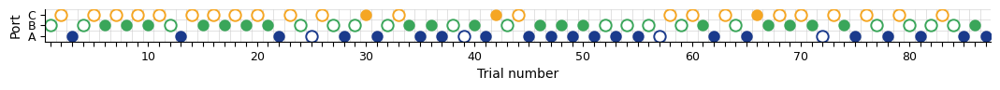

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


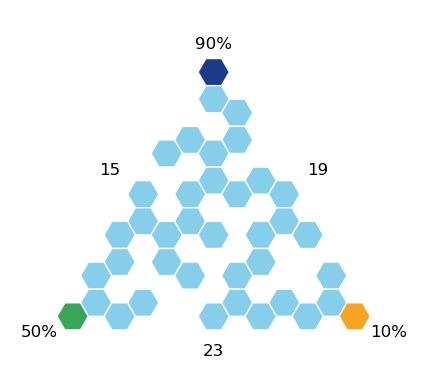

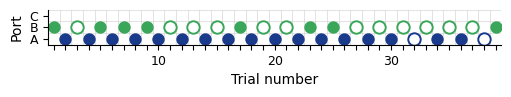

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


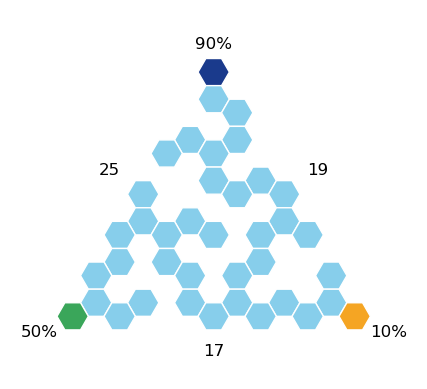

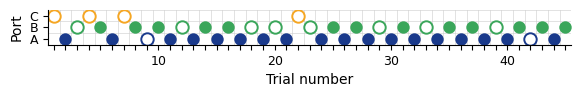

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


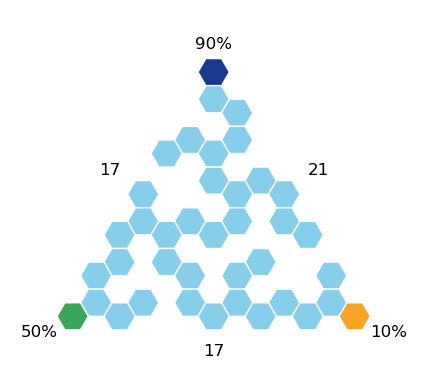

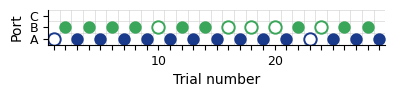

{'nwb_file_name': 'Toby20250323_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


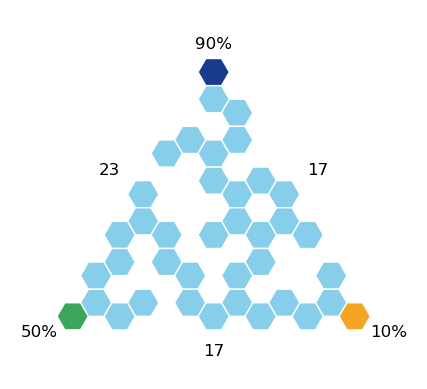

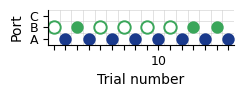

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


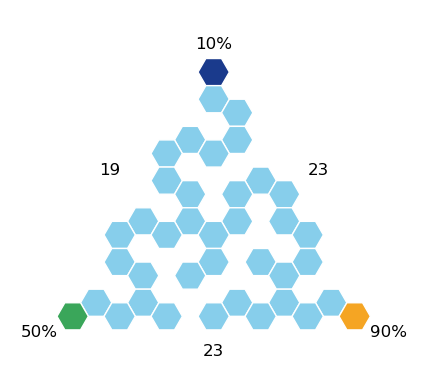

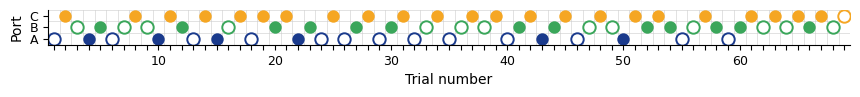

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


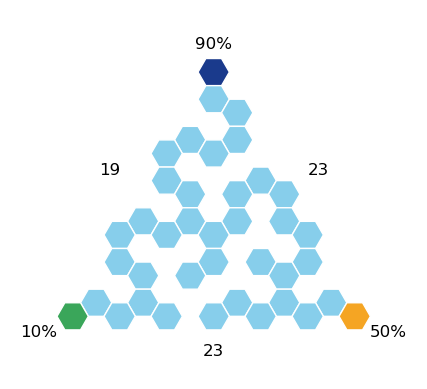

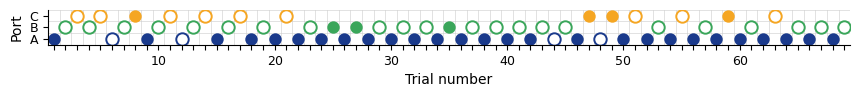

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


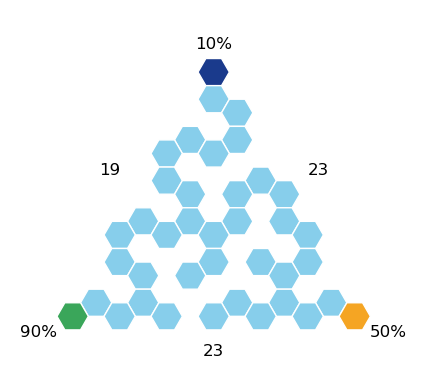

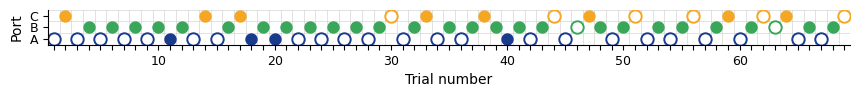

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


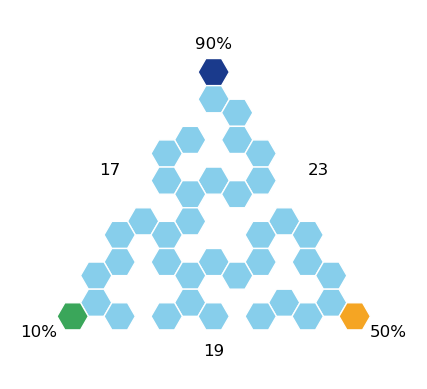

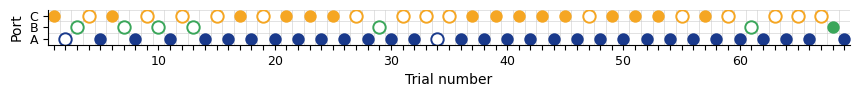

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


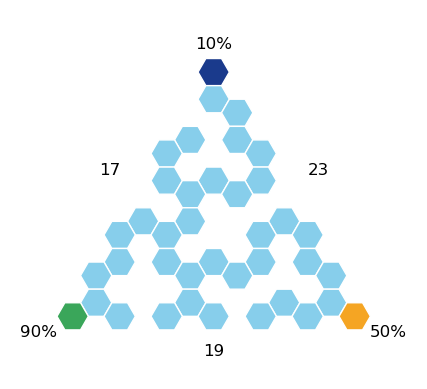

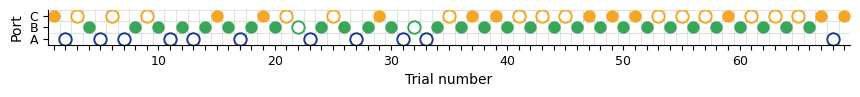

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


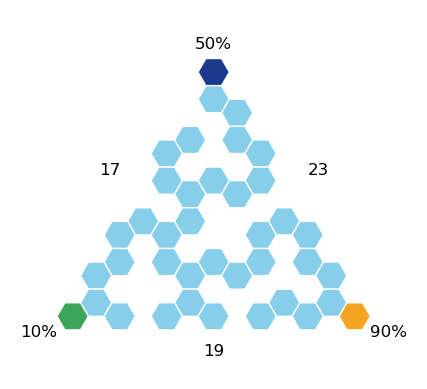

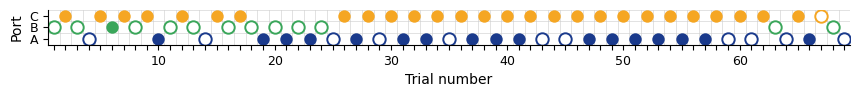

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


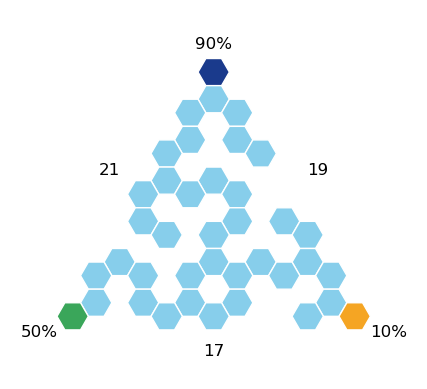

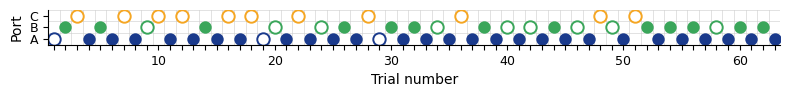

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


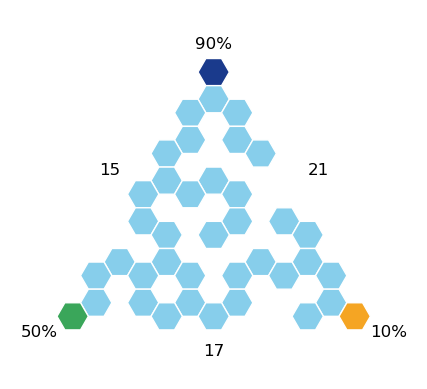

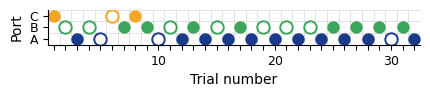

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


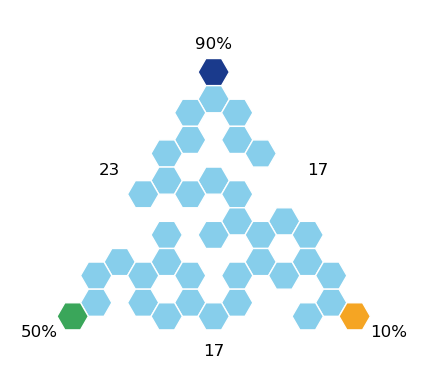

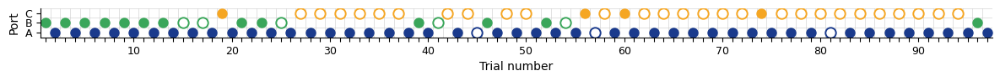

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 5, 'block': 4}: HexmazeNoStim


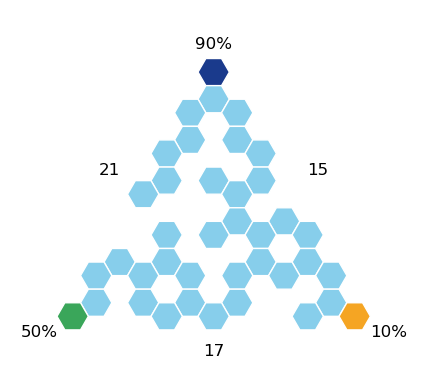

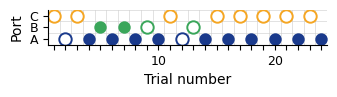

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


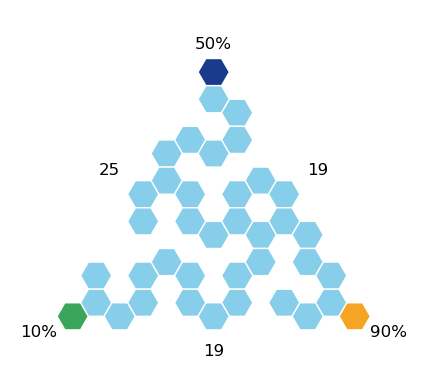

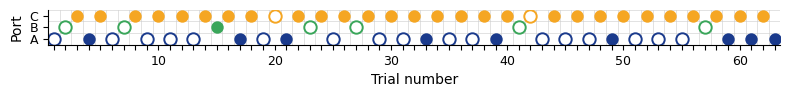

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


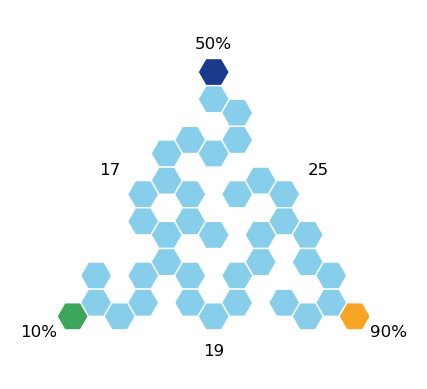

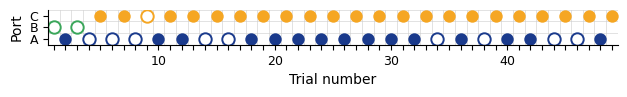

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


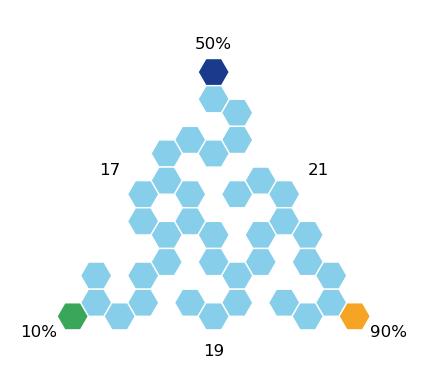

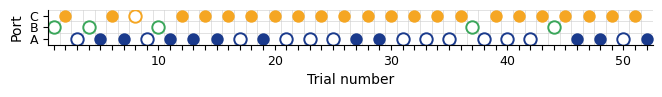

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


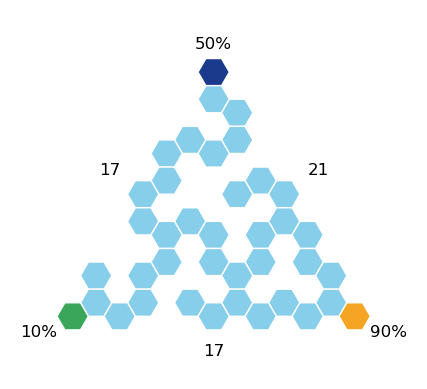

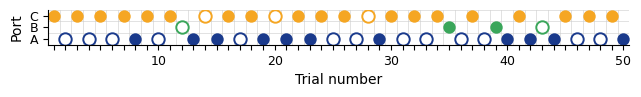

{'nwb_file_name': 'Toby20250324_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


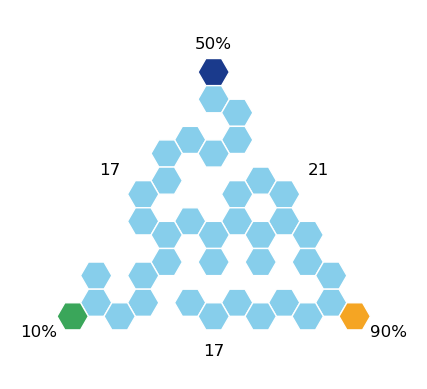

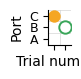

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


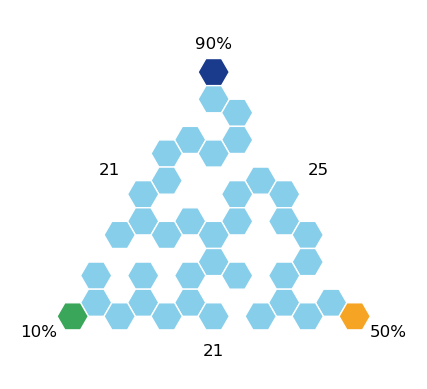

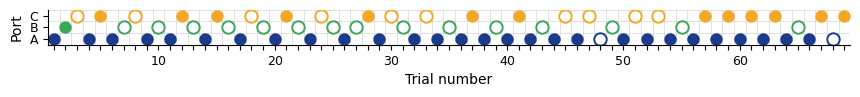

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


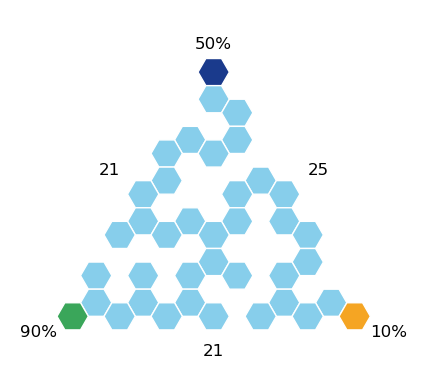

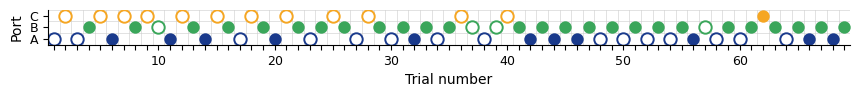

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


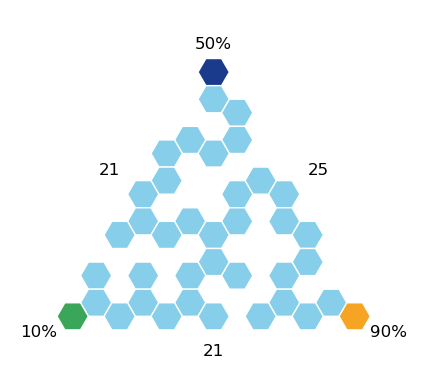

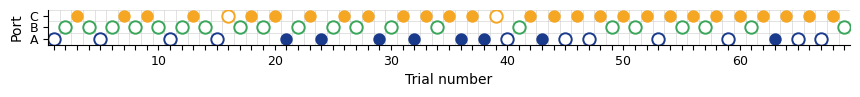

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


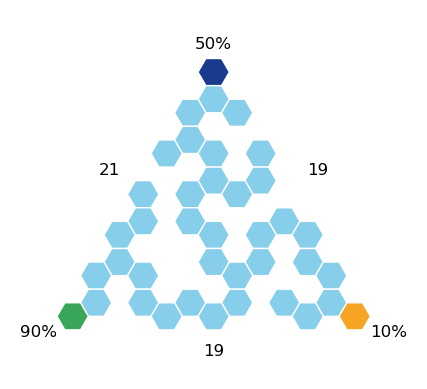

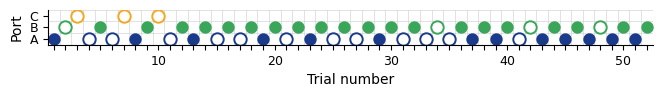

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


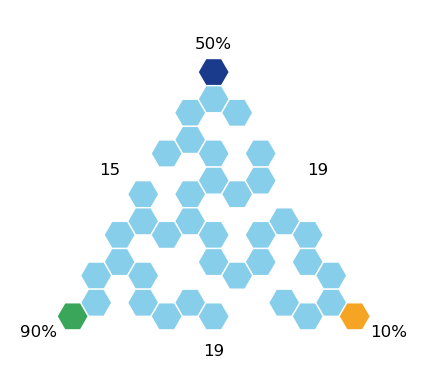

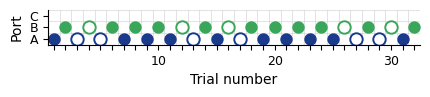

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


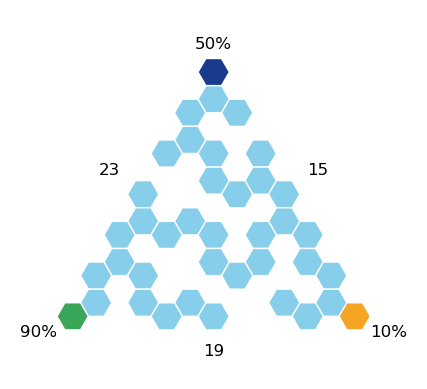

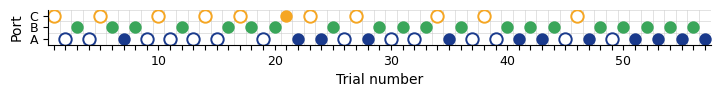

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


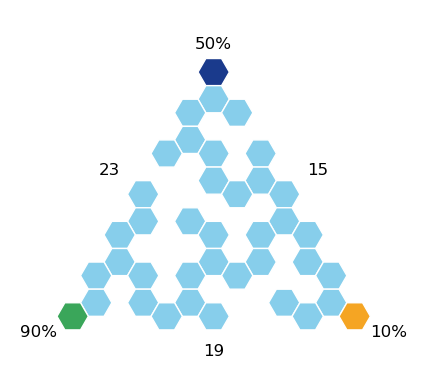

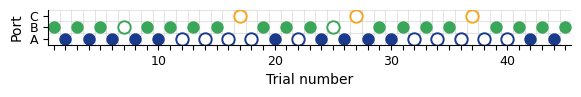

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 3, 'block': 5}: HexmazeNoStim


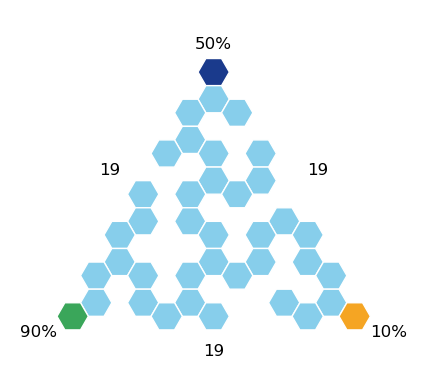

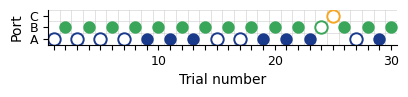

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


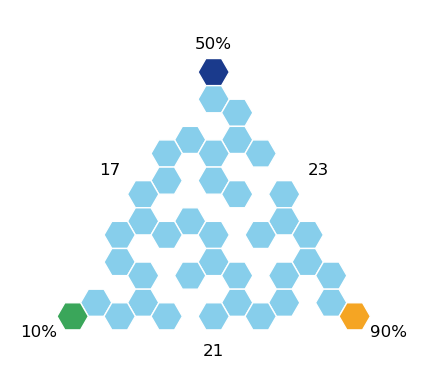

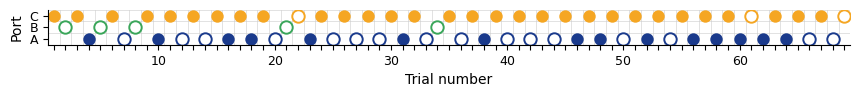

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


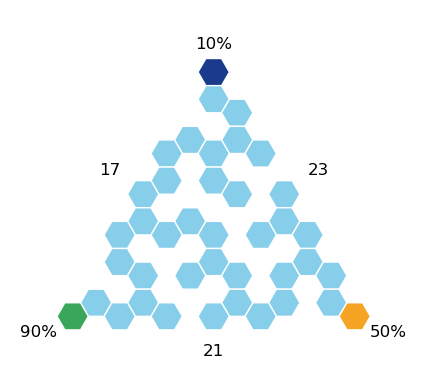

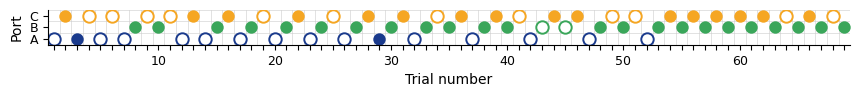

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


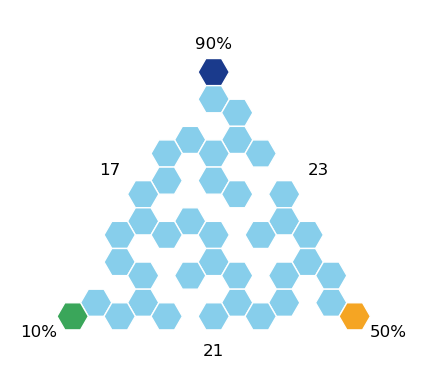

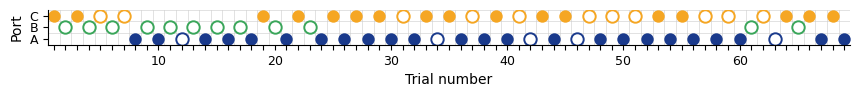

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


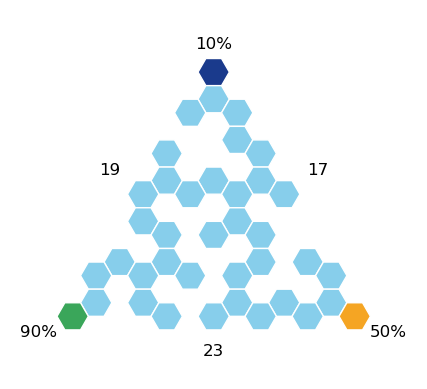

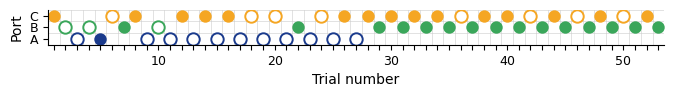

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


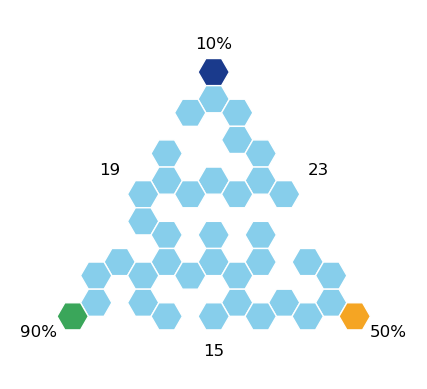

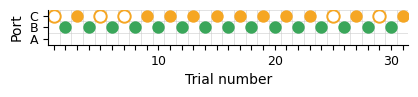

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


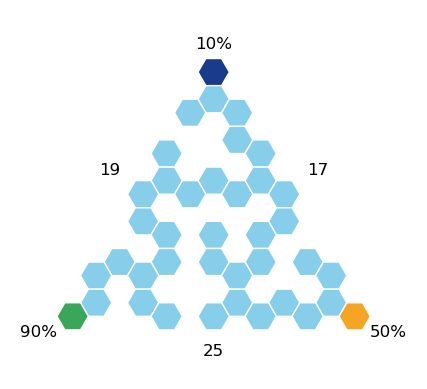

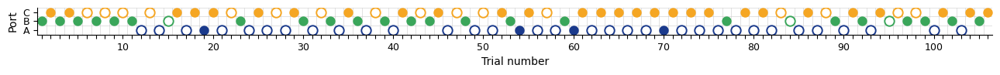

{'nwb_file_name': 'Toby20250325_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


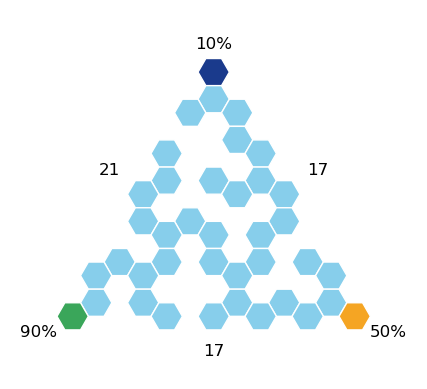

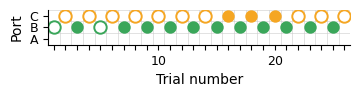

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


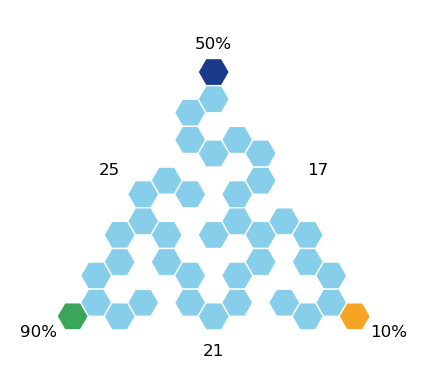

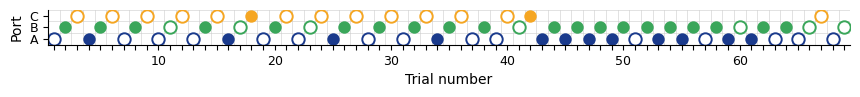

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


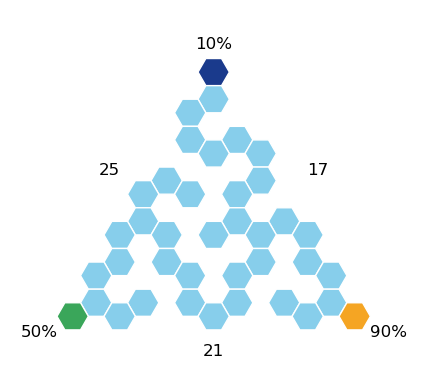

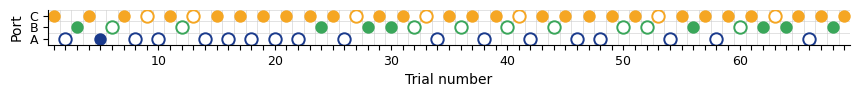

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


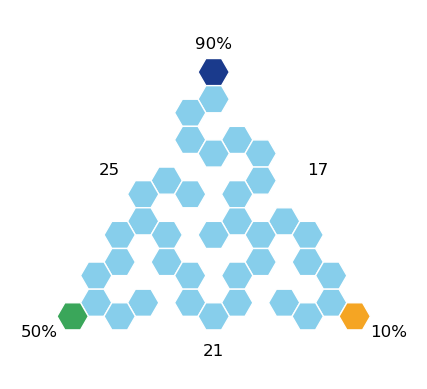

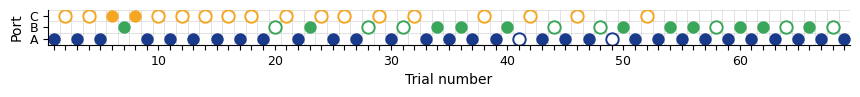

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


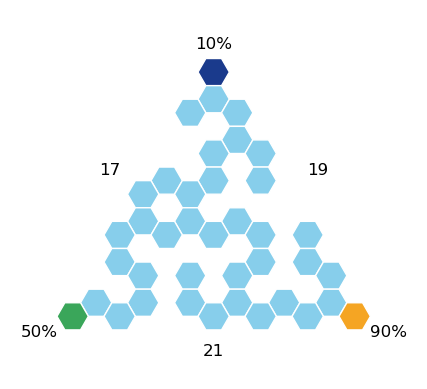

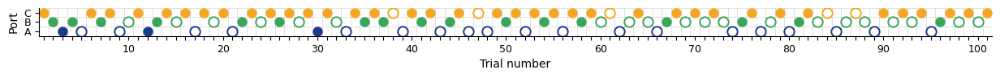

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


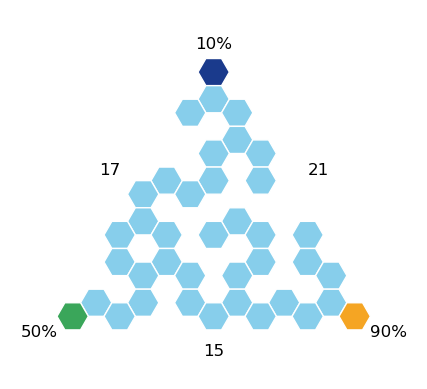

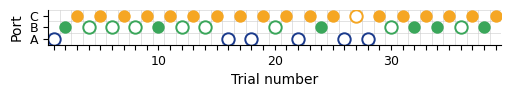

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


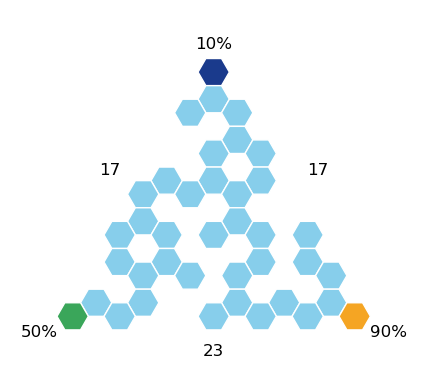

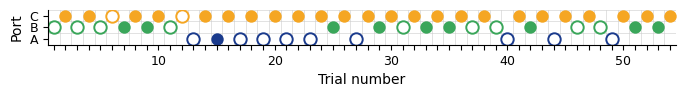

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


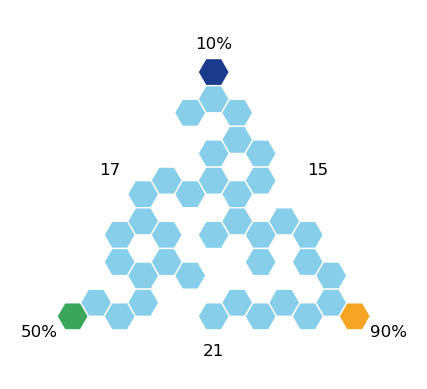

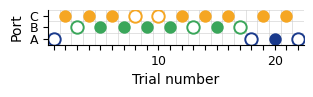

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


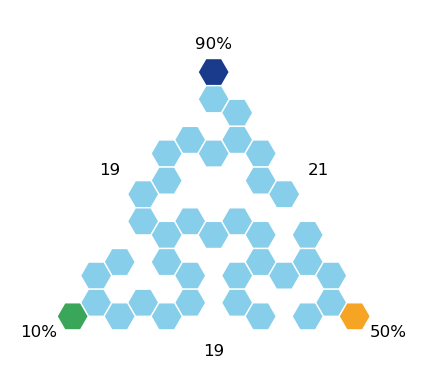

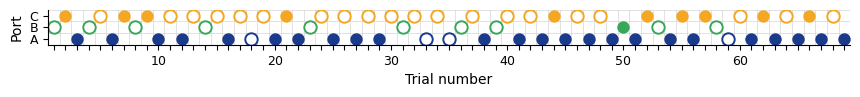

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


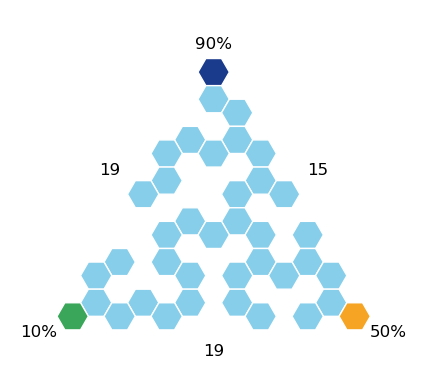

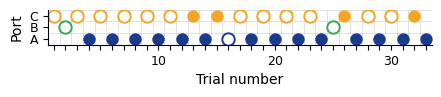

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


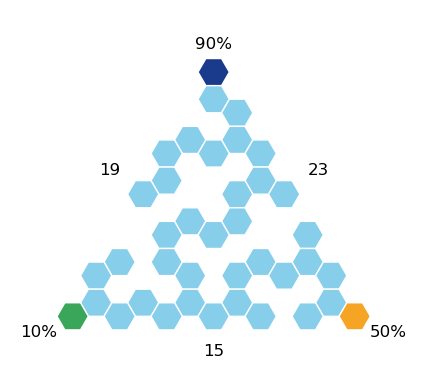

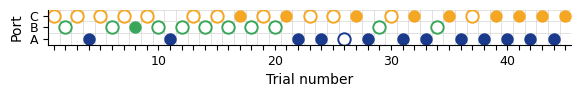

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 5, 'block': 4}: HexmazeNoStim


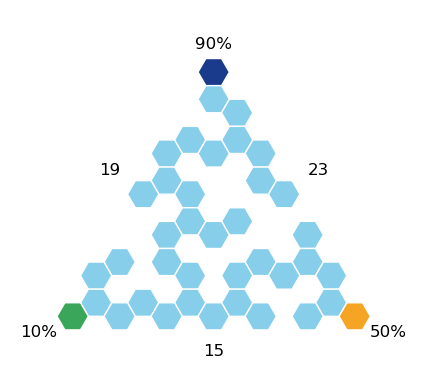

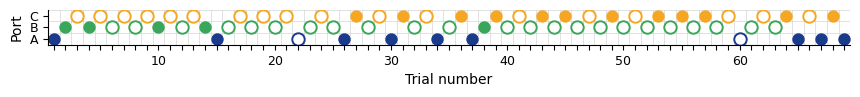

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


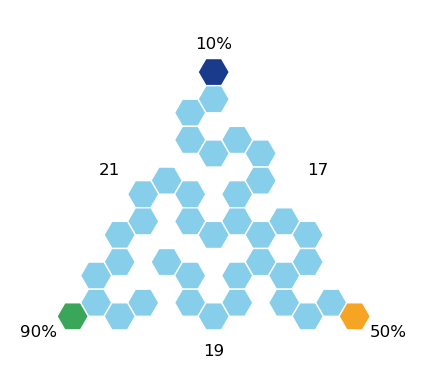

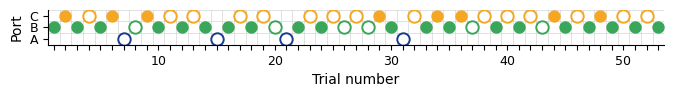

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


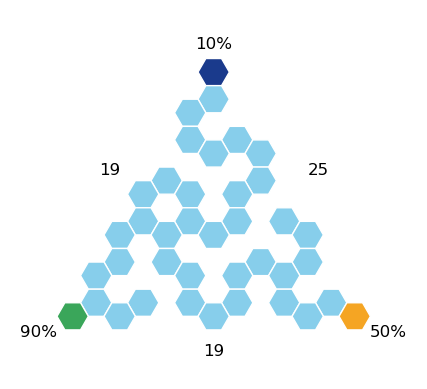

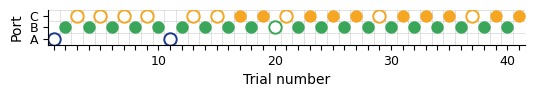

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


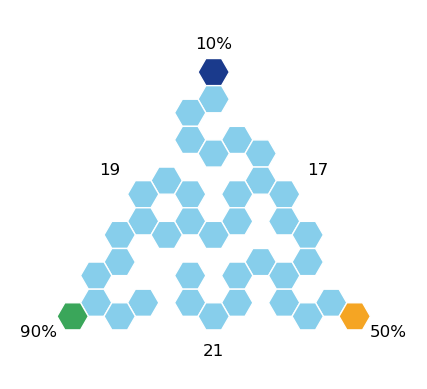

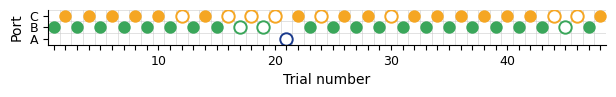

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


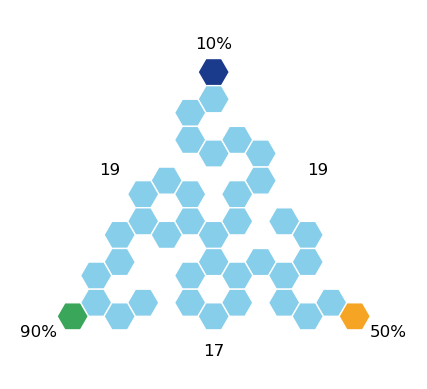

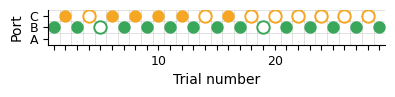

{'nwb_file_name': 'Toby20250327_.nwb', 'epoch': 7, 'block': 5}: HexmazeNoStim


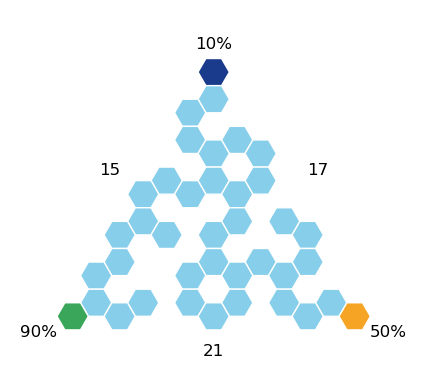

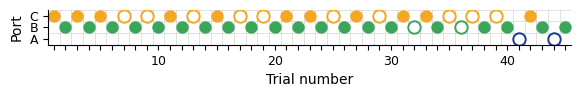

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


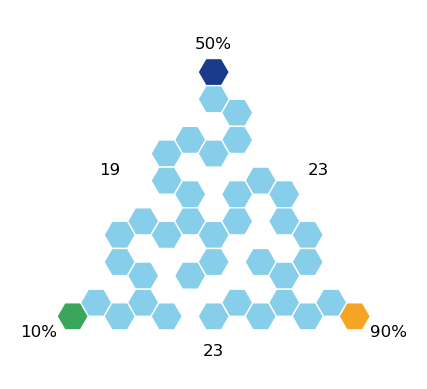

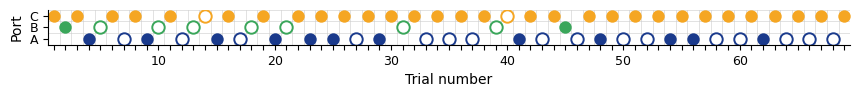

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


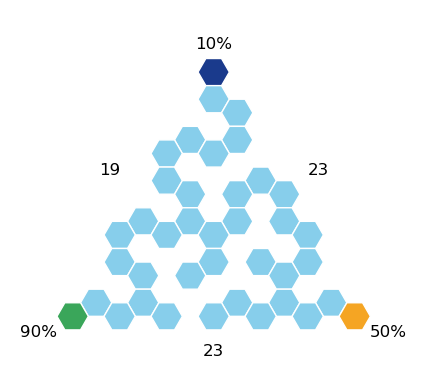

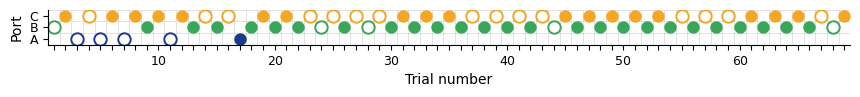

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


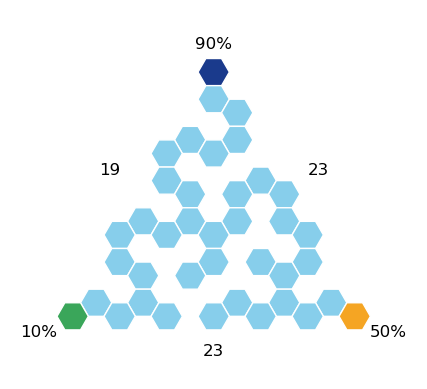

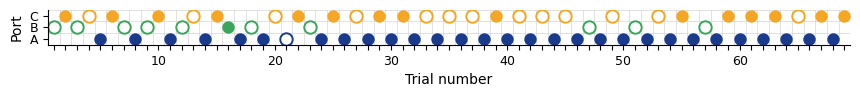

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


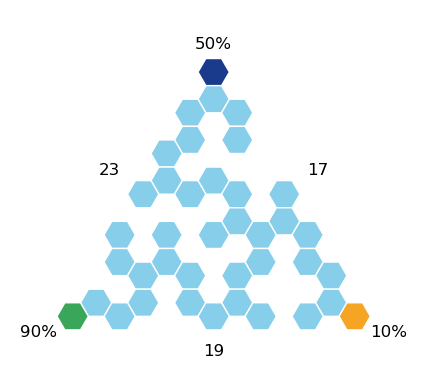

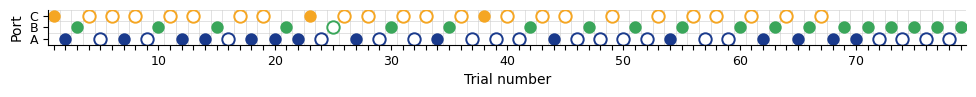

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


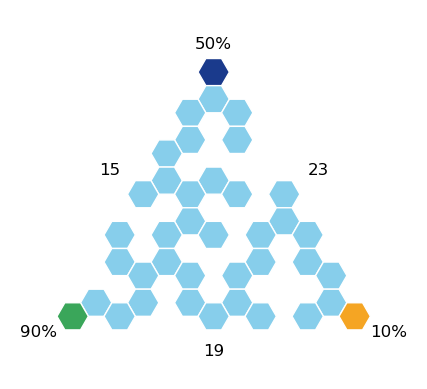

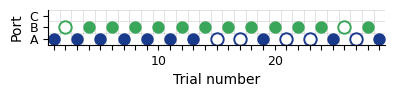

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


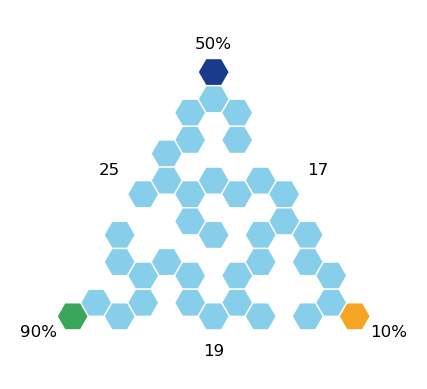

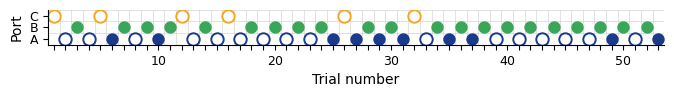

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


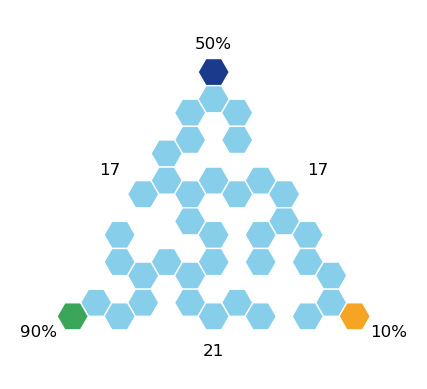

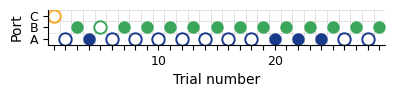

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 3, 'block': 5}: HexmazeNoStim


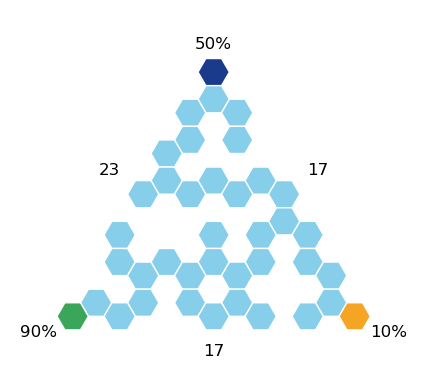

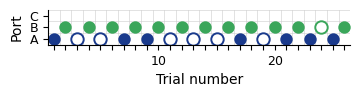

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


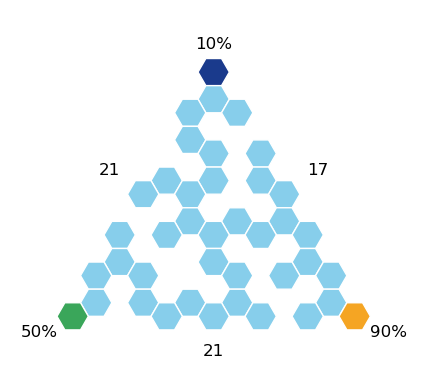

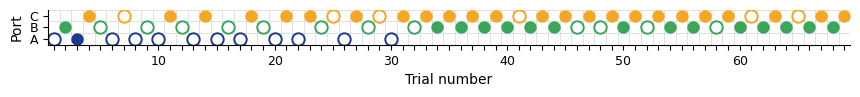

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


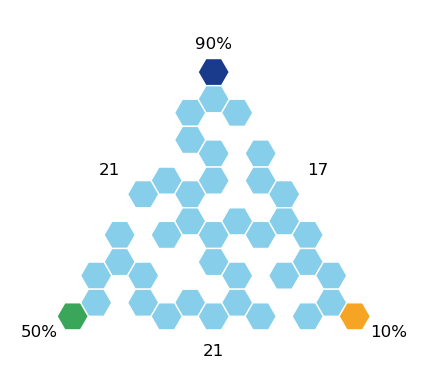

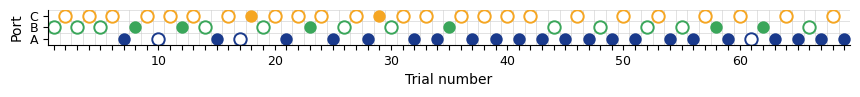

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


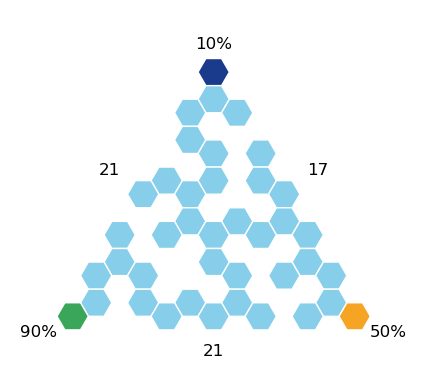

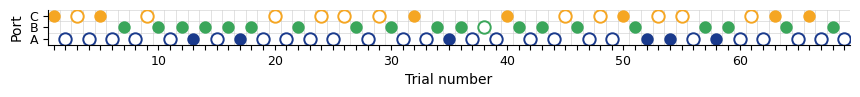

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 7, 'block': 1}: HexmazeNoStim


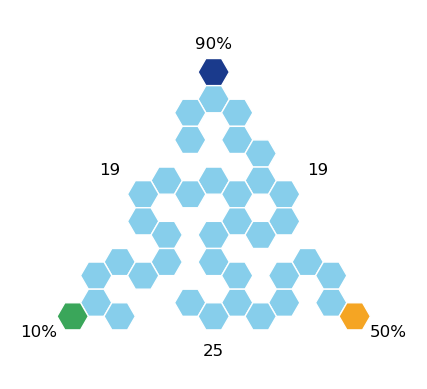

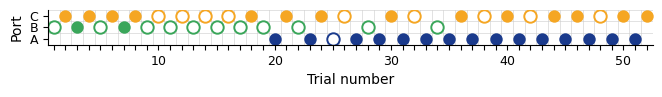

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 7, 'block': 2}: HexmazeNoStim


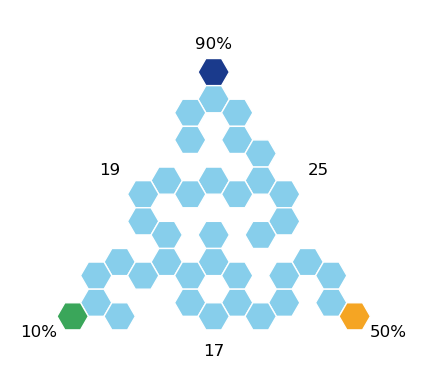

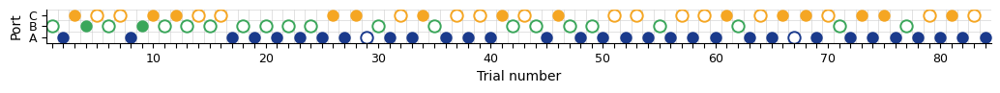

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 7, 'block': 3}: HexmazeNoStim


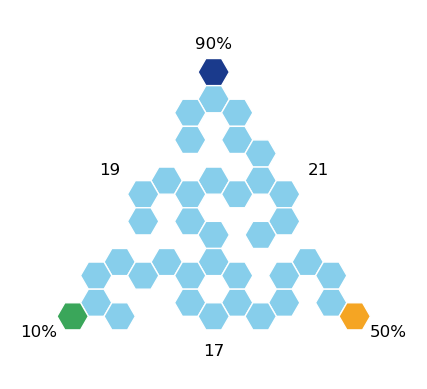

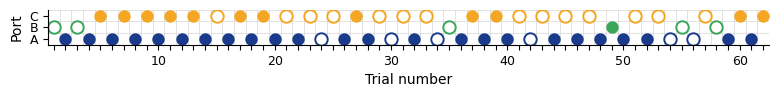

{'nwb_file_name': 'Toby20250328_.nwb', 'epoch': 7, 'block': 4}: HexmazeNoStim


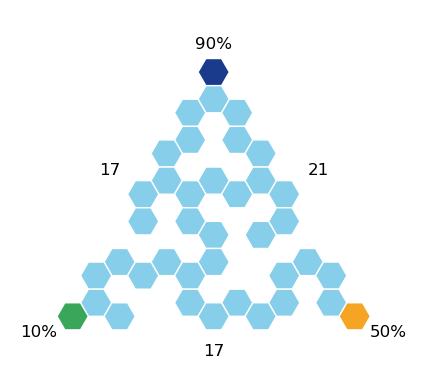

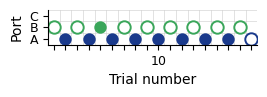

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


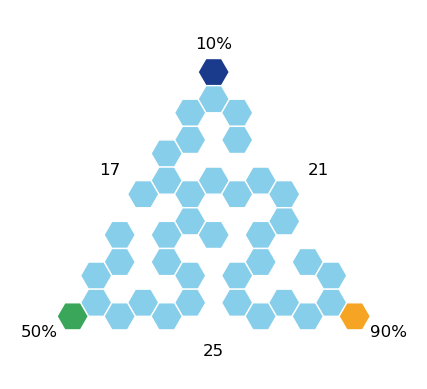

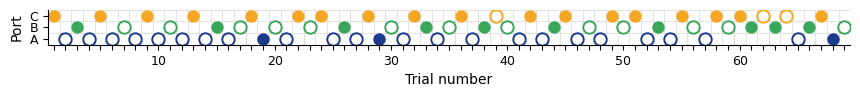

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


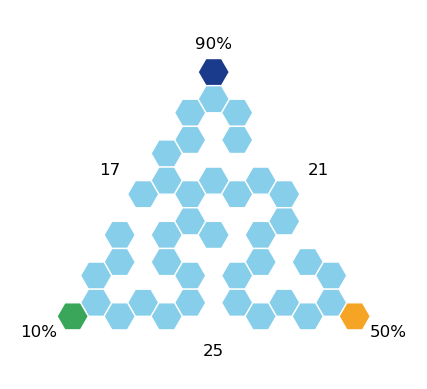

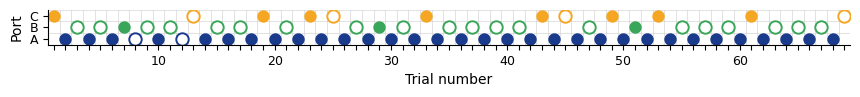

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


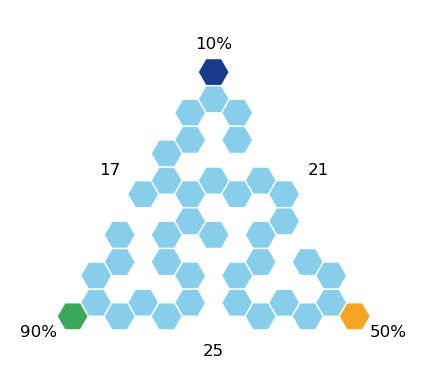

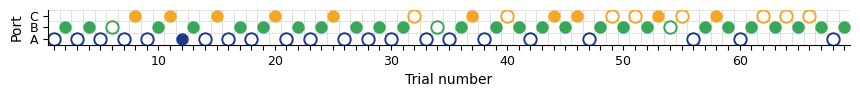

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


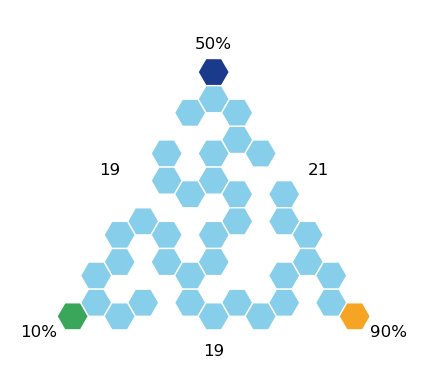

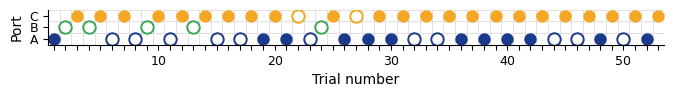

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


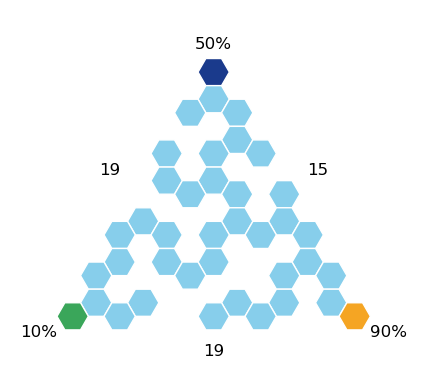

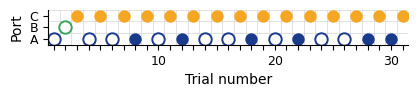

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


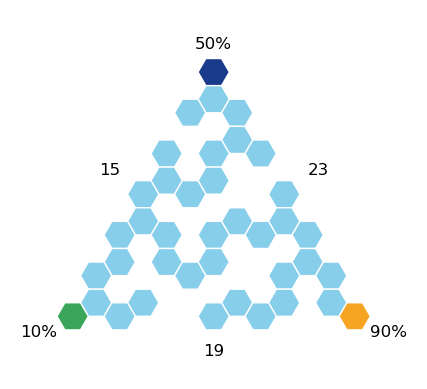

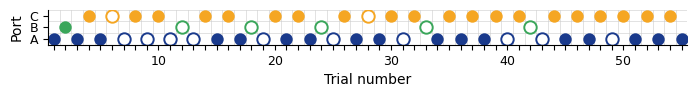

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


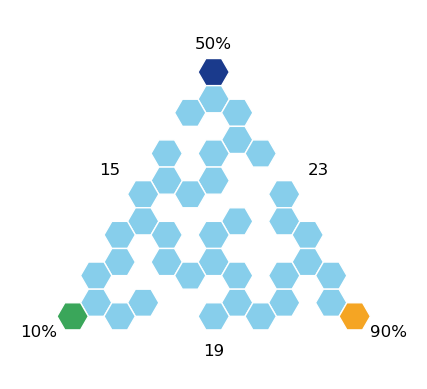

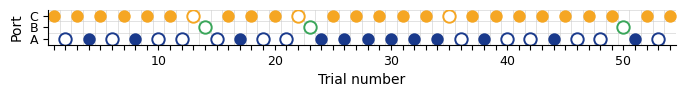

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 3, 'block': 5}: HexmazeNoStim


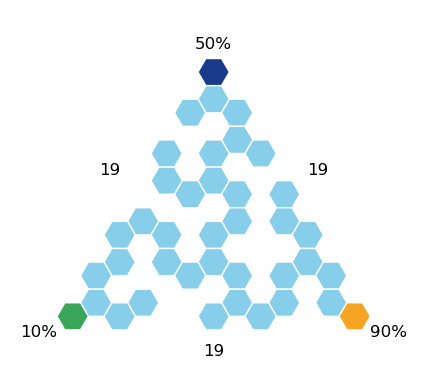

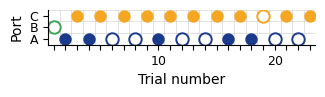

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 5, 'block': 1}: HexmazeNoStim


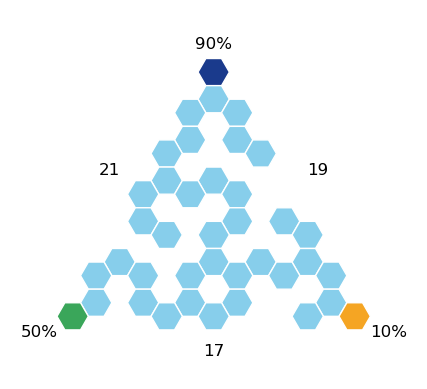

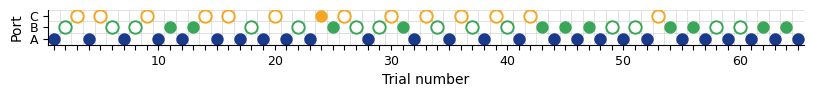

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 5, 'block': 2}: HexmazeNoStim


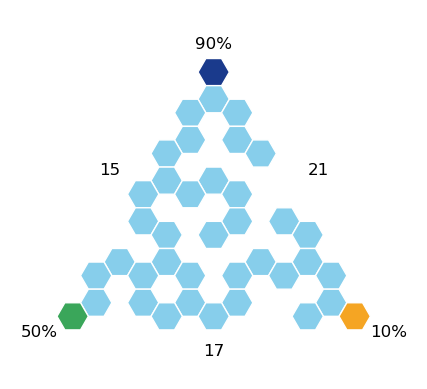

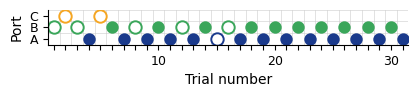

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 5, 'block': 3}: HexmazeNoStim


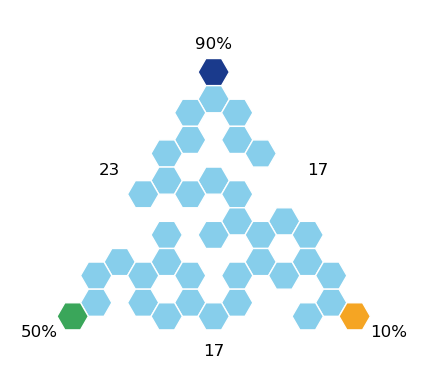

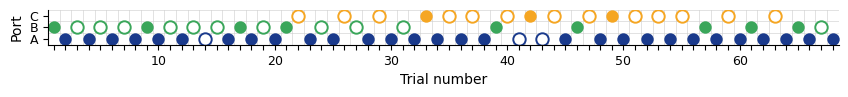

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 5, 'block': 4}: HexmazeNoStim


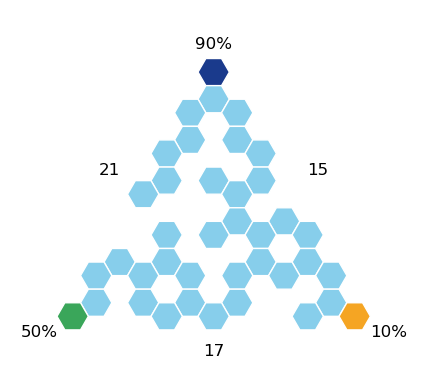

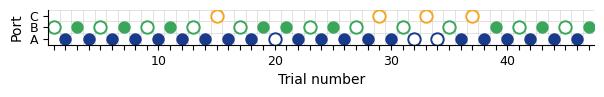

{'nwb_file_name': 'Toby20250329_.nwb', 'epoch': 5, 'block': 5}: HexmazeNoStim


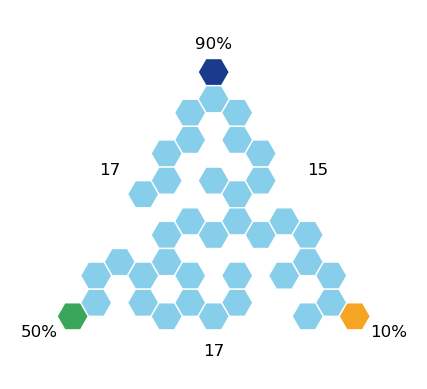

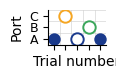

{'nwb_file_name': 'Toby20250330_.nwb', 'epoch': 1, 'block': 1}: HexmazeNoStim


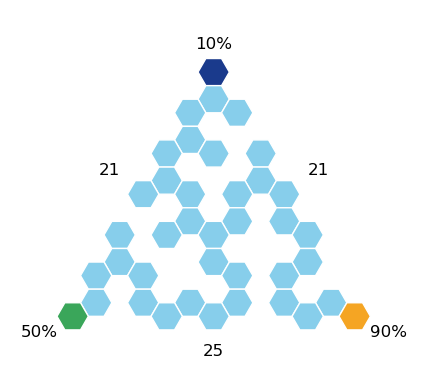

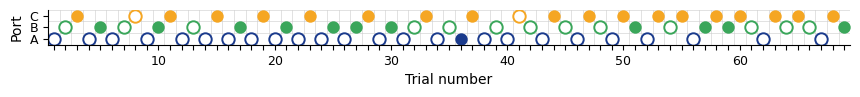

{'nwb_file_name': 'Toby20250330_.nwb', 'epoch': 1, 'block': 2}: HexmazeNoStim


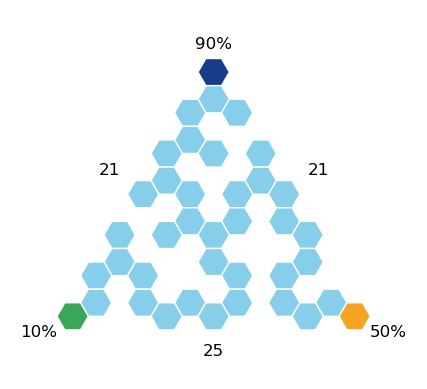

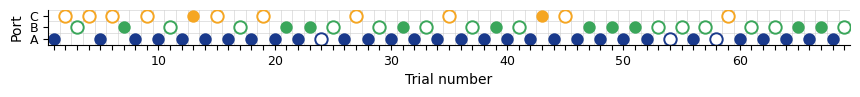

{'nwb_file_name': 'Toby20250330_.nwb', 'epoch': 1, 'block': 3}: HexmazeNoStim


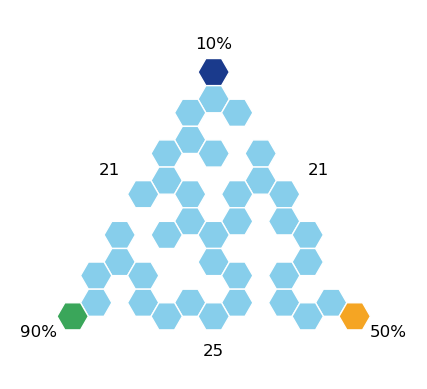

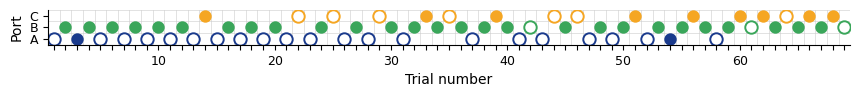

{'nwb_file_name': 'Toby20250330_.nwb', 'epoch': 3, 'block': 1}: HexmazeNoStim


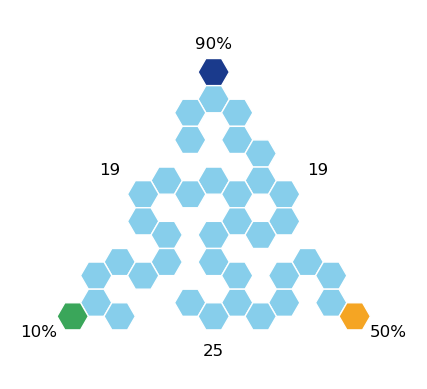

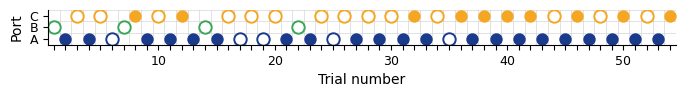

{'nwb_file_name': 'Toby20250330_.nwb', 'epoch': 3, 'block': 2}: HexmazeNoStim


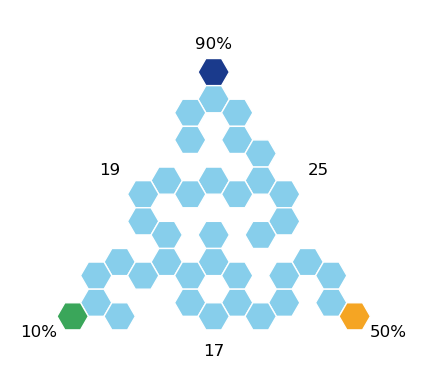

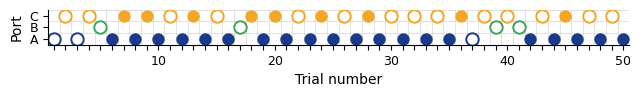

{'nwb_file_name': 'Toby20250330_.nwb', 'epoch': 3, 'block': 3}: HexmazeNoStim


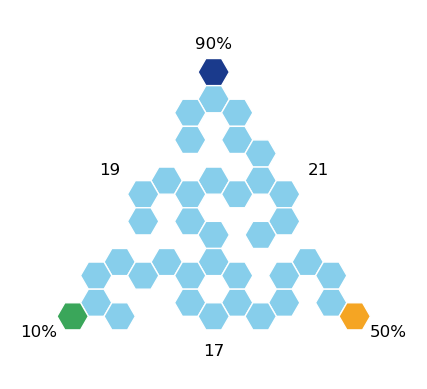

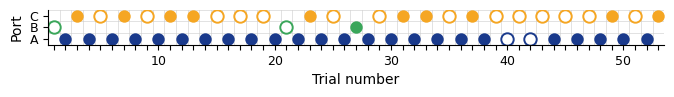

{'nwb_file_name': 'Toby20250330_.nwb', 'epoch': 3, 'block': 4}: HexmazeNoStim


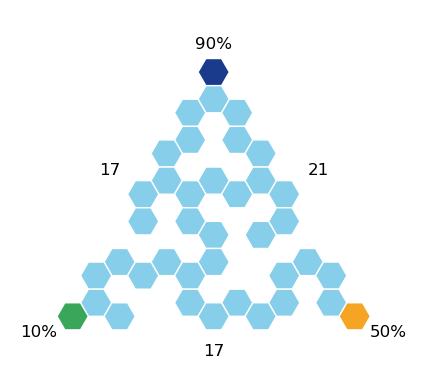

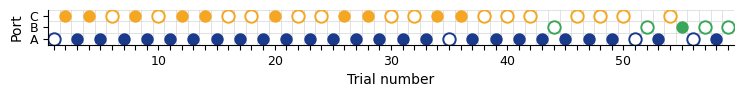

In [6]:
entry = HexMazeBlock() & "nwb_file_name LIKE 'Toby%'"
nwb_file_names = list(set(entry.fetch("nwb_file_name")))

for key in entry.fetch("KEY", order_by="nwb_file_name, epoch, block"):
    print(f"{key}: {(sgc.Session() & key).fetch('session_description')[0]}")
    block = HexMazeBlock() & key
    trials = HexMazeBlock.Trial() & key
    # Plot maze
    maze = block.fetch("config_id")[0]
    reward_probs = [int(block.fetch("p_a")[0]), int(block.fetch("p_b")[0]), int(block.fetch("p_c")[0])]
    plot_hex_maze(maze, show_barriers=False, show_stats=True, show_hex_labels=False, reward_probabilities=reward_probs,
                  highlight_hexes=[{1}, {2}, {3}], highlight_colors=[HEX_COLORS["A"], HEX_COLORS["B"], HEX_COLORS["C"]])
    # Plot trials
    fig, ax = plot_port_choices(trials.fetch("end_port"), trials.fetch("reward"))
    display(fig)
    plt.close(fig)

BraveLu20240516_.nwb: RippleStimDelayNoDelay


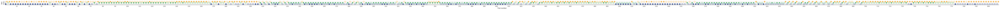

BraveLu20240518_.nwb: RippleStimDelayNoDelay


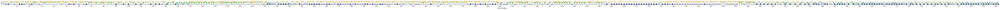

BraveLu20240519_.nwb: RippleStimDelayNoDelay


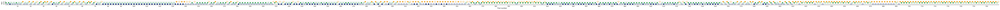

BraveLu20240615_.nwb: ThetaStimLatePhase


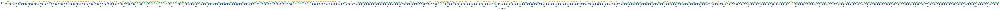

BraveLu20240617_.nwb: ThetaStimLatePhase


KeyboardInterrupt: 

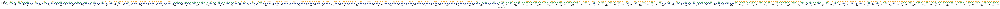

In [ ]:
entry = HexMazeBlock() #& "nwb_file_name LIKE 'IM-189%'"
nwb_file_names = list(set(entry.fetch("nwb_file_name")))

for nwb_file_name in sorted(nwb_file_names):
    epochs = (HexMazeBlock() & key).fetch(epoch)
    key = {"nwb_file_name": nwb_file_name}
    print(f"{nwb_file_name}: {(sgc.Session() & key).fetch('session_description')[0]}")
    trials = HexMazeBlock.Trial() & key
    fig, ax = plot_port_choices(trials.fetch("end_port"), trials.fetch("reward"))
    display(fig)
    plt.close(fig)